## Close Visualization of all the motion segments

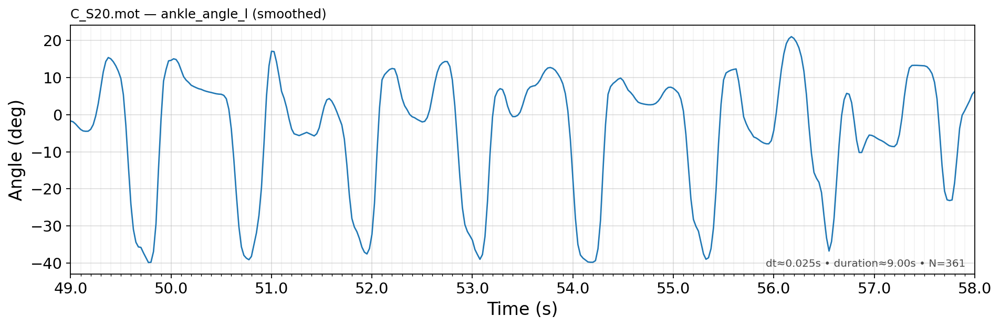

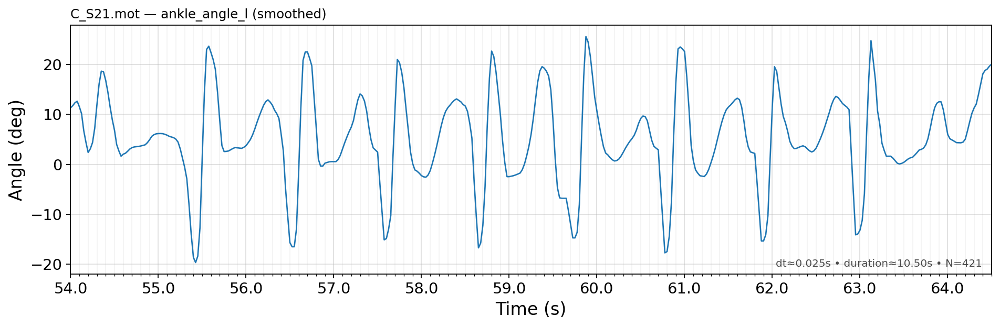

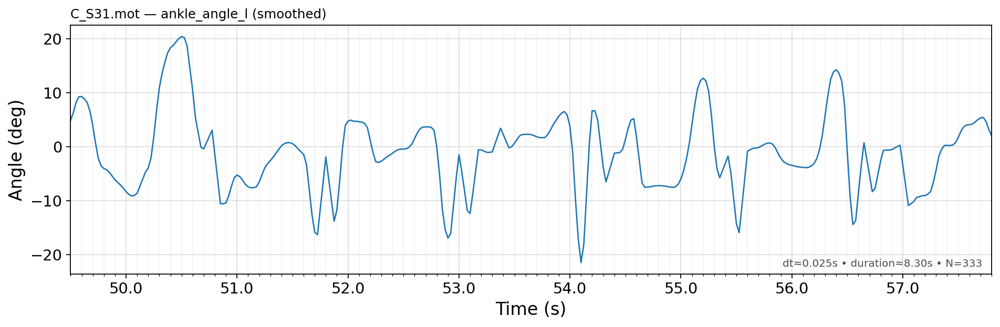

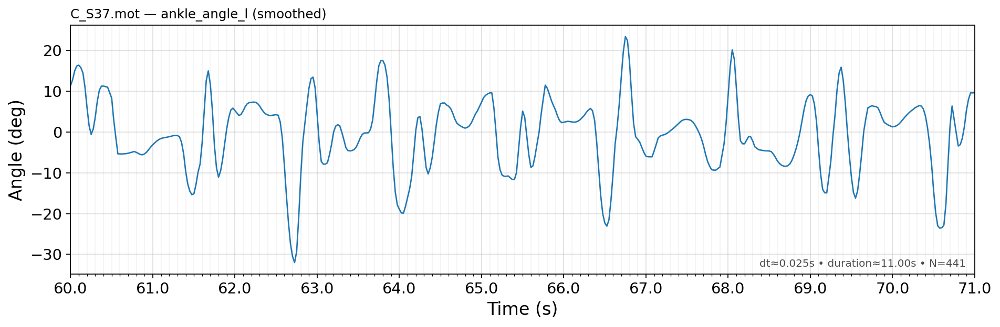

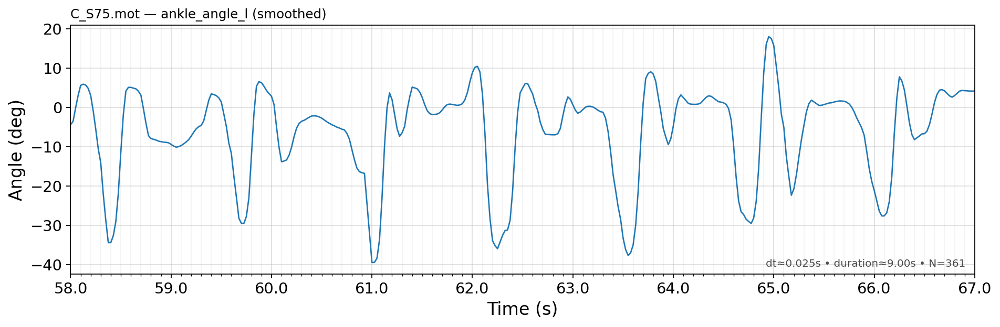

...

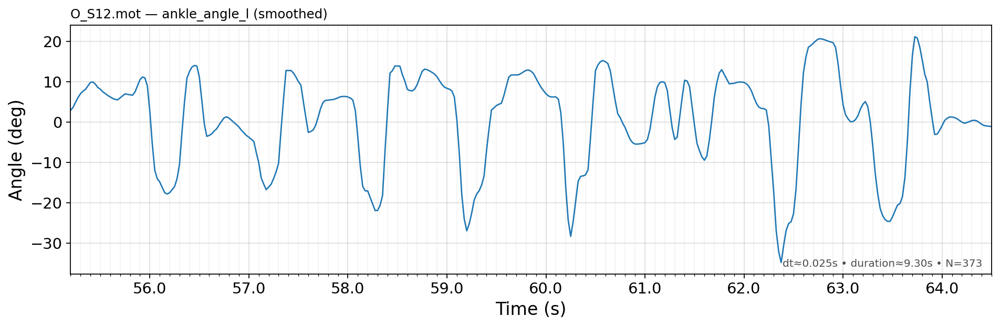

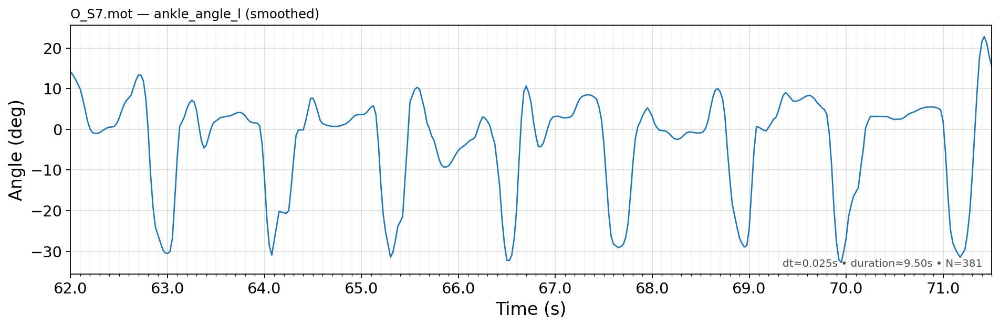

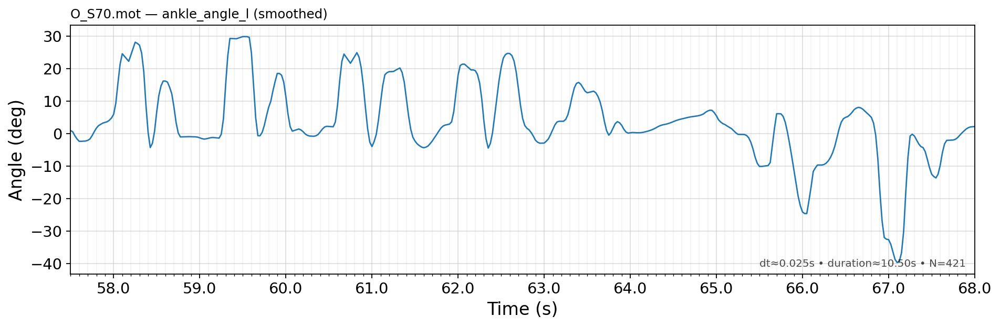

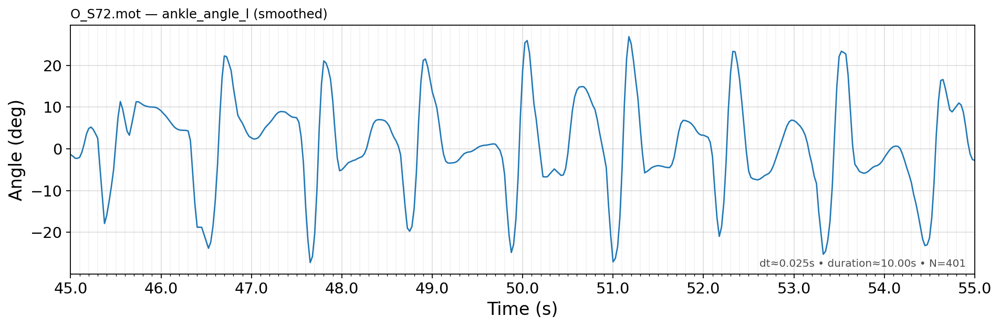

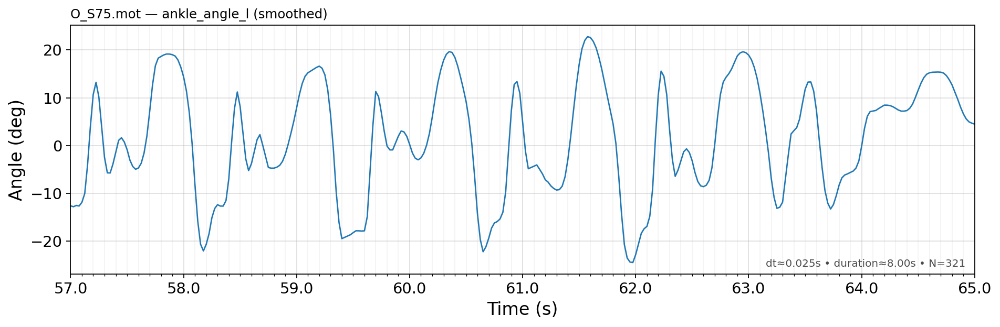

In [103]:
# ======= Preview each .mot file with smoothed angle and readable time ruler =======
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator, FuncFormatter
from io import StringIO
import re
import math

# ---------------- Configuration ----------------
INPUT_DIR   = Path("/Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections")
ANGLE_NAME  = "ankle_angle_l"   # change to any column present in your .mot files
FIGSIZE     = (12, 4)

# Light smoothing (seconds); tweak if needed
SMOOTH_MED_SEC  = 0.12
SMOOTH_MEAN_SEC = 0.08

# Ruler/grid style
MINOR_GRID_STEP = 0.1   # vertical grid lines every 0.1 s (no labels)
MAX_MAJOR_LABELS = 12   # we’ll choose a major tick step so labels ≤ this
LABEL_DECIMALS = 1      # 1 decimal is usually enough
# Saving (optional)
SAVE_PNG   = False
OUT_DIR    = INPUT_DIR / "Previews"
# ------------------------------------------------

def read_mot(path: Path):
    """Read OpenSim .mot file body into DataFrame; return (df, time_col)."""
    with path.open("r", encoding="utf-8", errors="ignore") as f:
        lines = f.readlines()
    start = 0
    for i, ln in enumerate(lines[:300]):
        if ln.strip().lower() == "endheader":
            start = i + 1
            break
    body = "".join(lines[start:])
    df = pd.read_csv(StringIO(body), delim_whitespace=True, comment="#")
    time_col = next((c for c in ["time","Time","TIME"] if c in df.columns), df.columns[0])
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="ignore")
    return df, time_col

def find_angle_column(df: pd.DataFrame, preferred: str):
    lower = {c.lower(): c for c in df.columns}
    if preferred.lower() in lower:
        return lower[preferred.lower()]
    pats = [r"knee.*angle.*_r", r"ankle.*angle.*_r", r"hip.*(flex|adduct|angle).*_r",
            r"knee.*angle", r"ankle.*angle", r"hip.*(flex|adduct|angle)"]
    for pat in pats:
        for c in df.columns:
            if re.search(pat, c, re.I):
                return c
    for c in df.columns:
        if c.lower() != "time":
            return c
    return None

def smooth_signal(y, t, med_sec=0.12, mean_sec=0.08):
    y = pd.Series(pd.to_numeric(y, errors="coerce"))
    t = np.asarray(t)
    if len(t) < 3:
        return y.to_numpy()
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0:
        return y.to_numpy()
    w_med  = max(3, int(round(med_sec / dt)))
    w_mean = max(3, int(round(mean_sec / dt)))
    y_med  = y.rolling(w_med,  center=True, min_periods=1).median()
    y_s    = y_med.rolling(w_mean, center=True, min_periods=1).mean()
    return y_s.to_numpy()

def choose_major_step(duration: float, max_labels: int = 12):
    """Pick a nice major tick step so we show ≤ max_labels labels."""
    if not np.isfinite(duration) or duration <= 0:
        return 0.5
    # nice steps (seconds). we’ll scale by powers of 10 if needed.
    nice = np.array([0.1, 0.2, 0.5, 1, 2, 5])
    # scale duration to order of magnitude
    pow10 = 10 ** math.floor(math.log10(duration)) if duration > 0 else 1
    candidates = []
    for k in range(-2, 4):  # explore a few decades
        candidates.extend(list(nice * (pow10 * (10 ** k))))
    candidates = sorted([s for s in candidates if s >= 0.1])  # don’t go below 0.1 s
    for step in candidates:
        if duration / step <= max_labels:
            return step
    # fallback: last candidate
    return candidates[-1] if candidates else 1.0

def time_formatter(decimals=1):
    fmt = f"{{:.{decimals}f}}"
    return FuncFormatter(lambda x, pos: fmt.format(x))

def preview_all_files():
    mot_files = sorted(INPUT_DIR.glob("*.mot"), key=lambda p: p.name.lower())
    if not mot_files:
        raise FileNotFoundError(f"No .mot files found in {INPUT_DIR}")

    if SAVE_PNG:
        OUT_DIR.mkdir(parents=True, exist_ok=True)

    for path in mot_files:
        try:
            df, time_col = read_mot(path)
            t = pd.to_numeric(df[time_col], errors="coerce").to_numpy()
            angle_col = find_angle_column(df, ANGLE_NAME)
            if angle_col is None or angle_col not in df.columns:
                print(f"[skip] {path.name}: angle column not found.")
                continue
            y_raw = pd.to_numeric(df[angle_col], errors="coerce").to_numpy()
            y_s   = smooth_signal(y_raw, t, SMOOTH_MED_SEC, SMOOTH_MEAN_SEC)

            # figure out sensible major tick step
            tmin, tmax = np.nanmin(t), np.nanmax(t)
            duration = float(tmax - tmin) if len(t) else np.nan
            major_step = choose_major_step(duration, MAX_MAJOR_LABELS)

            # --- Plot ---
            fig, ax = plt.subplots(figsize=FIGSIZE)
            ax.plot(t, y_s, linewidth=1.2)
            ax.set_title(f"{path.name} — {angle_col} (smoothed)", loc="left", fontsize=11)
            ax.set_xlabel("Time (s)")
            ax.set_ylabel("Angle (deg)")

            # major labels (readable), minor grid every 0.1 s as a ruler
            ax.xaxis.set_major_locator(MultipleLocator(major_step))
            ax.xaxis.set_major_formatter(time_formatter(LABEL_DECIMALS))
            ax.grid(True, which="major", alpha=0.4)
            if MINOR_GRID_STEP:
                ax.xaxis.set_minor_locator(MultipleLocator(MINOR_GRID_STEP))
                ax.grid(True, which="minor", alpha=0.15)

            # x/y limits
            if np.isfinite(tmin) and np.isfinite(tmax):
                ax.set_xlim(tmin, tmax)
            ylo, yhi = np.nanmin(y_s), np.nanmax(y_s)
            if np.isfinite(ylo) and np.isfinite(yhi) and yhi > ylo:
                pad = 0.05 * (yhi - ylo)
                ax.set_ylim(ylo - pad, yhi + pad)

            # footer info
            dt = float(np.nanmedian(np.diff(t))) if len(t) > 1 else np.nan
            text = f"dt≈{dt:.3f}s • duration≈{duration:.2f}s • N={len(t)}"
            ax.text(0.99, 0.02, text, transform=ax.transAxes, ha="right", va="bottom", fontsize=9, alpha=0.7)

            plt.tight_layout()

            if SAVE_PNG:
                out = OUT_DIR / f"{path.stem}_{angle_col}_preview.png"
                plt.savefig(out, dpi=180)
                print(f"saved: {out}")

            plt.show()

        except Exception as e:
            print(f"[error] {path.name}: {e}")

# Run
preview_all_files()


## Selection of the wanted motion segment

In [107]:
from pathlib import Path
import pandas as pd
import numpy as np
import re
from io import StringIO

# --- paths ---
BASE_DIR = Path("/Users/afonsoamaral/Desktop/StatisticInputs")
OUT_DIR  = BASE_DIR / "ManualSelections"
OUT_DIR.mkdir(exist_ok=True)

# --- your fixed dict (single braces!) ---
MANUAL_TIMES = {
    "H_S11.mot": (34.5, 41.5),
    "H_S12.mot": (41.5, 49.5),
    "H_S13.mot": (78, 93),
    "H_S14.mot": (51, 62),
    "H_S15.mot": (50, 60.8),
    "H_S16.mot": (64, 78.5),
    "H_S17.mot": (62, 76),
    "H_S18.mot": (62, 76),
    "C_S20.mot": (49, 58),
    "C_S21.mot": (54, 64.5),
    "C_S31.mot": (49.5, 57.8),
    "C_S37.mot": (60, 71),
    "C_S75.mot": (58, 67),
    "C_S76.mot": (57.5, 67.5),
    "O_S1.mot":  (59, 69),
    "O_S12.mot": (55.2, 64.5),
    "O_S7.mot":  (62, 71.5),
    "O_S72.mot": (45, 55),
    "O_S66.mot": (51.5, 62.5),
    "O_S75.mot": (57, 65),
}

def read_mot_keep_header(path: Path):
    """Return (header_lines, df, time_col, original_order)."""
    with path.open("r", encoding="utf-8", errors="ignore") as f:
        lines = f.readlines()
    end = None
    for i, ln in enumerate(lines[:300]):
        if ln.strip().lower() == "endheader":
            end = i
            break
    if end is None:
        raise ValueError(f"'endheader' not found in {path.name}")
    header = lines[:end+1]
    body = "".join(lines[end+1:])
    df = pd.read_csv(StringIO(body), delim_whitespace=True, comment="#")

    # time column
    time_col = None
    for c in ["time", "Time", "TIME"]:
        if c in df.columns:
            time_col = c
            break
    if time_col is None:
        time_col = df.columns[0]

    # numeric coercion
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="ignore")
    return header, df, time_col, list(df.columns)

def update_header(header_lines, n_rows, t_start, t_end):
    """Update nRows and Range=(t0, tf) if present."""
    new_header = []
    for ln in header_lines:
        if "nRows" in ln:
            ln = re.sub(r"(nRows\s*=\s*)\d+", rf"\g<1>{n_rows}", ln)
        if "Range" in ln or "range" in ln:
            ln = re.sub(r"(Range\s*=\s*\()([^\)]*)(\))",
                        rf"\g<1>{t_start:.6f}, {t_end:.6f}\g<3>", ln)
            ln = re.sub(r"(range\s*=\s*\()([^\)]*)(\))",
                        rf"\g<1>{t_start:.6f}, {t_end:.6f}\g<3>", ln)
        new_header.append(ln)
    return new_header

def write_mot(path_out: Path, header_lines, df_slice, col_order):
    cols = [c for c in col_order if c in df_slice.columns]
    with path_out.open("w", encoding="utf-8") as f:
        f.writelines(header_lines)
        df_slice[cols].to_csv(f, sep="\t", index=False, float_format="%.10f")

def process_one(filename: str, t0: float, t1: float):
    p = BASE_DIR / filename
    if not p.exists():
        print(f"[MISS] {filename}: file not found in {BASE_DIR}")
        return
    header, df, time_col, order = read_mot_keep_header(p)

    # order & clamp times
    t0, t1 = float(min(t0, t1)), float(max(t0, t1))
    t_series = pd.to_numeric(df[time_col], errors="coerce")
    t = t_series.to_numpy()
    if t.size == 0:
        print(f"[SKIP] {filename}: empty time column")
        return

    # epsilon to include boundary rows (handles exact dt grid)
    dt = float(np.nanmedian(np.diff(t))) if t.size > 1 else 0.0
    eps = max(1e-9, (dt * 0.5) if dt > 0 else 0.0)

    # clamp to file bounds
    t0 = max(float(t[0]), t0)
    t1 = min(float(t[-1]), t1)

    mask = (t_series >= t0 - eps) & (t_series <= t1 + eps)
    df_slice = df.loc[mask].copy()

    if df_slice.empty:
        # fallback: nearest indices (just in case)
        i0 = int(np.nanargmin(np.abs(t - t0)))
        i1 = int(np.nanargmin(np.abs(t - t1)))
        if i0 > i1:
            i0, i1 = i1, i0
        df_slice = df.iloc[i0:i1+1].copy()
        if df_slice.empty:
            print(f"[SKIP] {filename}: no rows between {t0} and {t1}")
            return

    # update header and write
    t_start = float(df_slice[time_col].iloc[0])
    t_end   = float(df_slice[time_col].iloc[-1])
    new_header = update_header(header, len(df_slice), t_start, t_end)
    out_path = OUT_DIR / filename
    write_mot(out_path, new_header, df_slice, order)
    print(f"[OK] {filename} -> {out_path.name}  [{t_start:.2f}s–{t_end:.2f}s; rows={len(df_slice)}]")

# ---- run ----
for fname, (t0, t1) in MANUAL_TIMES.items():
    try:
        process_one(fname, t0, t1)
    except Exception as e:
        print(f"[ERROR] {fname}: {e}")


[OK] H_S11.mot -> H_S11.mot  [34.50s–41.50s; rows=281]
[OK] H_S12.mot -> H_S12.mot  [41.50s–49.50s; rows=321]
[OK] H_S13.mot -> H_S13.mot  [78.00s–93.00s; rows=601]
[OK] H_S14.mot -> H_S14.mot  [51.00s–62.00s; rows=441]
[OK] H_S15.mot -> H_S15.mot  [50.00s–60.80s; rows=433]
[OK] H_S16.mot -> H_S16.mot  [64.00s–78.50s; rows=581]
[OK] H_S17.mot -> H_S17.mot  [62.00s–76.00s; rows=561]
[OK] H_S18.mot -> H_S18.mot  [62.00s–76.00s; rows=561]
[OK] C_S20.mot -> C_S20.mot  [49.00s–58.00s; rows=361]
[OK] C_S21.mot -> C_S21.mot  [54.00s–64.50s; rows=421]
[OK] C_S31.mot -> C_S31.mot  [49.50s–57.80s; rows=333]
[OK] C_S37.mot -> C_S37.mot  [60.00s–71.00s; rows=441]
[OK] C_S75.mot -> C_S75.mot  [58.00s–67.00s; rows=361]
[OK] C_S76.mot -> C_S76.mot  [57.50s–67.50s; rows=401]
[OK] O_S1.mot -> O_S1.mot  [59.00s–69.00s; rows=401]
[OK] O_S12.mot -> O_S12.mot  [55.20s–64.50s; rows=373]
[OK] O_S7.mot -> O_S7.mot  [62.00s–71.50s; rows=381]
[OK] O_S72.mot -> O_S72.mot  [45.00s–55.00s; rows=401]
[OK] O_S66.mot

## Analysis between motion segments 

Saved metrics → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_metrics_plotted.csv
           n_points  dt_mean  mean_angle_deg  p2p_amp_mean_deg  \
name                                                             
C_S20.mot       361    0.025       -4.495578         37.529053   
C_S21.mot       421    0.025        5.231885         30.329094   
C_S31.mot       333    0.025       -1.133256         20.925884   
C_S37.mot       441    0.025       -0.532683         25.781343   
C_S75.mot       361    0.025       -6.160350         32.083261   
C_S76.mot       401    0.025       15.714694         21.281944   
H_S11.mot       281    0.025        3.637623         48.723353   
H_S12.mot       321    0.025       -1.229326         38.864472   
H_S14.mot       441    0.025        1.181441         32.184064   
H_S15.mot       433    0.025       -3.408351         29.195076   
H_S17.mot       561    0.025       -4.290069         42.540190   
H_S18.mot       561    0.025   

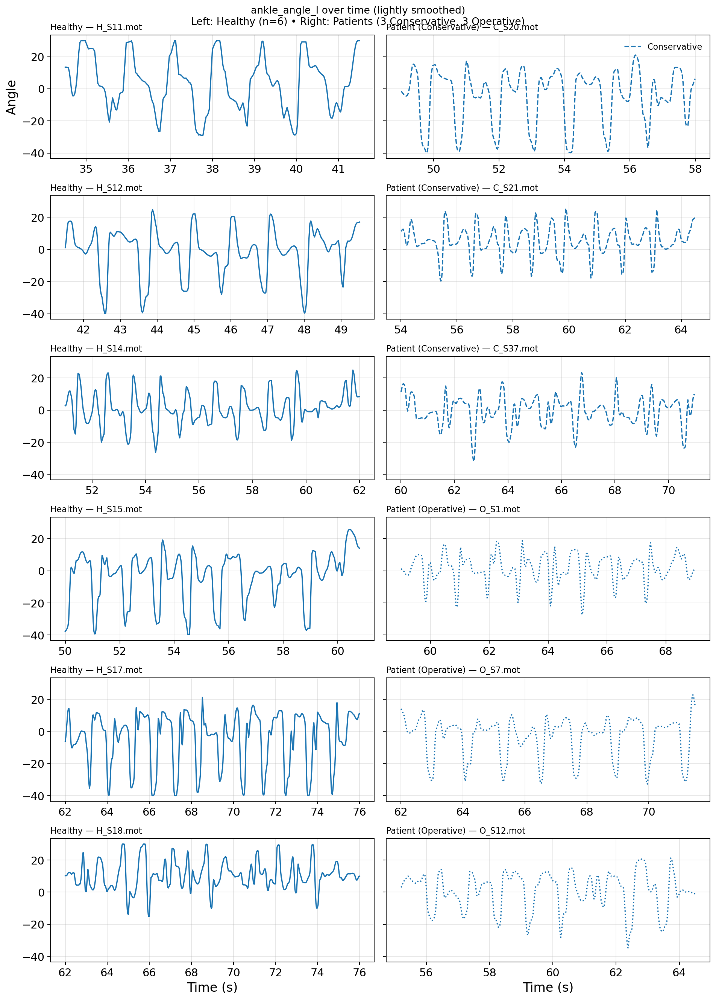


Used files:
Healthy: ['H_S11.mot', 'H_S12.mot', 'H_S14.mot', 'H_S15.mot', 'H_S17.mot', 'H_S18.mot']
Conservative: ['C_S20.mot', 'C_S21.mot', 'C_S37.mot', 'C_S31.mot', 'C_S75.mot', 'C_S76.mot']
Operative: ['O_S1.mot', 'O_S7.mot', 'O_S12.mot', 'O_S72.mot', 'O_S70.mot', 'O_S75.mot']
Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/mean_angle_deg_kde.png


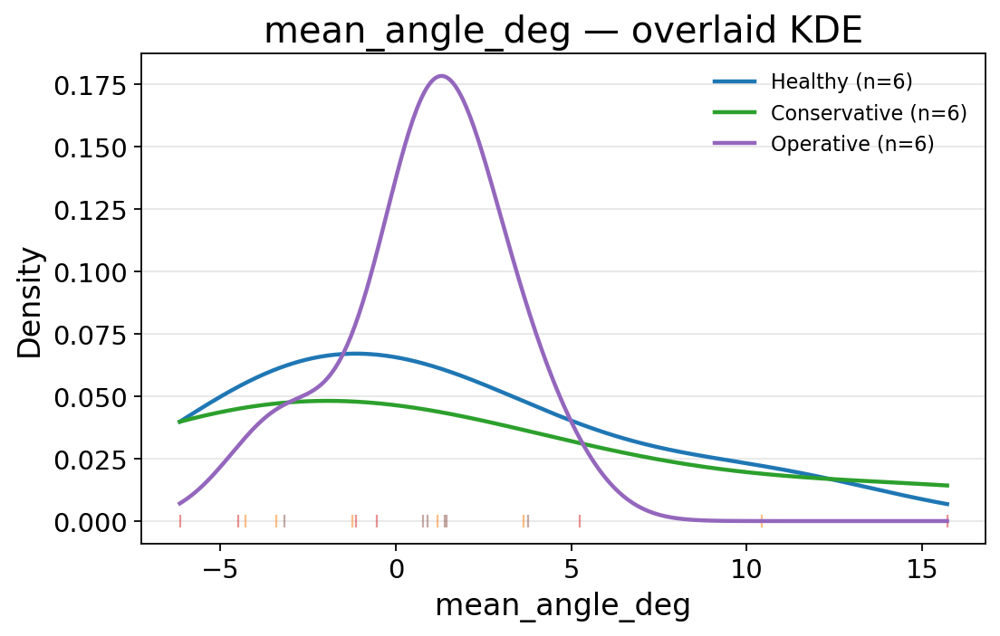

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/p2p_amp_mean_deg_kde.png


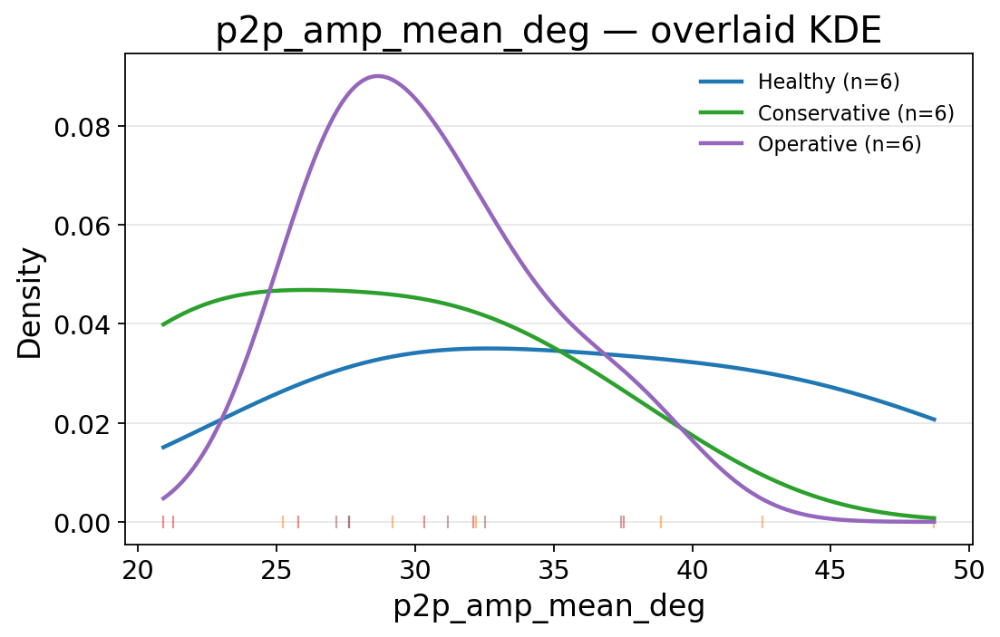

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/p2p_amp_sd_deg_kde.png


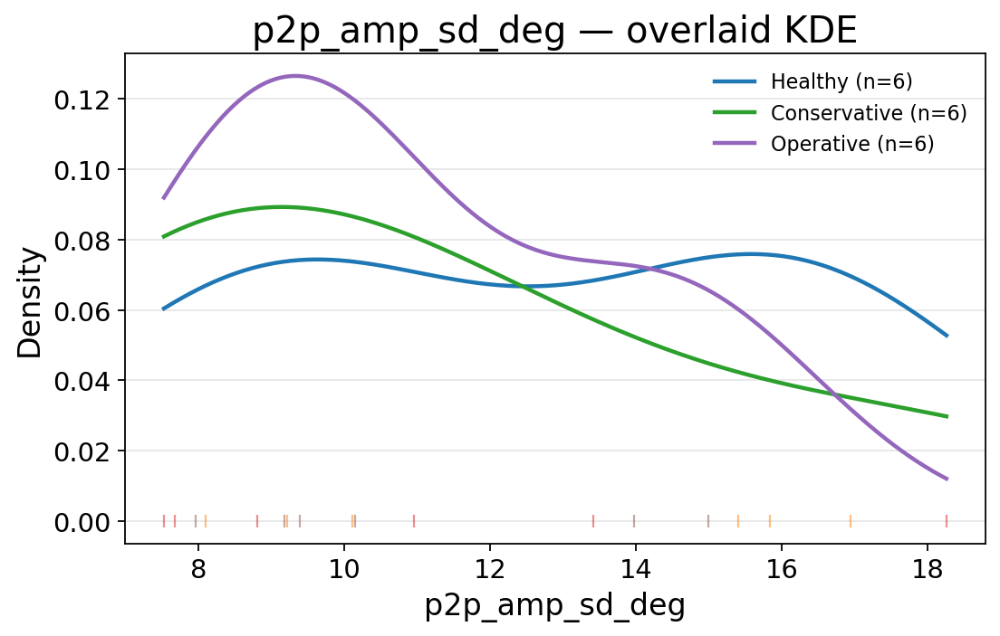

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/p2p_amp_cv_kde.png


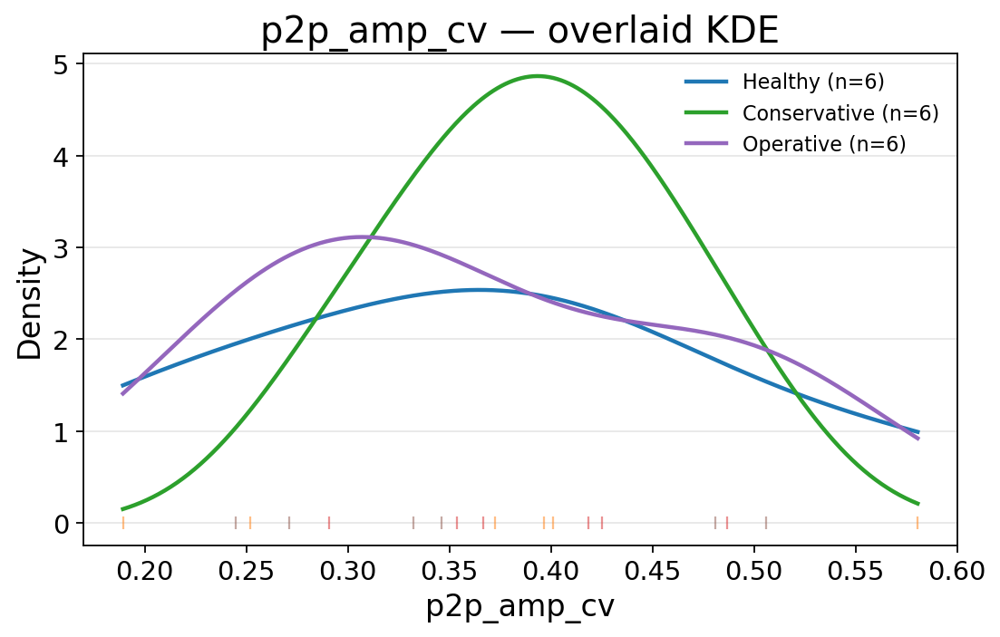

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/cycle_period_mean_s_kde.png


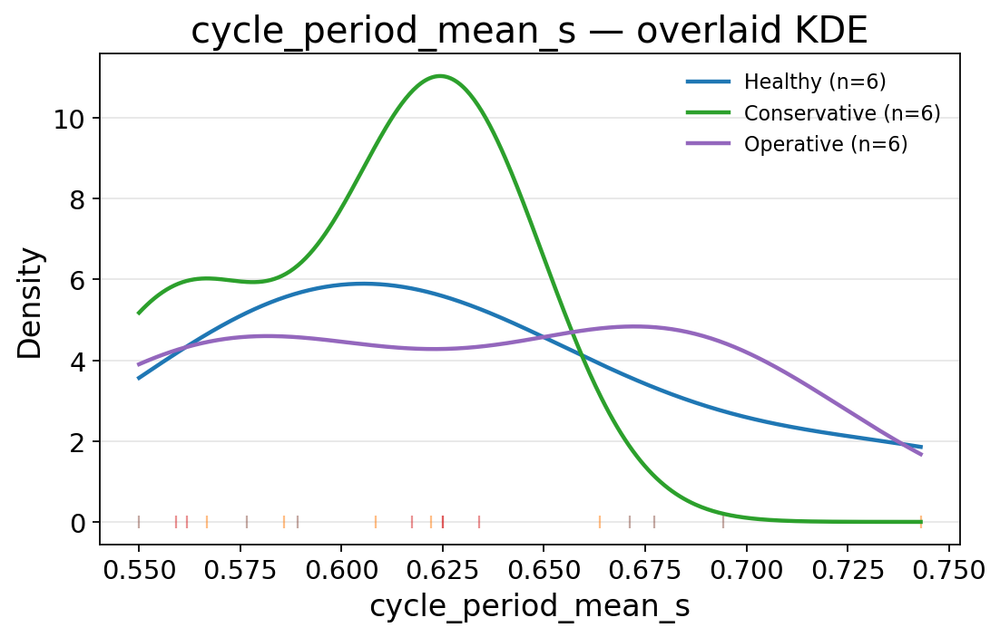

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/cadence_hz_mean_kde.png


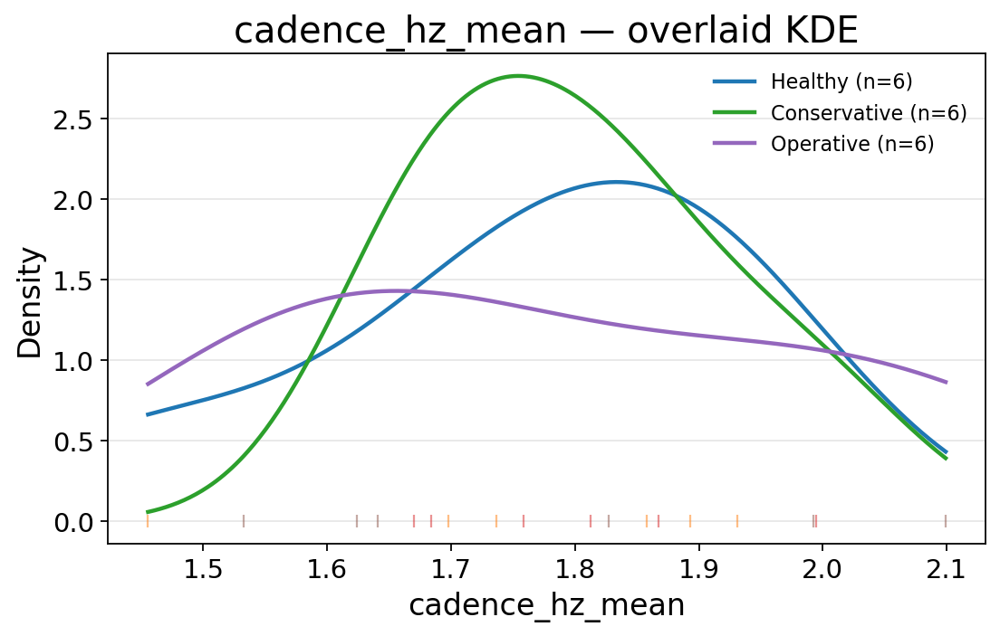

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/cadence_spm_mean_kde.png


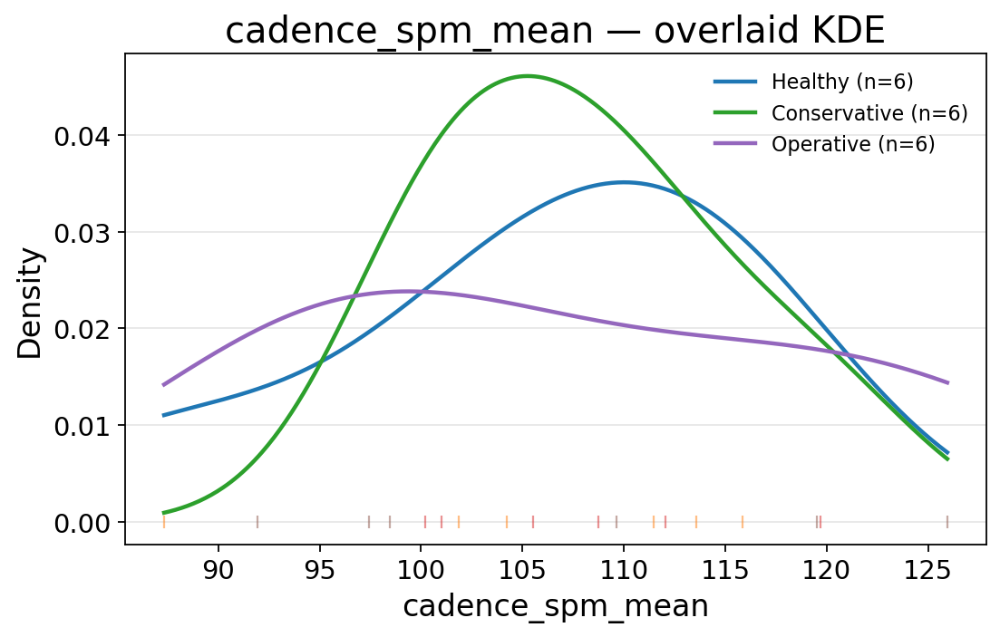

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/cadence_cv_kde.png


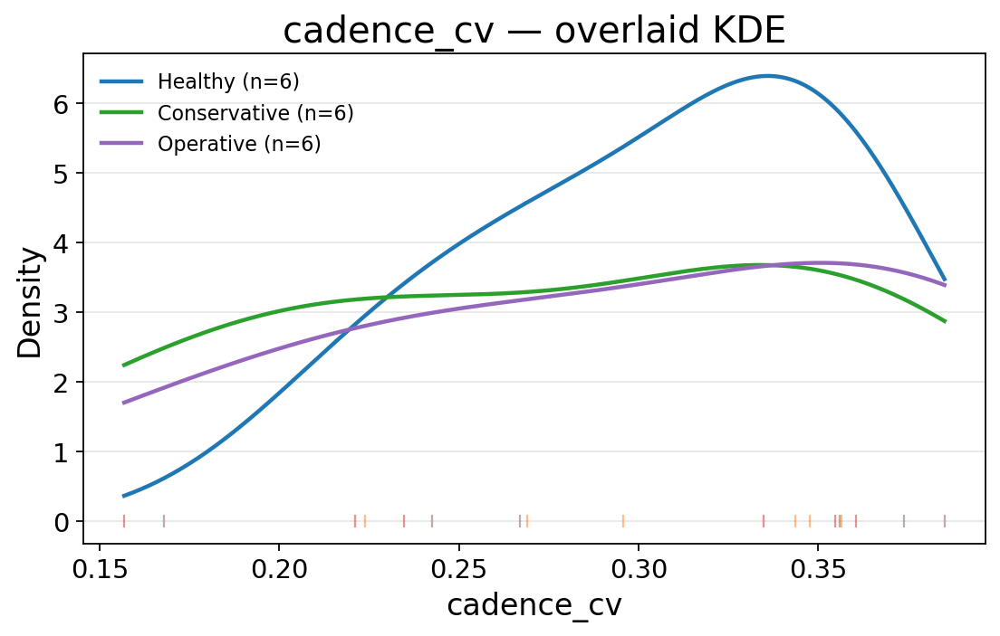

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/ipi_cv_kde.png


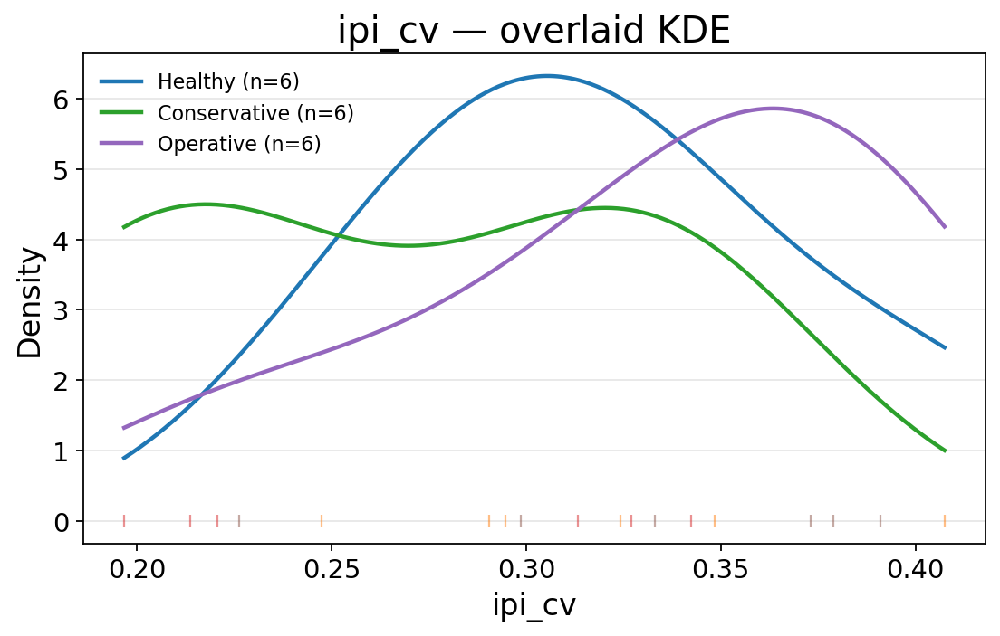

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/peak_amp_sd_deg_kde.png


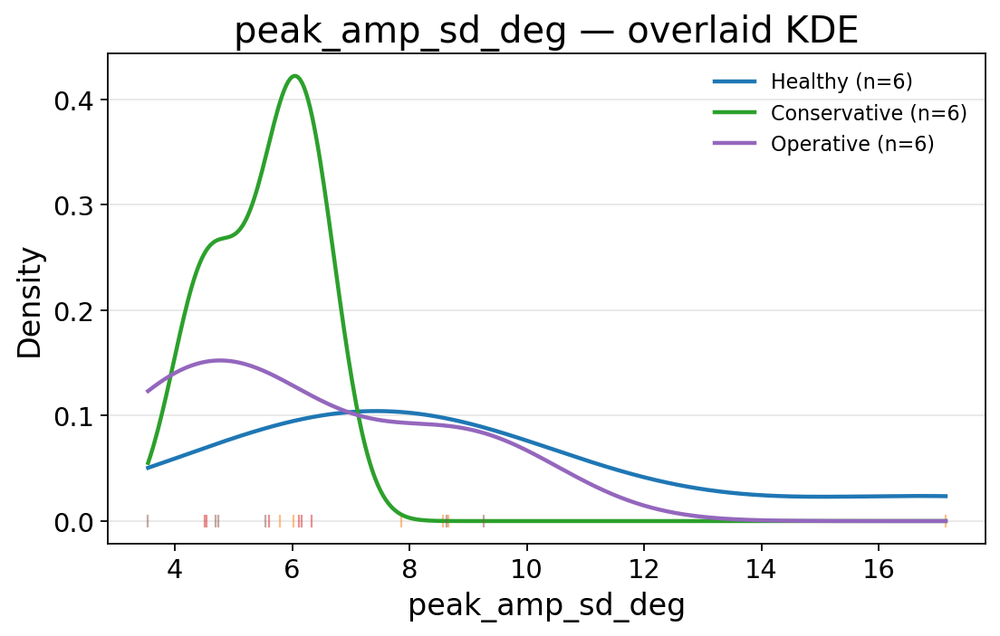

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/valley_amp_sd_deg_kde.png


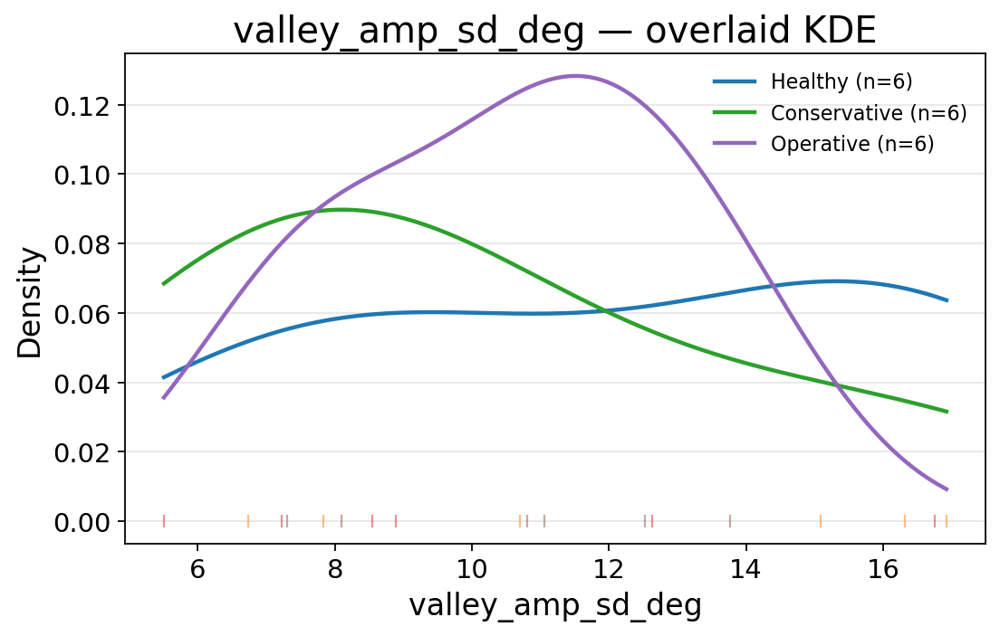

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/slope_sym_index_kde.png


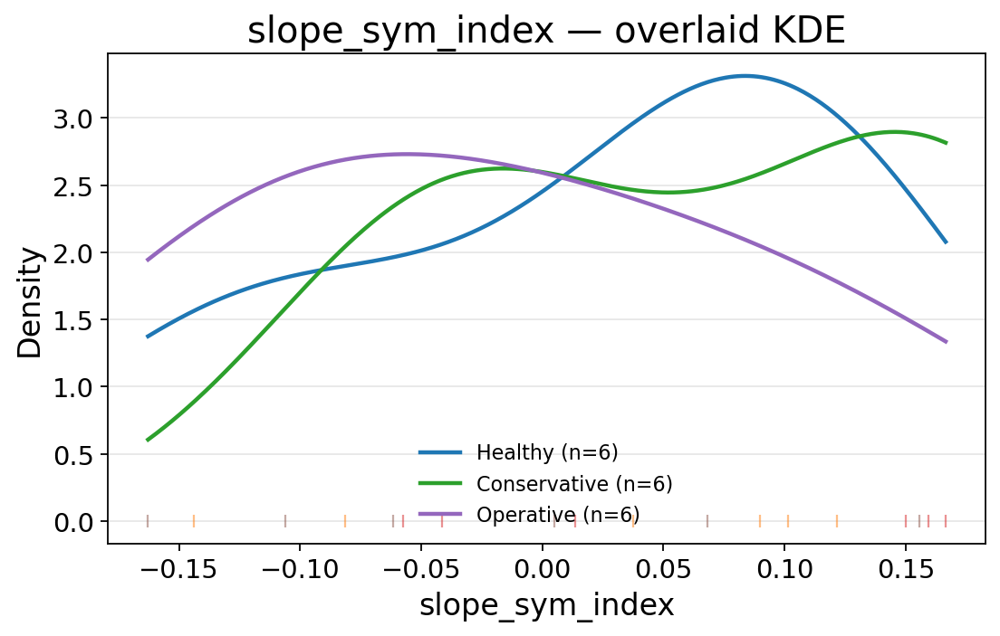

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/slope_ratio_up_over_down_kde.png


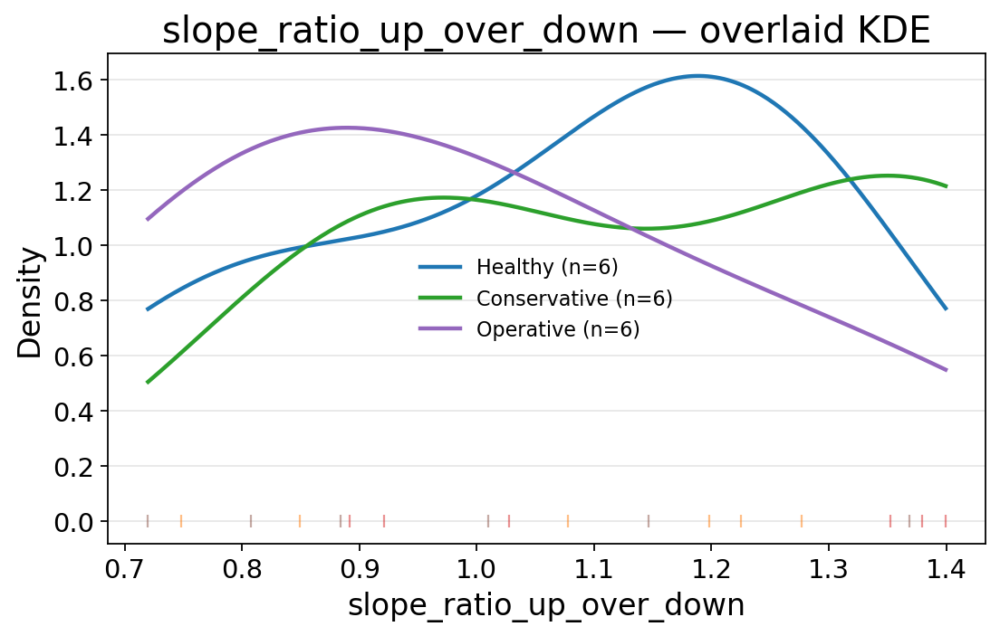

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/slope_ratio_time_mean_kde.png


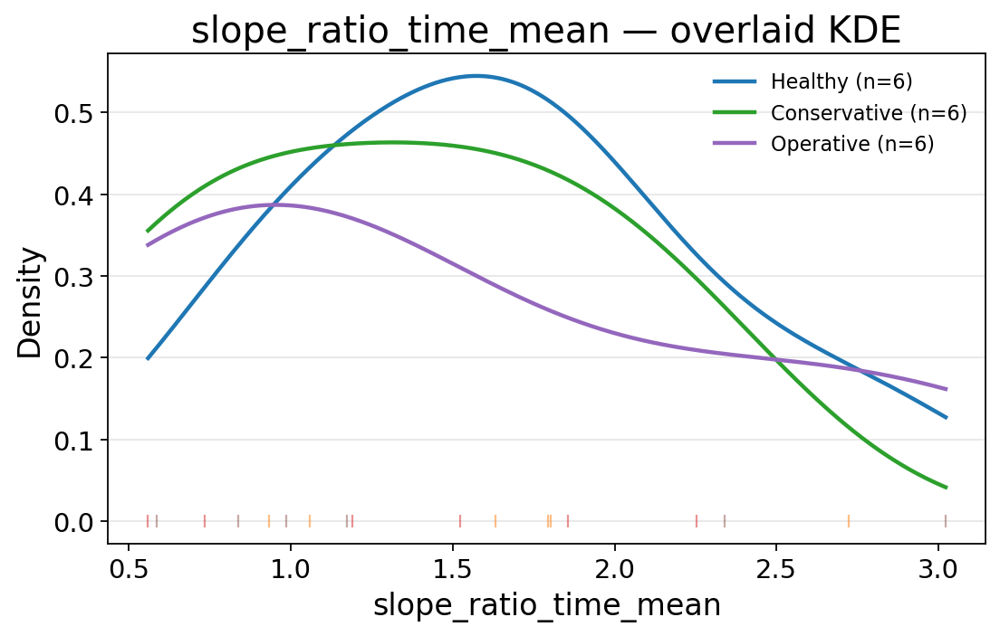

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/mean_up_slope_abs_kde.png


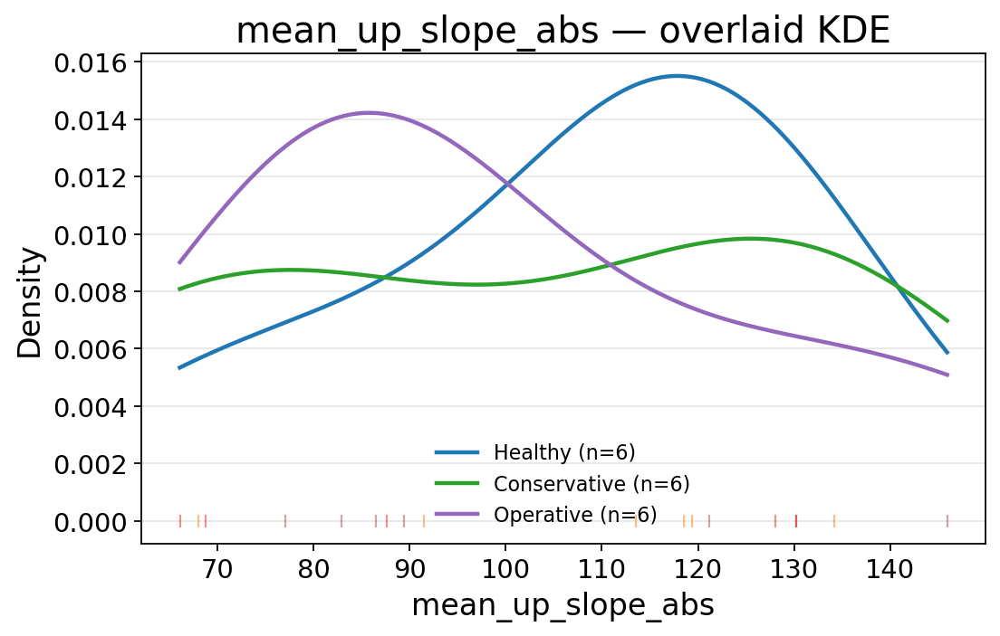

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/mean_down_slope_abs_kde.png


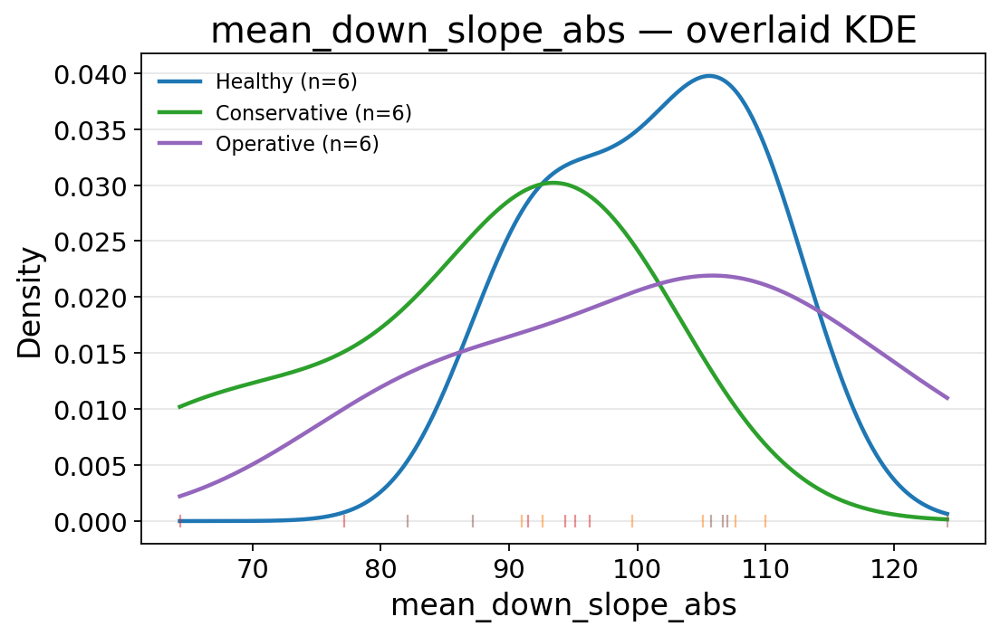

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/acf_at_mean_period_kde.png


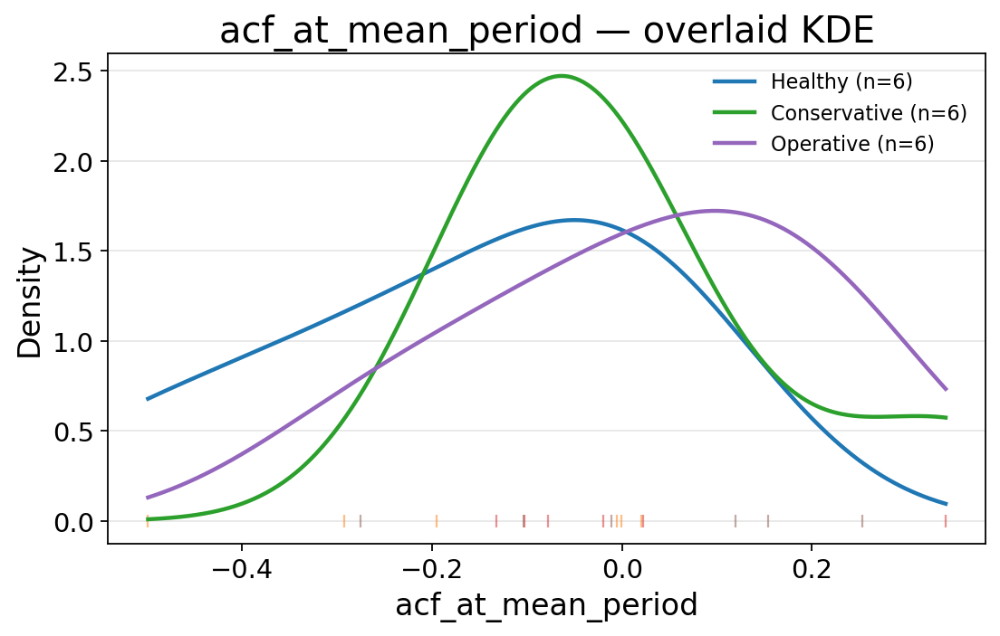

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/acf_max_near_period_kde.png


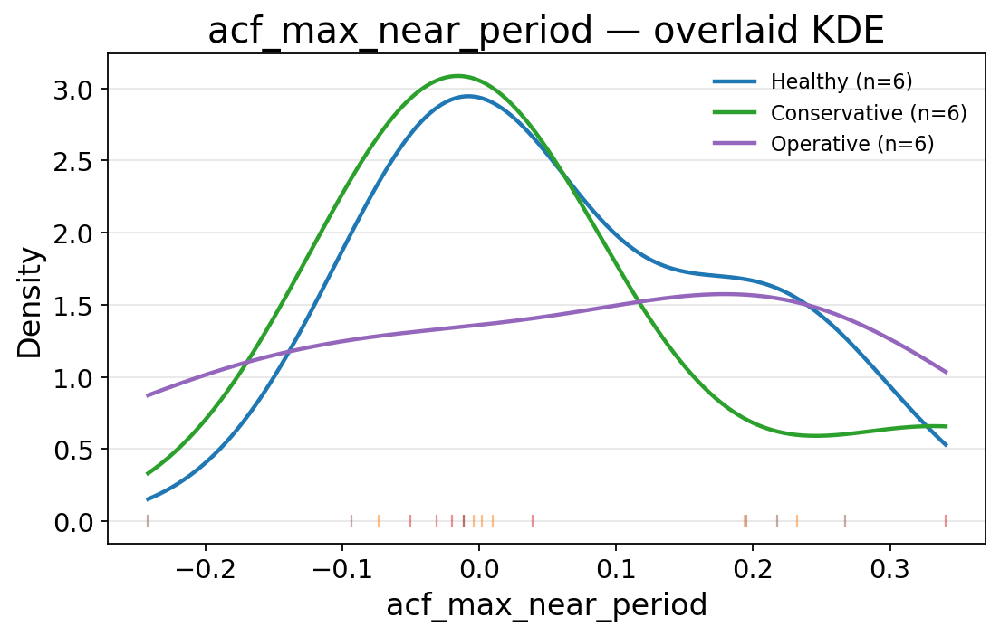

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/slope_var_kde.png


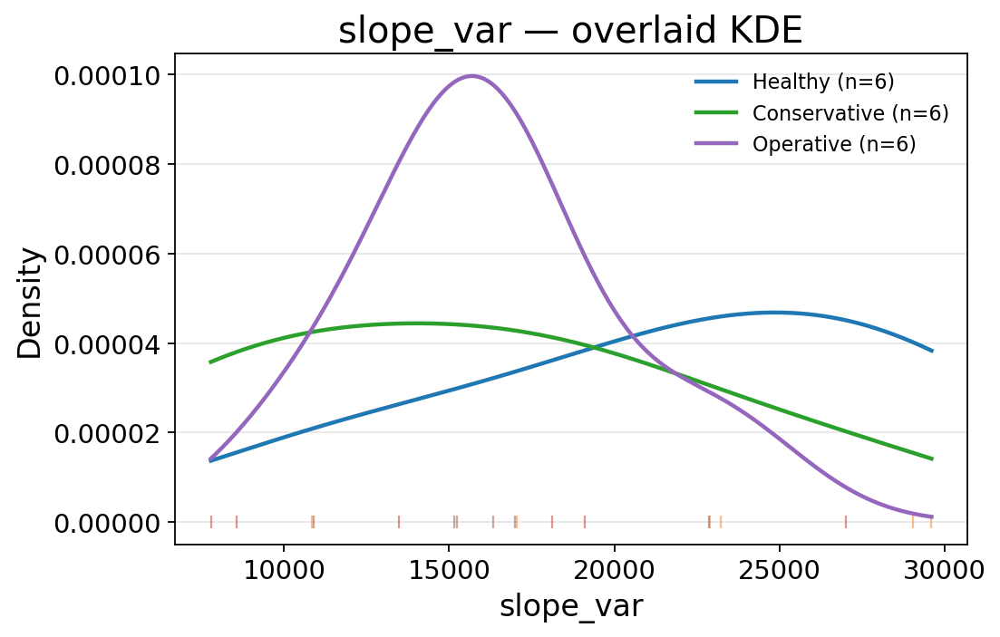

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/hf_power_ratio_kde.png


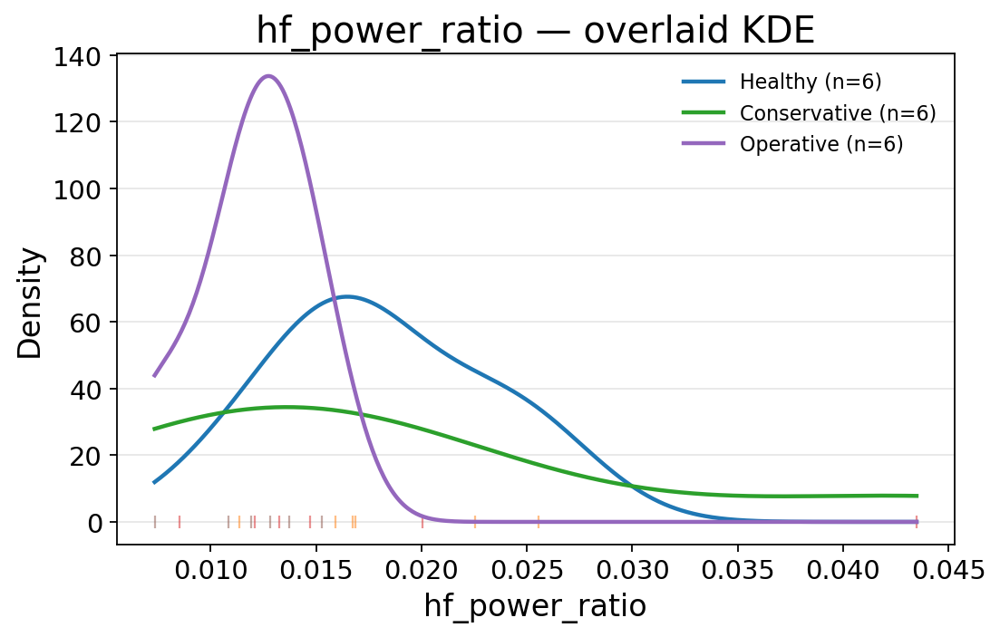

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/jerk_rms_kde.png


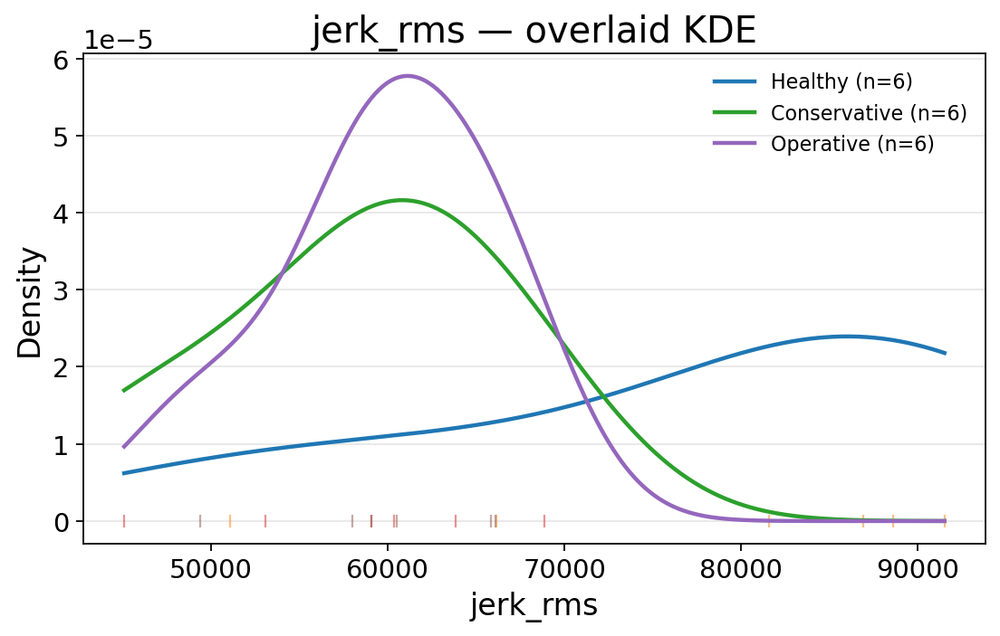

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/total_variation_kde.png


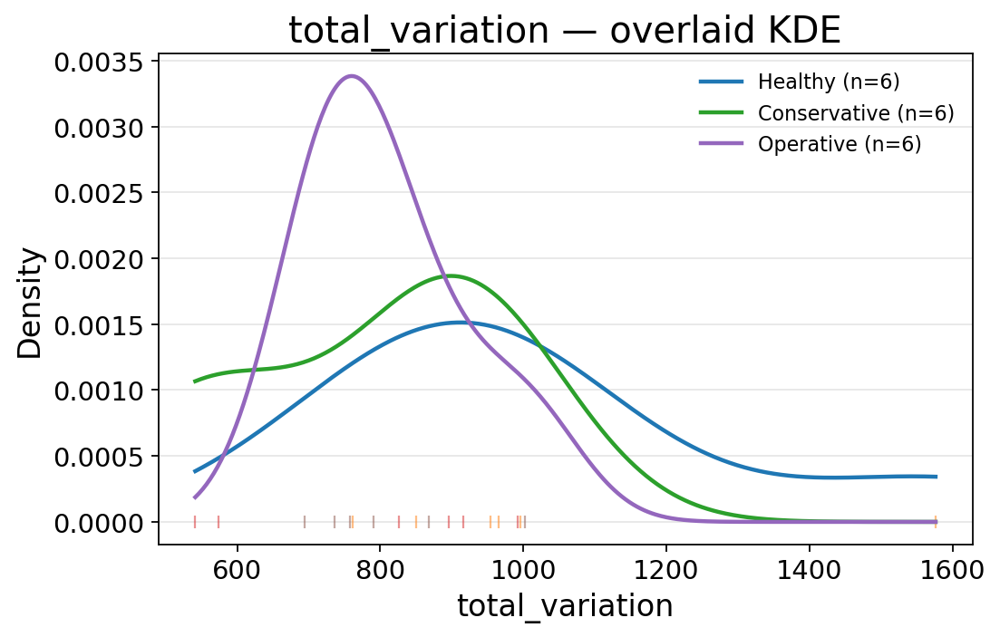

Saved → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/harmonic_ratio_kde.png


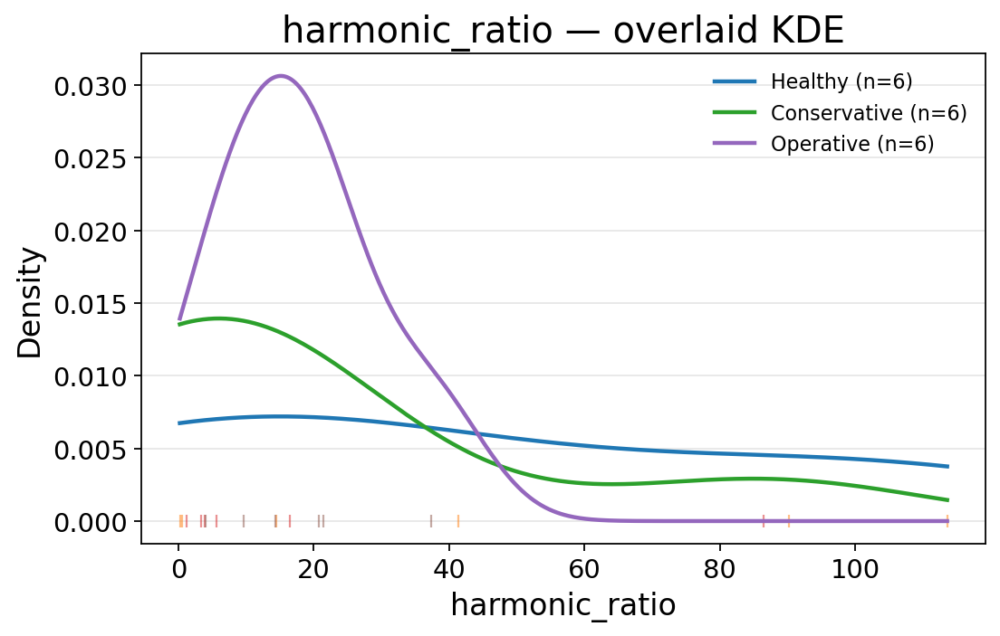

Saved combined grid → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_l_group_metric_plots/ALL_METRICS_kde_GRID_ankle_angle_l.png


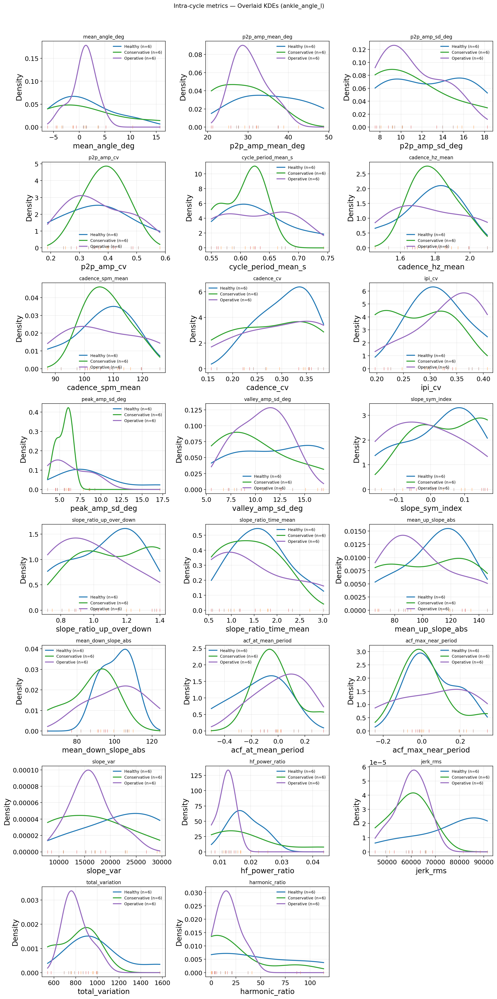

In [109]:
# --- Configuration -----------------------------------------------------------
from pathlib import Path
from typing import List  # <-- FIX for Python < 3.9
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from typing import Optional
import textwrap
import re
import os
from scipy.stats import gaussian_kde

# ================== USER SETTINGS ==================
BASE_DIR = Path("/Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections")
ANGLE_NAME = "ankle_angle_l"

HEALTHY_PICK = ["H_S11.mot", "H_S12.mot", "H_S14.mot", "H_S15.mot", "H_S17.mot", "H_S18.mot"]
CONSERVATIVE_PICK = ["C_S20.mot", "C_S21.mot","C_S37.mot", "C_S31.mot", "C_S75.mot", "C_S76.mot"]
OPERATIVE_PICK = ["O_S1.mot", "O_S7.mot", "O_S12.mot", "O_S72.mot", "O_S70.mot", "O_S75.mot"]

# Smoothing (seconds) — keep these small for a light touch
SMOOTH_MED_SEC  = 0.12
SMOOTH_MEAN_SEC = 0.08
SHOW_RAW_FAINT  = False  # set True to overlay unsmoothed trace lightly

# ---- Distribution plot saving options ----
PLOT_GROUP_DISTRIBUTIONS = True              # Show figures interactively
SAVE_GROUP_PLOTS         = True              # Save one PNG per metric
SAVE_COMBINED_GRID       = True              # NEW: Save ALL metrics into a single PNG
GRID_COLS                = 3                 # Columns in the combined grid
GROUP_PLOTS_DIR          = BASE_DIR / f"{ANGLE_NAME}_group_metric_plots"
COMBINED_GRID_PATH       = GROUP_PLOTS_DIR / f"ALL_METRICS_kde_GRID_{ANGLE_NAME}.png"
# ================================================

# ---------------------------------------------------------------------------

def read_mot(path: Path) -> pd.DataFrame:
    with path.open("r", encoding="utf-8", errors="ignore") as f:
        lines = f.readlines()
    start_idx = 0
    for i, line in enumerate(lines[:200]):
        if line.strip().lower() == "endheader":
            start_idx = i + 1
            break
    from io import StringIO
    body = "".join(lines[start_idx:])
    df = pd.read_csv(StringIO(body), delim_whitespace=True, comment="#")
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="ignore")
    return df

def list_angle_columns(sample_file: Path) -> List[str]:
    df = read_mot(sample_file)
    return [c for c in df.columns if c.lower() != "time"]

def ensure_available(col_name: str, example_path: Path):
    cols = list_angle_columns(example_path)
    if col_name not in cols:
        msg = (
            f"Column '{col_name}' not found in '{example_path.name}'.\n\n"
            f"Available angle columns include (first file checked):\n"
            + "\n".join(textwrap.wrap(", ".join(cols), width=100))
        )
        raise ValueError(msg)

def load_series(files, angle_col):
    series = []
    for p in files:
        if not p.exists():
            print(f"Warning: file not found: {p.name}; skipping.")
            continue
        df = read_mot(p)
        if "time" in df.columns:
            t = df["time"].astype(float).values
        elif "Time" in df.columns:
            t = df["Time"].astype(float).values
        else:
            t = df.index.astype(float).values
        if angle_col not in df.columns:
            print(f"Warning: '{angle_col}' not in {p.name}; skipping.")
            continue
        y = pd.to_numeric(df[angle_col], errors="coerce").values
        series.append((p.name, t, y))
    return series

def smooth_signal(y: np.ndarray, t: np.ndarray,
                  med_sec: float = SMOOTH_MED_SEC,
                  mean_sec: float = SMOOTH_MEAN_SEC) -> np.ndarray:
    """Rolling median then mean with windows set in seconds."""
    if len(t) < 3:
        return y
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0:
        return y
    w_med  = max(3, int(round(med_sec / dt)))
    w_mean = max(3, int(round(mean_sec / dt)))
    s = pd.Series(y)
    y_med = s.rolling(w_med, center=True, min_periods=1).median()
    y_sm  = y_med.rolling(w_mean, center=True, min_periods=1).mean()
    return y_sm.to_numpy()

# Gather files by group
all_mots = sorted(BASE_DIR.glob("*.mot"), key=lambda p: p.name.lower())
healthy = [p for p in all_mots if p.name.startswith("H_")]
conservative = [p for p in all_mots if p.name.startswith("C_")]
operative = [p for p in all_mots if p.name.startswith("O_")]

def pick(files, n):
    return files[:n] if len(files) >= n else files

healthy_pick = [BASE_DIR/f for f in HEALTHY_PICK] if HEALTHY_PICK else pick(healthy, 6)
conservative_pick = [BASE_DIR/f for f in CONSERVATIVE_PICK] if CONSERVATIVE_PICK else pick(conservative, 3)
operative_pick = [BASE_DIR/f for f in OPERATIVE_PICK] if OPERATIVE_PICK else pick(operative, 3)

example_for_columns = (healthy_pick + conservative_pick + operative_pick)[0] if (healthy_pick or conservative_pick or operative_pick) else None
if example_for_columns is None:
    raise FileNotFoundError(f"No .mot files found in {BASE_DIR}")

ensure_available(ANGLE_NAME, example_for_columns)

healthy_series = load_series(healthy_pick, ANGLE_NAME)
conservative_series = load_series(conservative_pick, ANGLE_NAME)
operative_series = load_series(operative_pick, ANGLE_NAME)

# --- Metrics: requested by professor + integrations -------------------------
from dataclasses import dataclass

MIN_PEAK_DIST_SEC = 0.30   # heuristic: don't detect steps closer than this
PEAK_PROMINENCE   = 2.0    # deg; tune to your signal
HR_BW_HZ          = 0.15   # bandwidth for harmonic-ratio bands around fundamental/harmonics

def _safe_dt(t: np.ndarray) -> float:
    dt = float(np.nanmedian(np.diff(t))) if len(t) > 1 else np.nan
    return dt if np.isfinite(dt) and dt > 0 else np.nan

def compute_slope(y: np.ndarray, t: np.ndarray) -> np.ndarray:
    """Numerical derivative dy/dt with uneven spacing support."""
    return np.gradient(y, t)

def compute_jerk(y: np.ndarray, t: np.ndarray) -> np.ndarray:
    """Third derivative (jerk) of angle wrt time."""
    v = np.gradient(y, t)
    a = np.gradient(v, t)
    j = np.gradient(a, t)
    return j

def find_peaks_robust(y: np.ndarray, t: np.ndarray,
                      min_dist_sec: float = MIN_PEAK_DIST_SEC,
                      prominence: float = PEAK_PROMINENCE):
    """Use SciPy if available; else fall back to a simple peak picker."""
    dt = _safe_dt(t)
    min_dist_samples = 1 if not np.isfinite(dt) else max(1, int(round(min_dist_sec / dt)))
    try:
        from scipy.signal import find_peaks
        peaks, _ = find_peaks(y, distance=min_dist_samples, prominence=prominence)
        troughs, _ = find_peaks(-y, distance=min_dist_samples, prominence=prominence)
    except Exception:
        # Fallback: local maxima/minima by sign change in first derivative
        dy = np.diff(y, prepend=y[0])
        sign = np.sign(dy)
        zc = np.where(np.diff(sign) < 0)[0]         # crude maxima
        tn = np.where(np.diff(sign) > 0)[0]         # crude minima
        def _thin(idxs):
            out = []
            last = -10**9
            for i in idxs:
                if i - last >= min_dist_samples:
                    out.append(i); last = i
            return np.array(out, dtype=int)
        peaks, troughs = _thin(zc), _thin(tn)
    return np.asarray(peaks), np.asarray(troughs)

def _acf(y: np.ndarray, nlags: int) -> np.ndarray:
    """
    Normalized autocorrelation (biased) up to nlags (including lag 0),
    matching the professor's normalization: divide by variance * (n - lag).
    """
    y = np.asarray(y, float)
    y = y - np.nanmean(y)
    y[np.isnan(y)] = 0.0
    n = len(y)
    if n < 2:
        return np.array([1.0])
    ac_full = np.correlate(y, y, mode="full")
    mid = n - 1
    ac = ac_full[mid:mid + nlags + 1]  # lags 0..nlags
    var = np.nanvar(y)
    if var <= 0:
        return np.ones_like(ac, dtype=float)
    overlap = np.arange(n, n - nlags - 1, -1, dtype=float)  # n, n-1, ..., n-nlags
    denom = var * overlap
    denom[denom <= 0] = np.nan
    return ac / denom

def _hf_power_ratio(y: np.ndarray, fs: float, cutoff_hz: float = 5.0) -> float:
    """High-frequency (>cutoff) power / total power using rFFT."""
    y = np.asarray(y, float)
    y = y - np.nanmean(y)
    if not np.isfinite(fs) or fs <= 0 or len(y) < 4:
        return np.nan
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(len(y), d=1.0/fs)
    power = (np.abs(Y)**2)
    total = power.sum()
    if total <= 0:
        return np.nan
    hf_mask = freqs >= cutoff_hz
    return float(power[hf_mask].sum() / total)

def _fft_power(y: np.ndarray, fs: float):
    """One-sided power spectrum; Hanning window for leakage control."""
    y = np.asarray(y, float)
    y = y - np.nanmean(y)
    if not np.isfinite(fs) or fs <= 0 or len(y) < 8:
        return np.array([]), np.array([])
    w = np.hanning(len(y))
    Y = np.fft.rfft(y * w)
    f = np.fft.rfftfreq(len(y), d=1.0/fs)
    P = (np.abs(Y)**2) / np.sum(w**2)
    return f, P

@dataclass
class SeriesMetrics:
    name: str
    n_points: int
    dt_mean: float
    mean_angle_deg: float

    # Peak-to-peak amplitude (per cycle)
    p2p_amp_mean_deg: float
    p2p_amp_sd_deg: float
    p2p_amp_cv: float  # SD / mean

    # Cycle frequency / cadence derived from inter-peak intervals
    cycle_period_mean_s: float
    cadence_hz_mean: float
    cadence_spm_mean: float  # steps (cycles)/min
    cadence_cv: float        # CV of cadence
    ipi_cv: float            # Inter-peak-interval CV (timing variability)

    # Peak/valley variability (amplitude)
    peak_amp_sd_deg: float
    valley_amp_sd_deg: float

    # Slope symmetry (up vs down)
    slope_sym_index: float           # [-1,1] magnitude-based index
    slope_ratio_up_over_down: float  # mean|slope| up / mean|slope| down
    slope_ratio_time_mean: float     # time-based rise/fall ratio
    mean_up_slope_abs: float
    mean_down_slope_abs: float

    # Regularity (autocorrelation)
    acf_at_mean_period: float
    acf_max_near_period: float

    # Smoothness / noise
    slope_var: float
    hf_power_ratio: float
    jerk_rms: float
    total_variation: float

    # Harmonic ratio around cadence
    harmonic_ratio: float

def summarize_series(name: str, t: np.ndarray, y: np.ndarray) -> SeriesMetrics:
    # Smooth signal
    ys = smooth_signal(y, t)
    dt = _safe_dt(t)
    fs = 1.0 / dt if np.isfinite(dt) and dt > 0 else np.nan
    mean_angle = float(np.nanmean(ys))

    # Peaks & troughs
    peaks, troughs = find_peaks_robust(ys, t)
    tp = t[peaks]

    # Inter-peak interval stats (period/cadence)
    if len(tp) >= 2:
        ipi = np.diff(tp)  # seconds
        period_mean = float(np.nanmean(ipi))
        cadence_hz_vec = 1.0 / ipi
        cadence_hz_mean = float(np.nanmean(cadence_hz_vec))
        cadence_spm_mean = float(60.0 * cadence_hz_mean)
        ipi_cv = float(np.nanstd(ipi) / np.nanmean(ipi)) if np.nanmean(ipi) > 0 else np.nan
        cadence_cv = float(np.nanstd(cadence_hz_vec) / np.nanmean(cadence_hz_vec)) if np.nanmean(cadence_hz_vec) > 0 else np.nan
    else:
        period_mean = np.nan
        cadence_hz_mean = np.nan
        cadence_spm_mean = np.nan
        ipi_cv = np.nan
        cadence_cv = np.nan

    # Peak-to-peak amplitude per cycle + slope halves
    p2p_amps = []
    up_slopes = []
    down_slopes = []
    slope_ratio_time = []

    # Gather peak/valley values for variability
    peak_vals = ys[peaks] if len(peaks) else np.array([])
    valley_vals = ys[troughs] if len(troughs) else np.array([])

    if len(peaks) >= 2:
        for i in range(len(peaks)-1):
            lo, hi = peaks[i], peaks[i+1]
            seg = ys[lo:hi+1]
            if seg.size == 0:
                continue
            # p2p amplitude
            p2p_amps.append(float(np.nanmax(seg) - np.nanmin(seg)))
            # trough within [lo, hi] (for slope halves)
            seg_trough_rel = int(np.nanargmin(seg))
            tr = lo + seg_trough_rel

            # magnitude-based slopes (mean |dy/dt| on each half)
            slope_full = compute_slope(ys[lo:hi+1], t[lo:hi+1])
            if tr > lo:
                down_slopes.append(float(np.nanmean(np.abs(slope_full[:seg_trough_rel]))))
            if hi > tr:
                up_slopes.append(float(np.nanmean(np.abs(slope_full[seg_trough_rel:]))))

            # time-based slope ratio: rise time / fall time
            i_min_rel = int(np.nanargmin(seg))
            i_max_rel = int(np.nanargmax(seg))
            if i_max_rel > i_min_rel:
                rise_t = (i_max_rel - i_min_rel) * (1.0/fs) if np.isfinite(fs) and fs>0 else np.nan
                fall_t = (seg.size - 1 - i_max_rel + i_min_rel) * (1.0/fs) if np.isfinite(fs) and fs>0 else np.nan
                slope_ratio_time.append(rise_t / fall_t if (np.isfinite(rise_t) and np.isfinite(fall_t) and fall_t > 0) else np.nan)
            else:
                slope_ratio_time.append(np.nan)

    if p2p_amps:
        p2p_amps = np.asarray(p2p_amps, float)
        p2p_amp_mean = float(np.nanmean(p2p_amps))
        p2p_amp_sd = float(np.nanstd(p2p_amps))
        p2p_amp_cv = float(p2p_amp_sd / p2p_amp_mean) if p2p_amp_mean > 0 else np.nan
    else:
        p2p_amp_mean = p2p_amp_sd = p2p_amp_cv = np.nan

    peak_amp_sd = float(np.nanstd(peak_vals)) if peak_vals.size else np.nan
    valley_amp_sd = float(np.nanstd(valley_vals)) if valley_vals.size else np.nan

    # Magnitude-based slope symmetry and ratio
    if up_slopes and down_slopes:
        mu_up = float(np.nanmean(up_slopes))
        mu_dn = float(np.nanmean(down_slopes))
        denom = (mu_up + mu_dn)
        slope_sym_index = float((mu_up - mu_dn) / denom) if denom > 0 else np.nan
        slope_ratio_mag = float(mu_up / mu_dn) if mu_dn > 0 else np.nan
    else:
        mu_up = mu_dn = slope_sym_index = slope_ratio_mag = np.nan

    slope_ratio_time_mean = float(np.nanmean(slope_ratio_time)) if len(slope_ratio_time) else np.nan

    # Regularity via autocorrelation near the mean period (biased normalization)
    if np.isfinite(fs) and fs > 0 and np.isfinite(period_mean) and period_mean > 0:
        lag_samples = int(round(period_mean * fs))
        if lag_samples < 1:
            acf_at_mean = np.nan
            acf_max_near = np.nan
        else:
            nlags = max(lag_samples * 2, 4)
            ac = _acf(ys, nlags)
            acf_at_mean = float(ac[lag_samples]) if lag_samples < len(ac) else np.nan
            # search ±20% window around mean period lag
            w = max(1, int(round(0.2 * lag_samples)))
            lo = max(1, lag_samples - w)
            hi = min(len(ac)-1, lag_samples + w)
            acf_max_near = float(np.nanmax(ac[lo:hi+1])) if hi >= lo else np.nan
    else:
        acf_at_mean = np.nan
        acf_max_near = np.nan

    # Smoothness / noise
    slope = compute_slope(ys, t)
    slope_var_global = float(np.nanvar(slope))
    hf_ratio = _hf_power_ratio(ys, fs, cutoff_hz=5.0)

    jerk = compute_jerk(ys, t) if np.isfinite(fs) and fs>0 else np.full_like(ys, np.nan)
    jerk_rms = float(np.sqrt(np.nanmean(jerk**2))) if np.any(np.isfinite(jerk)) else np.nan
    total_variation = float(np.nansum(np.abs(np.diff(ys)))) if ys.size else np.nan

    # Harmonic ratio around cadence fundamental
    harmonic_ratio = np.nan
    if np.isfinite(cadence_hz_mean) and cadence_hz_mean > 0 and np.isfinite(fs) and fs > 0:
        f, P = _fft_power(ys, fs)
        if P.size:
            def bandpow(center_hz, bw=HR_BW_HZ):
                idx = (f >= max(0.0, center_hz - bw)) & (f <= center_hz + bw)
                return float(np.nansum(P[idx])) if np.any(idx) else 0.0
            p1 = bandpow(cadence_hz_mean)
            harmonics = [bandpow(k * cadence_hz_mean) for k in range(2, 8)]
            denom_hr = float(np.nansum(harmonics))
            harmonic_ratio = (p1 / denom_hr) if denom_hr > 0 else np.nan

    return SeriesMetrics(
        name=name,
        n_points=len(t),
        dt_mean=dt,
        mean_angle_deg=mean_angle,
        p2p_amp_mean_deg=p2p_amp_mean,
        p2p_amp_sd_deg=p2p_amp_sd,
        p2p_amp_cv=p2p_amp_cv,
        cycle_period_mean_s=period_mean,
        cadence_hz_mean=cadence_hz_mean,
        cadence_spm_mean=cadence_spm_mean,
        cadence_cv=cadence_cv,
        ipi_cv=ipi_cv,
        peak_amp_sd_deg=peak_amp_sd,
        valley_amp_sd_deg=valley_amp_sd,
        slope_sym_index=slope_sym_index,
        slope_ratio_up_over_down=slope_ratio_mag,
        slope_ratio_time_mean=slope_ratio_time_mean,
        mean_up_slope_abs=mu_up,
        mean_down_slope_abs=mu_dn,
        acf_at_mean_period=acf_at_mean,
        acf_max_near_period=acf_max_near,
        slope_var=slope_var_global,
        hf_power_ratio=hf_ratio,
        jerk_rms=jerk_rms,
        total_variation=total_variation,
        harmonic_ratio=harmonic_ratio,
    )

def summarize_all_metrics(series_list, save_csv: Optional[Path] = None) -> pd.DataFrame:
    rows = []
    for name, t, y in series_list:
        m = summarize_series(name, t, y)
        rows.append(vars(m))
    df = pd.DataFrame(rows).set_index("name").sort_index()
    if save_csv is not None:
        df.to_csv(save_csv, index=True)
        print(f"Saved metrics → {save_csv}")
    return df

# ---------------------------------------------------------------------------

# (a) Only the ones you plotted:
plotted_series = healthy_series + conservative_series + operative_series
metrics_df = summarize_all_metrics(plotted_series, save_csv=BASE_DIR / f"{ANGLE_NAME}_metrics_plotted.csv")
print(metrics_df)

# Plot: 6 rows × 2 columns
n_rows = 6
fig, axes = plt.subplots(n_rows, 2, figsize=(12, 18), sharex=False, sharey=True)
fig.suptitle(f"{ANGLE_NAME} over time (lightly smoothed)\nLeft: Healthy (n=6) • Right: Patients (3 Conservative, 3 Operative)", y=0.92)

# Left column: healthy
for i in range(n_rows):
    ax = axes[i, 0]
    if i < len(healthy_series):
        name, t, y = healthy_series[i]
        y_s = smooth_signal(y, t)
        if SHOW_RAW_FAINT:
            ax.plot(t, y, alpha=0.25, linewidth=0.8)
        ax.plot(t, y_s)  # smoothed
        ax.set_title(f"Healthy — {name}", loc="left", fontsize=10)
    ax.grid(True, alpha=0.3)
    if i == n_rows - 1:
        ax.set_xlabel("Time (s)")
    if i == 0:
        ax.set_ylabel("Angle")

# Right column: first 3 rows conservative (--), next 3 operative (:)
for i in range(n_rows):
    ax = axes[i, 1]
    if i < 3 and i < len(conservative_series):
        name, t, y = conservative_series[i]
        y_s = smooth_signal(y, t)
        if SHOW_RAW_FAINT:
            ax.plot(t, y, alpha=0.2, linewidth=0.8, linestyle="--")
        ax.plot(t, y_s, linestyle="--", label="Conservative")
        ax.set_title(f"Patient (Conservative) — {name}", loc="left", fontsize=10)
    elif 3 <= i < 6 and (i - 3) < len(operative_series):
        name, t, y = operative_series[i - 3]
        y_s = smooth_signal(y, t)
        if SHOW_RAW_FAINT:
            ax.plot(t, y, alpha=0.2, linewidth=0.8, linestyle=":")
        ax.plot(t, y_s, linestyle=":", label="Operative")
        ax.set_title(f"Patient (Operative) — {name}", loc="left", fontsize=10)
    ax.grid(True, alpha=0.3)
    if i == n_rows - 1:
        ax.set_xlabel("Time (s)")

# Legend for right column (only if something was plotted)
handles, labels = axes[0, 1].get_legend_handles_labels()
if handles:
    axes[0, 1].legend(loc="upper right", frameon=False)

plt.tight_layout(rect=[0, 0, 1, 0.94])
plt.show()

print("\nUsed files:")
print("Healthy:", [p.name for p in healthy_pick])
print("Conservative:", [p.name for p in conservative_pick])
print("Operative:", [p.name for p in operative_pick])

# ===================== Group vectors & distribution plots ====================
# Config for distribution plots (already set in USER SETTINGS)

GROUPS = ["Healthy", "Conservative", "Operative"]

def infer_group_from_filename(name: str) -> str:
    if name.startswith("H_"): return "Healthy"
    if name.startswith("C_"): return "Conservative"
    if name.startswith("O_"): return "Operative"
    return "Unknown"

def _is_numeric_series(s: pd.Series) -> bool:
    return pd.api.types.is_numeric_dtype(s)

def _sanitize_filename(s: str) -> str:
    return re.sub(r"[^a-zA-Z0-9_.-]+", "_", s)

# Add a 'Group' column inferred from index (file name)
metrics_df["Group"] = [infer_group_from_filename(n) for n in metrics_df.index]

# Choose which metrics to plot: all numeric columns except some low-level ones
_exclude = set(["n_points", "dt_mean"])
num_cols = [c for c in metrics_df.columns if c not in ("Group",) and _is_numeric_series(metrics_df[c]) and c not in _exclude]

def _kde_overlay(ax, data_by_group, labels_by_group, grid=None, with_rug=True, linewidth=2):
    """Draw overlaid KDEs on a shared axis."""
    # Build grid if not provided
    xs_all = np.concatenate([x for x in data_by_group if len(x)])
    if xs_all.size == 0:
        return False
    x_min, x_max = float(np.min(xs_all)), float(np.max(xs_all))
    if not np.isfinite(x_min) or not np.isfinite(x_max) or x_max <= x_min:
        x_min, x_max = 0.0, 1.0
    if grid is None:
        grid = np.linspace(x_min, x_max, 400)

    plotted_any = False
    for label, x in zip(labels_by_group, data_by_group):
        if len(x) < 2:
            continue
        kde = gaussian_kde(x)
        ax.plot(grid, kde(grid), label=f"{label} (n={len(x)})", linewidth=linewidth)
        if with_rug:
            ax.plot(x, np.zeros_like(x), '|', alpha=0.5)
        plotted_any = True
    return plotted_any

def plot_metric_distribution(df: pd.DataFrame, metric: str, save_dir: Optional[Path] = None,
                             mode: str = "kde"):  # violin | box | dot | kde
    data = [df.loc[df["Group"]==g, metric].dropna().values for g in GROUPS]
    counts = [len(x) for x in data]
    if sum(counts) == 0:
        print(f"[skip] No data for metric '{metric}'.")
        return

    if mode.lower() == "kde":
        fig, ax = plt.subplots(figsize=(7, 4.5))
        ok = _kde_overlay(ax, data, GROUPS)
        if not ok:
            plt.close(fig)
            print(f"[skip] Not enough data for KDE in '{metric}'.")
            return
        ax.set_title(f"{metric} — overlaid KDE")
        ax.set_xlabel(metric)
        ax.set_ylabel("Density")
        ax.grid(alpha=0.3, axis="y")
        ax.legend(frameon=False)
    else:
        fig, ax = plt.subplots(figsize=(6, 4.5))
        mode = mode.lower()
        if mode == "violin":
            parts = ax.violinplot(data, showmeans=True, showextrema=False, widths=0.7)
            # jittered points
            rng = np.random.default_rng(42)
            for i, xs in enumerate(data, start=1):
                if len(xs) == 0: continue
                jitter = (rng.random(len(xs)) - 0.5) * 0.2
                ax.scatter(np.full_like(xs, i, dtype=float) + jitter, xs, alpha=0.7, s=18)
        elif mode == "box":
            ax.boxplot(data, labels=GROUPS, showmeans=True, meanline=True)
        elif mode == "dot":
            # strip/jitter + mean±SD error bars
            rng = np.random.default_rng(42)
            for i, xs in enumerate(data, start=1):
                if len(xs) == 0: continue
                jitter = (rng.random(len(xs)) - 0.5) * 0.2
                ax.scatter(np.full_like(xs, i, dtype=float) + jitter, xs, alpha=0.85, s=20)
                m, s = float(np.mean(xs)), float(np.std(xs, ddof=1)) if len(xs) > 1 else 0.0
                ax.errorbar(i, m, yerr=s, fmt='s', ms=6, capsize=4)
            ax.set_xticks([1,2,3]); ax.set_xticklabels(GROUPS)
        else:
            raise ValueError("mode must be one of: 'violin', 'box', 'dot', 'kde'")

        if mode in ("violin","box","dot"):
            ax.set_xticks([1,2,3]); ax.set_xticklabels(GROUPS)
            ax.set_title(f"{metric} — {mode} plot")
            ax.set_ylabel(metric)
            ax.grid(alpha=0.3, axis="y")

    plt.tight_layout()
    if save_dir is not None:
        save_dir.mkdir(parents=True, exist_ok=True)
        out = save_dir / f"{re.sub(r'[^a-zA-Z0-9_.-]+','_',metric)}_{mode}.png"
        plt.savefig(out, dpi=200)
        print(f"Saved → {out}")
    if PLOT_GROUP_DISTRIBUTIONS:
        plt.show()
    else:
        plt.close(fig)

def plot_all_metrics_grid(df: pd.DataFrame,
                          metrics: list,
                          save_path: Path,
                          mode: str = "kde",
                          grid_cols: int = 3,
                          title: Optional[str] = None,
                          linewidth: int = 2):
    """
    NEW: Create ONE PNG with all requested metrics in a grid (overlaid distributions).
    """
    metrics = [m for m in metrics if pd.api.types.is_numeric_dtype(df[m])]
    if not metrics:
        print("[skip] No numeric metrics to plot in grid.")
        return

    n = len(metrics)
    ncols = max(1, int(grid_cols))
    nrows = int(np.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.6*nrows), squeeze=False)
    axes_flat = axes.ravel()

    for ax in axes_flat[n:]:
        ax.axis("off")

    for ax, metric in zip(axes_flat, metrics):
        data = [df.loc[df["Group"]==g, metric].dropna().values for g in GROUPS]
        ok = False
        if mode.lower() == "kde":
            ok = _kde_overlay(ax, data, GROUPS, linewidth=linewidth)
            ax.set_xlabel(metric)
            ax.set_ylabel("Density")
        elif mode.lower() == "violin":
            parts = ax.violinplot(data, showmeans=True, showextrema=False, widths=0.7)
            ok = True
        elif mode.lower() == "box":
            ax.boxplot(data, labels=GROUPS, showmeans=True, meanline=True)
            ok = True
        elif mode.lower() == "dot":
            rng = np.random.default_rng(42)
            for i, xs in enumerate(data, start=1):
                if len(xs) == 0: continue
                jitter = (rng.random(len(xs)) - 0.5) * 0.2
                ax.scatter(np.full_like(xs, i, dtype=float) + jitter, xs, alpha=0.85, s=18)
            ax.set_xticks([1,2,3]); ax.set_xticklabels(GROUPS)
            ok = True
        else:
            raise ValueError("mode must be one of: 'kde'|'violin'|'box'|'dot'")

        ax.set_title(metric, fontsize=10)
        ax.grid(True, alpha=0.25)
        if mode.lower() == "kde":
            ax.legend(frameon=False, fontsize=8, loc="best")

        if not ok:
            ax.text(0.5, 0.5, "Insufficient data", ha="center", va="center", fontsize=9)
            ax.set_axis_off()

    if title is None:
        title = f"Group distributions — {mode.upper()} overlays ({ANGLE_NAME})"
    fig.suptitle(title, y=0.995, fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.98])

    save_path.parent.mkdir(parents=True, exist_ok=True)
    fig.savefig(save_path, dpi=250)
    print(f"Saved combined grid → {save_path}")

    if PLOT_GROUP_DISTRIBUTIONS:
        plt.show()
    else:
        plt.close(fig)

# ---- Run per-metric plots (saved individually) ----
if PLOT_GROUP_DISTRIBUTIONS or SAVE_GROUP_PLOTS or SAVE_COMBINED_GRID:
    for metric in num_cols:
        plot_metric_distribution(
            metrics_df,
            metric,
            save_dir=(GROUP_PLOTS_DIR if SAVE_GROUP_PLOTS else None),
            mode="kde"   # choose: "kde", "violin", "box", or "dot"
        )

# ---- NEW: one-shot combined PNG with ALL metrics ----
if SAVE_COMBINED_GRID:
    plot_all_metrics_grid(
        metrics_df,
        metrics=num_cols,
        save_path=COMBINED_GRID_PATH,
        mode="kde",                 # keep consistent with professor's request (overlaid distributions)
        grid_cols=GRID_COLS,
        title=f"Intra-cycle metrics — Overlaid KDEs ({ANGLE_NAME})",
        linewidth=2
    )


## Statistical Process for group differentiation on Motion Segments

In [158]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Metrics builder + Kruskal–Wallis (Pingouin) + conditional pairwise post-hoc
+ INLINE KW TABLE (instead of plots) + INLINE pairwise printout.

Compatible with Python 3.7+.

- Builds the metrics DataFrame (same fields as your motion-segment analysis).
- Adds Group and group_id (Healthy=1, Conservative=2, Operative=3).
- Runs pg.kruskal (omnibus).
- If p_unc <= ALPHA, runs pg.pairwise_tests (Mann–Whitney) with padjust='holm' or 'none'.
- Prints a sorted table of per-metric KW p-values and H (top-N by p-value).
- CSV exports preserved for reproducibility.

Requires: pingouin, numpy, pandas  (matplotlib import kept but plots are off by default)
"""

from __future__ import annotations
from dataclasses import dataclass
from pathlib import Path
from typing import List, Tuple, Optional, Set

import io
import textwrap
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt  # kept for optional plotting (disabled by default)

# ================== USER SETTINGS ==================
BASE_DIR = Path("/Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections")
ANGLE_NAME = "ankle_angle_r"

HEALTHY_PICK = ["H_S11.mot", "H_S12.mot", "H_S14.mot", "H_S15.mot", "H_S17.mot", "H_S18.mot"]
CONSERVATIVE_PICK = ["C_S20.mot", "C_S21.mot","C_S37.mot", "C_S31.mot", "C_S75.mot", "C_S76.mot"]
OPERATIVE_PICK = ["O_S1.mot", "O_S7.mot", "O_S12.mot", "O_S72.mot", "O_S70.mot", "O_S75.mot"]

SMOOTH_MED_SEC  = 0.12
SMOOTH_MEAN_SEC = 0.08

ALPHA = 0.05
PADJUST_METHOD = "none"      # <-- choose "holm" or "none"

# --- Inline KW table settings (replace plots) ---
SHOW_KW_TABLE   = True       # print the sorted KW results as a table in the cell
KW_TABLE_TOP_N  = None       # set an int (e.g., 15) to show only top-N by p; None = all

# (Optional) legacy plot toggles (OFF by default)
PLOT_KW_RESULTS   = False    # set True to show plots again
SAVE_KW_PLOTS     = False
KW_TOP_N          = None
KW_PLOTS_DIR      = BASE_DIR / f"{ANGLE_NAME}_kruskal_plots"
OUT_KW_PLOT_P     = KW_PLOTS_DIR / f"{ANGLE_NAME}_KW_pvals_bar.png"
OUT_KW_PLOT_H     = KW_PLOTS_DIR / f"{ANGLE_NAME}_KW_H_bar.png"

# Output files
OUT_METRICS_CSV   = BASE_DIR / f"{ANGLE_NAME}_metrics_plotted.csv"
OUT_KW_RESULTS    = BASE_DIR / f"{ANGLE_NAME}_kruskal_results.csv"
OUT_PAIRWISE_CSV  = BASE_DIR / f"{ANGLE_NAME}_pairwise_{PADJUST_METHOD}.csv"

EXCLUDE_METRICS: Set[str] = {"n_points", "dt_mean"}
# ===================================================

try:
    import pingouin as pg
except Exception as e:
    raise SystemExit(
        "This script requires the 'pingouin' package.\n"
        "Install it with:  pip install pingouin\n"
        f"Original import error: {e}"
    )

# ---------------- I/O: .mot reader ----------------
def read_mot(path: Path) -> pd.DataFrame:
    with path.open("r", encoding="utf-8", errors="ignore") as f:
        lines = f.readlines()
    start_idx = 0
    for i, line in enumerate(lines[:200]):
        if line.strip().lower() == "endheader":
            start_idx = i + 1
            break
    body = "".join(lines[start_idx:])
    df = pd.read_csv(io.StringIO(body), delim_whitespace=True, comment="#")
    df.columns = [str(c).strip() for c in df.columns]
    if "time" not in df.columns and "Time" in df.columns:
        df.rename(columns={"Time": "time"}, inplace=True)
    if "time" not in df.columns:
        df.rename(columns={df.columns[0]: "time"}, inplace=True)
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="ignore")
    return df

def list_angle_columns(sample_file: Path) -> List[str]:
    df = read_mot(sample_file)
    return [c for c in df.columns if c.lower() != "time"]

def ensure_available(col_name: str, example_path: Path):
    cols = list_angle_columns(example_path)
    if col_name not in cols:
        msg = (
            f"Column '{col_name}' not found in '{example_path.name}'.\n\n"
            f"Available angle columns include (first file checked):\n"
            + "\n".join(textwrap.wrap(", ".join(cols), width=100))
        )
        raise ValueError(msg)

def load_series(files: List[Path], angle_col: str) -> List[Tuple[str, np.ndarray, np.ndarray]]:
    series = []
    for p in files:
        if not p.exists():
            print(f"Warning: file not found: {p.name}; skipping.")
            continue
        df = read_mot(p)
        if angle_col not in df.columns:
            print(f"Warning: '{angle_col}' not in {p.name}; skipping.")
            continue
        t = df["time"].astype(float).to_numpy()
        y = pd.to_numeric(df[angle_col], errors="coerce").to_numpy()
        series.append((p.name, t, y))
    return series

# ---------------- Metrics helpers ----------------
def _safe_dt(t: np.ndarray) -> float:
    dt = float(np.nanmedian(np.diff(t))) if len(t) > 1 else np.nan
    return dt if np.isfinite(dt) and dt > 0 else np.nan

def smooth_signal(y: np.ndarray, t: np.ndarray,
                  med_sec: float = SMOOTH_MED_SEC,
                  mean_sec: float = SMOOTH_MEAN_SEC) -> np.ndarray:
    if len(t) < 3:
        return y
    dt = _safe_dt(t)
    if not np.isfinite(dt) or dt <= 0:
        return y
    w_med  = max(3, int(round(med_sec / dt)))
    w_mean = max(3, int(round(mean_sec / dt)))
    s = pd.Series(y)
    y_med = s.rolling(w_med, center=True, min_periods=1).median()
    y_sm  = y_med.rolling(w_mean, center=True, min_periods=1).mean()
    return y_sm.to_numpy()

def compute_slope(y: np.ndarray, t: np.ndarray) -> np.ndarray:
    return np.gradient(y, t)

def compute_jerk(y: np.ndarray, t: np.ndarray) -> np.ndarray:
    v = np.gradient(y, t)
    a = np.gradient(v, t)
    j = np.gradient(a, t)
    return j

def find_peaks_robust(y: np.ndarray, t: np.ndarray,
                      min_dist_sec: float = 0.30,
                      prominence: float = 2.0):
    dt = _safe_dt(t)
    min_dist_samples = 1 if not np.isfinite(dt) else max(1, int(round(min_dist_sec / dt)))
    try:
        from scipy.signal import find_peaks
        peaks, _ = find_peaks(y, distance=min_dist_samples, prominence=prominence)
        troughs, _ = find_peaks(-y, distance=min_dist_samples, prominence=prominence)
    except Exception:
        dy = np.diff(y, prepend=y[0])
        sign = np.sign(dy)
        zc = np.where(np.diff(sign) < 0)[0]
        tn = np.where(np.diff(sign) > 0)[0]
        def _thin(idxs):
            out, last = [], -10**9
            for i in idxs:
                if i - last >= min_dist_samples:
                    out.append(i); last = i
            return np.array(out, dtype=int)
        peaks, troughs = _thin(zc), _thin(tn)
    return np.asarray(peaks), np.asarray(troughs)

def _acf(y: np.ndarray, nlags: int) -> np.ndarray:
    y = np.asarray(y, float)
    y = y - np.nanmean(y)
    y[np.isnan(y)] = 0.0
    n = len(y)
    if n < 2:
        return np.array([1.0])
    ac_full = np.correlate(y, y, mode="full")
    mid = n - 1
    ac = ac_full[mid:mid + nlags + 1]
    var = np.nanvar(y)
    if var <= 0:
        return np.ones_like(ac, dtype=float)
    overlap = np.arange(n, n - nlags - 1, -1, dtype=float)
    denom = var * overlap
    denom[denom <= 0] = np.nan
    return ac / denom

def _hf_power_ratio(y: np.ndarray, fs: float, cutoff_hz: float = 5.0) -> float:
    y = np.asarray(y, float)
    y = y - np.nanmean(y)
    if not np.isfinite(fs) or fs <= 0 or len(y) < 4:
        return np.nan
    Y = np.fft.rfft(y)
    freqs = np.fft.rfftfreq(len(y), d=1.0/fs)
    power = (np.abs(Y)**2)
    total = power.sum()
    if total <= 0:
        return np.nan
    hf_mask = freqs >= cutoff_hz
    return float(power[hf_mask].sum() / total)

def _fft_power(y: np.ndarray, fs: float):
    y = np.asarray(y, float)
    y = y - np.nanmean(y)
    if not np.isfinite(fs) or fs <= 0 or len(y) < 8:
        return np.array([]), np.array([])
    w = np.hanning(len(y))
    Y = np.fft.rfft(y * w)
    f = np.fft.rfftfreq(len(y), d=1.0/fs)
    P = (np.abs(Y)**2) / np.sum(w**2)
    return f, P

@dataclass
class SeriesMetrics:
    name: str
    n_points: int
    dt_mean: float
    mean_angle_deg: float
    p2p_amp_mean_deg: float
    p2p_amp_sd_deg: float
    p2p_amp_cv: float
    cycle_period_mean_s: float
    cadence_hz_mean: float
    cadence_spm_mean: float
    cadence_cv: float
    ipi_cv: float
    peak_amp_sd_deg: float
    valley_amp_sd_deg: float
    slope_sym_index: float
    slope_ratio_up_over_down: float
    slope_ratio_time_mean: float
    mean_up_slope_abs: float
    mean_down_slope_abs: float
    acf_at_mean_period: float
    acf_max_near_period: float
    slope_var: float
    hf_power_ratio: float
    jerk_rms: float
    total_variation: float
    harmonic_ratio: float

def summarize_series(name: str, t: np.ndarray, y: np.ndarray) -> SeriesMetrics:
    ys = smooth_signal(y, t)
    dt = _safe_dt(t)
    fs = 1.0 / dt if np.isfinite(dt) and dt > 0 else np.nan
    mean_angle = float(np.nanmean(ys))

    peaks, troughs = find_peaks_robust(ys, t)
    tp = t[peaks]

    if len(tp) >= 2:
        ipi = np.diff(tp)
        period_mean = float(np.nanmean(ipi))
        cadence_hz_vec = 1.0 / ipi
        cadence_hz_mean = float(np.nanmean(cadence_hz_vec))
        cadence_spm_mean = float(60.0 * cadence_hz_mean)
        ipi_cv = float(np.nanstd(ipi) / np.nanmean(ipi)) if np.nanmean(ipi) > 0 else np.nan
        cadence_cv = float(np.nanstd(cadence_hz_vec) / np.nanmean(cadence_hz_vec)) if np.nanmean(cadence_hz_vec) > 0 else np.nan
    else:
        period_mean = np.nan
        cadence_hz_mean = np.nan
        cadence_spm_mean = np.nan
        ipi_cv = np.nan
        cadence_cv = np.nan

    p2p_amps, up_slopes, down_slopes, slope_ratio_time = [], [], [], []
    peak_vals = ys[peaks] if len(peaks) else np.array([])
    valley_vals = ys[troughs] if len(troughs) else np.array([])

    if len(peaks) >= 2:
        for i in range(len(peaks)-1):
            lo, hi = peaks[i], peaks[i+1]
            seg = ys[lo:hi+1]
            if seg.size == 0:
                continue
            # p2p amplitude
            p2p_amps.append(float(np.nanmax(seg) - np.nanmin(seg)))
            # trough within [lo, hi] (for slope halves)
            seg_trough_rel = int(np.nanargmin(seg))
            tr = lo + seg_trough_rel

            # magnitude-based slopes (mean |dy/dt| on each half)
            slope_full = compute_slope(ys[lo:hi+1], t[lo:hi+1])
            if tr > lo:
                down_slopes.append(float(np.nanmean(np.abs(slope_full[:seg_trough_rel]))))
            if hi > tr:
                up_slopes.append(float(np.nanmean(np.abs(slope_full[seg_trough_rel:]))))

            # time-based slope ratio: rise time / fall time
            i_min_rel = int(np.nanargmin(seg))
            i_max_rel = int(np.nanargmax(seg))
            if np.isfinite(fs) and fs > 0 and i_max_rel > i_min_rel:
                rise_t = (i_max_rel - i_min_rel) * (1.0/fs)
                fall_t = (seg.size - 1 - i_max_rel + i_min_rel) * (1.0/fs)
                slope_ratio_time.append(rise_t / fall_t if fall_t > 0 else np.nan)

    if p2p_amps:
        p2p_amps = np.asarray(p2p_amps, float)
        p2p_amp_mean = float(np.nanmean(p2p_amps))
        p2p_amp_sd = float(np.nanstd(p2p_amps))
        p2p_amp_cv = float(p2p_amp_sd / p2p_amp_mean) if p2p_amp_mean > 0 else np.nan
    else:
        p2p_amp_mean = p2p_amp_sd = p2p_amp_cv = np.nan

    peak_amp_sd = float(np.nanstd(peak_vals)) if peak_vals.size else np.nan
    valley_amp_sd = float(np.nanstd(valley_vals)) if valley_vals.size else np.nan

    if up_slopes and down_slopes:
        mu_up = float(np.nanmean(up_slopes))
        mu_dn = float(np.nanmean(down_slopes))
        denom = (mu_up + mu_dn)
        slope_sym_index = float((mu_up - mu_dn) / denom) if denom > 0 else np.nan
        slope_ratio_mag = float(mu_up / mu_dn) if mu_dn > 0 else np.nan
    else:
        mu_up = mu_dn = slope_sym_index = slope_ratio_mag = np.nan

    slope_ratio_time_mean = float(np.nanmean(slope_ratio_time)) if slope_ratio_time else np.nan

    if np.isfinite(fs) and fs > 0 and np.isfinite(period_mean) and period_mean > 0:
        lag_samples = int(round(period_mean * fs))
        if lag_samples < 1:
            acf_at_mean = np.nan
            acf_max_near = np.nan
        else:
            nlags = max(lag_samples * 2, 4)
            ac = _acf(ys, nlags)
            acf_at_mean = float(ac[lag_samples]) if lag_samples < len(ac) else np.nan
            w = max(1, int(round(0.2 * lag_samples)))
            lo = max(1, lag_samples - w)
            hi = min(len(ac)-1, lag_samples + w)
            acf_max_near = float(np.nanmax(ac[lo:hi+1])) if hi >= lo else np.nan
    else:
        acf_at_mean = np.nan
        acf_max_near = np.nan

    slope = compute_slope(ys, t)
    slope_var_global = float(np.nanvar(slope))
    hf_ratio = _hf_power_ratio(ys, fs, cutoff_hz=5.0)

    jerk = compute_jerk(ys, t) if np.isfinite(fs) and fs>0 else np.full_like(ys, np.nan)
    jerk_rms = float(np.sqrt(np.nanmean(jerk**2))) if np.any(np.isfinite(jerk)) else np.nan
    total_variation = float(np.nansum(np.abs(np.diff(ys)))) if ys.size else np.nan

    harmonic_ratio = np.nan
    if np.isfinite(fs) and fs > 0 and np.isfinite(period_mean) and period_mean > 0:
        f, P = _fft_power(ys, fs)
        if P.size:
            def bandpow(center_hz, bw=0.15):
                idx = (f >= max(0.0, center_hz - bw)) & (f <= center_hz + bw)
                return float(np.nansum(P[idx])) if np.any(idx) else 0.0
            p1 = bandpow(1.0/period_mean)
            harmonics = [bandpow(k * (1.0/period_mean)) for k in range(2, 8)]
            denom_hr = float(np.nansum(harmonics))
            harmonic_ratio = (p1 / denom_hr) if denom_hr > 0 else np.nan

    return SeriesMetrics(
        name=name,
        n_points=len(t),
        dt_mean=dt,
        mean_angle_deg=mean_angle,
        p2p_amp_mean_deg=p2p_amp_mean,
        p2p_amp_sd_deg=p2p_amp_sd,
        p2p_amp_cv=p2p_amp_cv,
        cycle_period_mean_s=period_mean,
        cadence_hz_mean=cadence_hz_mean,
        cadence_spm_mean=cadence_spm_mean,
        cadence_cv=cadence_cv,
        ipi_cv=ipi_cv,
        peak_amp_sd_deg=peak_amp_sd,
        valley_amp_sd_deg=valley_amp_sd,
        slope_sym_index=slope_sym_index,
        slope_ratio_up_over_down=slope_ratio_mag,
        slope_ratio_time_mean=slope_ratio_time_mean,
        mean_up_slope_abs=mu_up,
        mean_down_slope_abs=mu_dn,
        acf_at_mean_period=acf_at_mean,
        acf_max_near_period=acf_max_near,
        slope_var=slope_var_global,
        hf_power_ratio=hf_ratio,
        jerk_rms=jerk_rms,
        total_variation=total_variation,
        harmonic_ratio=harmonic_ratio,
    )

def summarize_all_metrics(series_list: List[Tuple[str, np.ndarray, np.ndarray]],
                          save_csv: Optional[Path] = None) -> pd.DataFrame:
    rows = []
    for name, t, y in series_list:
        m = summarize_series(name, t, y)
        rows.append(vars(m))
    df = pd.DataFrame(rows).set_index("name").sort_index()
    if save_csv is not None:
        df.to_csv(save_csv, index=True)
        print(f"Saved metrics → {save_csv}")
    return df

# ---------------- Grouping & selections ----------------
def _pick(files: List[Path], n: int) -> List[Path]:
    return files[:n] if len(files) >= n else files

def infer_group_from_filename(name: str) -> str:
    if name.startswith("H_"): return "Healthy"
    if name.startswith("C_"): return "Conservative"
    if name.startswith("O_"): return "Operative"
    return "Unknown"

def group_numeric_code(group: str) -> int:
    mapping = {"Healthy": 1, "Conservative": 2, "Operative": 3}
    return mapping.get(group, 0)

# ---------------- Kruskal + conditional pairwise ----------------
def kruskal_all_metrics(metrics_df: pd.DataFrame,
                        exclude: Optional[Set[str]] = None) -> pd.DataFrame:
    if exclude is None:
        exclude = set()
    exclude = set(exclude) | {"Group", "group_id"}

    numeric_cols = [c for c in metrics_df.columns
                    if c not in exclude and pd.api.types.is_numeric_dtype(metrics_df[c])]

    results = []
    for metric in numeric_cols:
        sub = metrics_df[["Group", metric]].dropna()
        if sub["Group"].nunique() < 2:
            continue
        kw = pg.kruskal(data=sub, dv=metric, between="Group", detailed=True)
        if kw.empty:
            results.append({"metric": metric, "error": "pingouin.kruskal returned empty result"})
            continue
        row0 = kw.iloc[0]
        results.append({
            "metric": metric,
            "n_total": int(len(sub)),
            "groups_with_data": int(sub["Group"].nunique()),
            "H": float(row0.get("H", np.nan)),
            "p_unc": float(row0.get("p-unc", np.nan)),
            "df": float(row0.get("ddof1", np.nan)),
            "epsilon_sq": float(row0.get("eps", np.nan)),
            "error": 0
        })

    res_df = pd.DataFrame(results)
    if not res_df.empty and "p_unc" in res_df.columns:
        res_df = res_df.sort_values("p_unc", ascending=True).reset_index(drop=True)
    return res_df

def _extract_effect_size(row: pd.Series) -> tuple:
    for col, label in [
        ("RBC", "RBC"),
        ("R", "r"),
        ("cohen-d", "cohen-d"),
        ("hedges", "hedges"),
        ("AUC", "AUC"),
        ("efsize", "efsize"),
    ]:
        if col in row and pd.notna(row[col]):
            return float(row[col]), label
    return (np.nan, "")

def pairwise_for_significant(metrics_df: pd.DataFrame,
                             significant_metrics: List[str],
                             padjust: str = "holm") -> pd.DataFrame:
    padjust = padjust.lower()
    if padjust not in {"holm", "none"}:
        raise ValueError("padjust must be 'holm' or 'none'.")

    rows = []
    for metric in significant_metrics:
        sub = metrics_df[["Group", metric]].dropna()
        if sub["Group"].nunique() < 2:
            continue

        # Use a supported effect size; 'hedges' is explicit and widely available
        pw = pg.pairwise_tests(
            data=sub, dv=metric, between="Group",
            parametric=False, effsize="hedges", padjust=padjust
        )

        for _, r in pw.iterrows():
            eff_val, eff_label = _extract_effect_size(r)
            p_corr = r.get("p-corr", np.nan)
            if (not pd.notna(p_corr)) and padjust == "none":
                p_corr = r.get("p-unc", np.nan)

            rows.append({
                "metric": metric,
                "A": r.get("A", ""),
                "B": r.get("B", ""),
                "test": r.get("Test", ""),
                "U": r.get("U-val", np.nan),
                "T": r.get("T", np.nan),
                "effect": eff_val,
                "effect_label": eff_label if eff_label else "hedges",
                "p_unc": r.get("p-unc", np.nan),
                "p_corr": p_corr,
                "p_adjust": r.get("p-adjust", padjust),
                "n_A": r.get("n1", np.nan),
                "n_B": r.get("n2", np.nan),
            })
    return pd.DataFrame(rows)

# ---------------- Visualization (optional / disabled) ----------------
def _safe_neglog10(pvals: np.ndarray, min_p: float = 1e-300) -> np.ndarray:
    p = np.asarray(pvals, float)
    p = np.where((~np.isfinite(p)) | (p <= 0), min_p, p)
    return -np.log10(p)

def plot_kw_results(kw_df: pd.DataFrame,
                    angle_name: str,
                    top_n: Optional[int] = None,
                    save_dir: Optional[Path] = None,
                    out_path_p: Optional[Path] = None,
                    out_path_h: Optional[Path] = None,
                    alpha: float = 0.05,
                    show: bool = True):
    if kw_df is None or kw_df.empty:
        print("[KW plots] No Kruskal results to plot.")
        return
    df = kw_df.copy()
    df = df[np.isfinite(df["p_unc"])].copy()
    if df.empty:
        print("[KW plots] No finite p-values to plot.")
        return
    df = df.sort_values("p_unc", ascending=True).reset_index(drop=True)
    if isinstance(top_n, int) and top_n > 0:
        df = df.head(top_n)
    df["neglog10_p"] = _safe_neglog10(df["p_unc"].values)

    fig1, ax1 = plt.subplots(figsize=(10, max(4, 0.4*len(df))))
    y = np.arange(len(df))
    ax1.barh(y, df["neglog10_p"].values)
    ax1.set_yticks(y); ax1.set_yticklabels(df["metric"].values); ax1.invert_yaxis()
    ax1.set_xlabel(r"-log$_{10}$(p)")
    ax1.set_title(f"Kruskal–Wallis omnibus p-values (−log10 p) — {angle_name}")
    thr = -np.log10(alpha); ax1.axvline(thr, linestyle="--")
    plt.tight_layout()
    if save_dir is not None and out_path_p is not None:
        save_dir.mkdir(parents=True, exist_ok=True); plt.savefig(out_path_p, dpi=200)
        print(f"Saved → {out_path_p}")
    if show:
        plt.show()
    else:
        plt.close(fig1)

    fig2, ax2 = plt.subplots(figsize=(10, max(4, 0.4*len(df))))
    ax2.barh(y, df["H"].values)
    ax2.set_yticks(y); ax2.set_yticklabels(df["metric"].values); ax2.invert_yaxis()
    ax2.set_xlabel("H statistic"); ax2.set_title(f"Kruskal–Wallis H statistic — {angle_name}")
    plt.tight_layout()
    if save_dir is not None and out_path_h is not None:
        save_dir.mkdir(parents=True, exist_ok=True); plt.savefig(out_path_h, dpi=200)
        print(f"Saved → {out_path_h}")
    if show:
        plt.show()
    else:
        plt.close(fig2)

# ---------------- NEW: pretty-print KW table ----------------
def print_kw_table(kw_df: pd.DataFrame, alpha: float = 0.05, top_n: Optional[int] = None):
    """
    Print a compact table of KW results sorted by p-value.
    Columns: metric, p_unc, H, df, epsilon_sq, n_total, groups_with_data, sig
    """
    if kw_df is None or kw_df.empty:
        print("\n[KW table] No Kruskal results to display.")
        return

    df = kw_df.copy()
    df = df.sort_values("p_unc", ascending=True).reset_index(drop=True)
    if isinstance(top_n, int) and top_n > 0:
        df = df.head(top_n)

    # Build display frame
    disp = df[["metric", "p_unc", "H", "df", "n_total", "groups_with_data"]].copy()
    disp["sig"] = np.where(disp["p_unc"] <= alpha, "✔", "")
    # Nice rounding
    disp["p_unc"] = disp["p_unc"].astype(float).map(lambda x: f"{x:.6g}")
    disp["H"] = disp["H"].astype(float).round(4)
    disp["df"] = disp["df"].astype(float).round(2)
    print("\nTop metrics by p-value:")
    print(disp.to_string(index=False))

# ---------------- Printing helpers (inline pairwise) ----------------
def print_pairwise_inline(pw_df: pd.DataFrame,
                          metrics_order: List[str],
                          padjust: str,
                          alpha: float):
    if pw_df is None or pw_df.empty:
        print("\n[Pairwise] No pairwise results to display.")
        return

    # Summary of best pair per metric
    best_rows = []
    for m in metrics_order:
        g = pw_df[pw_df["metric"] == m].copy()
        if g.empty:
            continue
        g = g.sort_values(["p_corr", "p_unc"], na_position="last")
        best = g.iloc[0]
        best_rows.append({
            "metric": m,
            "A": best["A"], "B": best["B"],
            "best_p_corr": float(best["p_corr"]),
            "effect": float(best["effect"]), "effect_label": best["effect_label"]
        })
    if best_rows:
        best_df = pd.DataFrame(best_rows).sort_values("best_p_corr")
        best_df["best_p_corr"] = best_df["best_p_corr"].round(6)
        best_df["effect"] = best_df["effect"].round(3)
        print("\n=== Best pair per significant metric (sorted by p_corr) ===")
        print(best_df.to_string(index=False))

    # Detailed per-metric pairwise tables
    print("\n=== Detailed pairwise results per significant metric ===")
    keep = ["A","B","p_unc","p_corr","effect","effect_label"]
    for m in metrics_order:
        g = pw_df[pw_df["metric"] == m].copy()
        if g.empty:
            continue
        g = g.sort_values(["p_corr", "p_unc"], na_position="last")
        g["p_unc"]  = g["p_unc"].astype(float).round(6)
        g["p_corr"] = g["p_corr"].astype(float).round(6)
        g["effect"] = g["effect"].astype(float).round(3)
        print(f"\n{m} (padjust={padjust}, alpha={alpha})")
        print(g[keep].to_string(index=False))
        sig = g[g["p_corr"] <= alpha]
        if len(sig):
            print("-> Significant pair(s):",
                  ", ".join([f"{row.A}–{row.B} (p_corr={row.p_corr:.6f})" for _, row in sig.iterrows()]))
        else:
            print("-> No pairwise comparison significant after correction.")

# --------------------------- Main ---------------------------
def main():
    if PADJUST_METHOD.lower() not in {"holm", "none"}:
        raise ValueError("PADJUST_METHOD must be 'holm' or 'none'.")

    all_mots = sorted(BASE_DIR.glob("*.mot"), key=lambda p: p.name.lower())
    healthy_all = [p for p in all_mots if p.name.startswith("H_")]
    conservative_all = [p for p in all_mots if p.name.startswith("C_")]
    operative_all = [p for p in all_mots if p.name.startswith("O_")]

    def _to_paths(names: List[str]) -> List[Path]:
        return [BASE_DIR / n for n in names] if names else []

    healthy_pick = _to_paths(HEALTHY_PICK) if HEALTHY_PICK else _pick(healthy_all, 6)
    conservative_pick = _to_paths(CONSERVATIVE_PICK) if CONSERVATIVE_PICK else _pick(conservative_all, 3)
    operative_pick = _to_paths(OPERATIVE_PICK) if OPERATIVE_PICK else _pick(operative_all, 3)

    if not (healthy_pick or conservative_pick or operative_pick):
        raise FileNotFoundError(f"No .mot files found in {BASE_DIR}")

    example_for_columns = (healthy_pick + conservative_pick + operative_pick)[0]
    ensure_available(ANGLE_NAME, example_for_columns)

    healthy_series = load_series(healthy_pick, ANGLE_NAME)
    conservative_series = load_series(conservative_pick, ANGLE_NAME)
    operative_series = load_series(operative_pick, ANGLE_NAME)

    all_series = healthy_series + conservative_series + operative_series
    metrics_df = summarize_all_metrics(all_series, save_csv=OUT_METRICS_CSV)

    metrics_df["Group"] = [infer_group_from_filename(n) for n in metrics_df.index]
    metrics_df["group_id"] = metrics_df["Group"].map(group_numeric_code).astype(int)

    # Kruskal–Wallis across the 3 groups, per metric
    kw_df = kruskal_all_metrics(metrics_df, exclude=EXCLUDE_METRICS)
    kw_df.to_csv(OUT_KW_RESULTS, index=False)
    print(f"Saved Kruskal–Wallis results → {OUT_KW_RESULTS}")

    # Inline KW table (replaces plots)
    if SHOW_KW_TABLE:
        print_kw_table(kw_df, alpha=ALPHA, top_n=KW_TABLE_TOP_N)

    # Optional: the old plots (disabled by default)
    if PLOT_KW_RESULTS:
        plot_kw_results(
            kw_df,
            angle_name=ANGLE_NAME,
            top_n=KW_TOP_N,
            save_dir=(KW_PLOTS_DIR if SAVE_KW_PLOTS else None),
            out_path_p=OUT_KW_PLOT_P if SAVE_KW_PLOTS else None,
            out_path_h=OUT_KW_PLOT_H if SAVE_KW_PLOTS else None,
            alpha=ALPHA,
            show=True
        )

    # Pairwise post-hoc for significant metrics only (p_unc <= ALPHA)
    sig_metrics = kw_df.loc[kw_df["p_unc"] <= ALPHA, "metric"].tolist() if not kw_df.empty else []
    if sig_metrics:
        pw_df = pairwise_for_significant(metrics_df, sig_metrics, padjust=PADJUST_METHOD)
        if PADJUST_METHOD.lower() == "none" and "p_corr" in pw_df.columns:
            pw_df["p_corr"] = pw_df["p_corr"].fillna(pw_df["p_unc"])
        pw_df = pw_df.sort_values(["metric", "p_corr", "p_unc"], na_position="last").reset_index(drop=True)
        pw_df.to_csv(OUT_PAIRWISE_CSV, index=False)
        print(f"Saved pairwise post-hoc ({PADJUST_METHOD}) → {OUT_PAIRWISE_CSV}")

        # Inline pairwise printouts (no CSV opening needed)
        summary = (pw_df.groupby("metric", as_index=False)
                        .agg(min_p_corr=("p_corr", "min")))
        summary["min_p_corr"] = summary["min_p_corr"].astype(float).round(6)
        print("\n=== Significant metrics (omnibus) and smallest pairwise p_corr ===")
        print(summary.sort_values("min_p_corr").to_string(index=False))
        print_pairwise_inline(pw_df, metrics_order=sig_metrics, padjust=PADJUST_METHOD, alpha=ALPHA)
    else:
        print("No metrics passed the omnibus threshold (p <= ALPHA). No pairwise tests run.")

if __name__ == "__main__":
    main()


Saved metrics → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_r_metrics_plotted.csv
Saved Kruskal–Wallis results → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/ankle_angle_r_kruskal_results.csv

Top metrics by p-value:
                  metric     p_unc      H  df  n_total  groups_with_data sig
         total_variation 0.0600327 5.6257 2.0       18                 3    
     mean_down_slope_abs 0.0843144 4.9464 2.0       17                 3    
   slope_ratio_time_mean  0.153631 3.7464 2.0       17                 3    
                jerk_rms   0.24146 2.8421 2.0       18                 3    
          harmonic_ratio  0.282322 2.5294 2.0       17                 3    
slope_ratio_up_over_down  0.303169 2.3869 2.0       17                 3    
         slope_sym_index  0.303169 2.3869 2.0       17                 3    
               slope_var  0.423311 1.7193 2.0       18                 3    
              cadence_cv  0.483771 1.4523 2.0

## Gait Cycle segmentation & Intra-cycle analysis

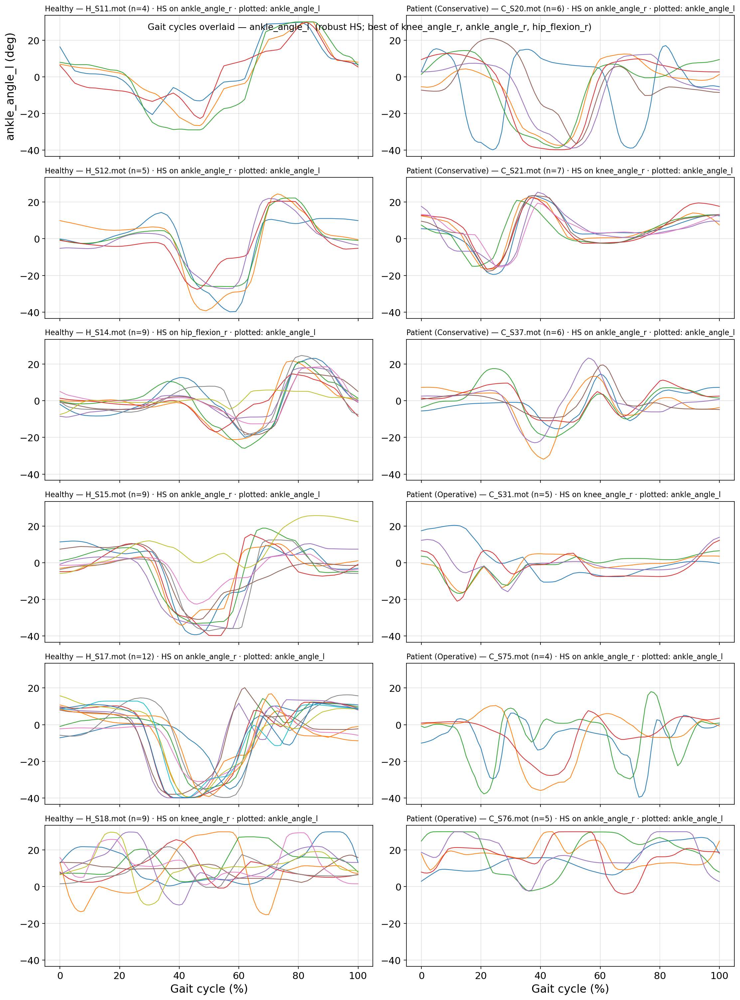

                  Group  n_cycles     HS_channel        DTW     DTW_sd  \
H_S11.mot       Healthy         4  ankle_angle_r   9.621011   7.336474   
H_S12.mot       Healthy         5  ankle_angle_r  15.373662  10.039287   
H_S14.mot       Healthy         9  hip_flexion_r  12.140334   9.554642   
H_S15.mot       Healthy         9  ankle_angle_r  51.188947  69.712597   
H_S17.mot       Healthy        12  ankle_angle_r  22.426925  15.594801   
H_S18.mot       Healthy         9   knee_angle_r  39.140712  33.700266   
C_S20.mot  Conservative         6  ankle_angle_r  82.283742  87.858242   
C_S21.mot  Conservative         7   knee_angle_r   2.982520   1.765166   
C_S37.mot  Conservative         6  ankle_angle_r  16.214163   6.932096   
C_S31.mot  Conservative         5   knee_angle_r  23.557937  22.346536   
C_S75.mot  Conservative         4  ankle_angle_r  48.241295  35.173073   
C_S76.mot  Conservative         5  ankle_angle_r  39.377805  22.135652   
O_S1.mot      Operative         7  ank

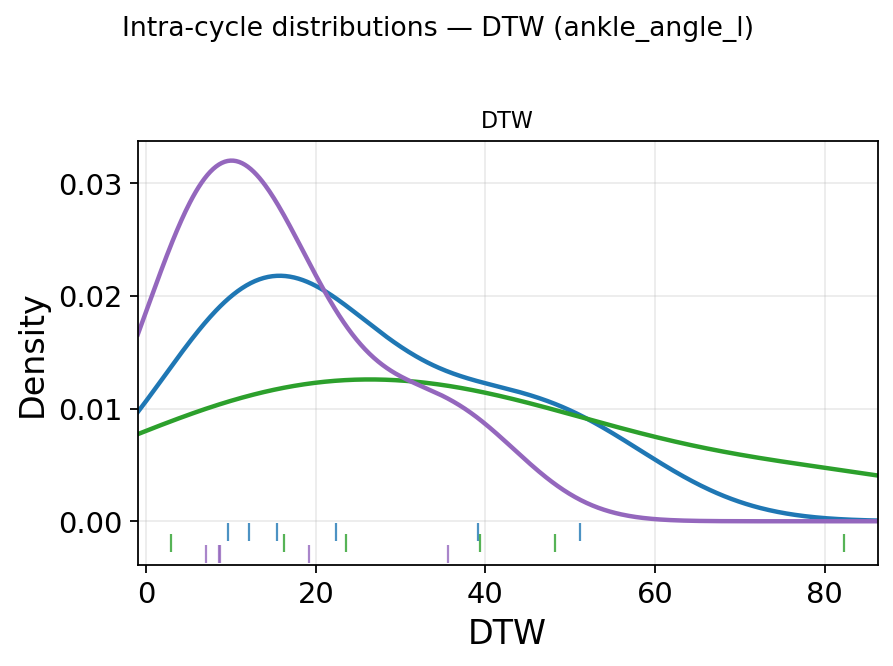

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_TAM_ankle_angle_l.png


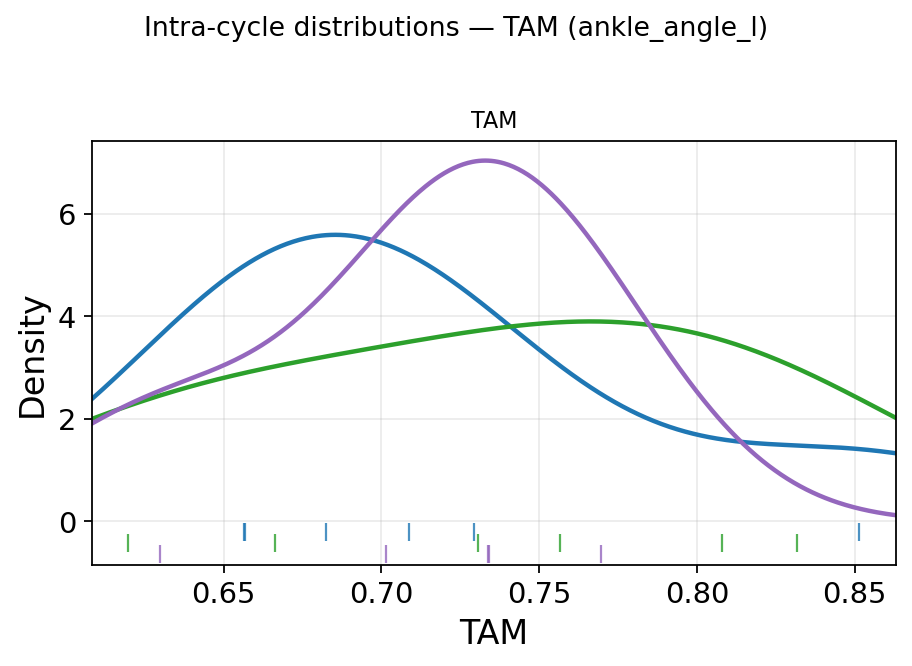

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_RMSE_ankle_angle_l.png


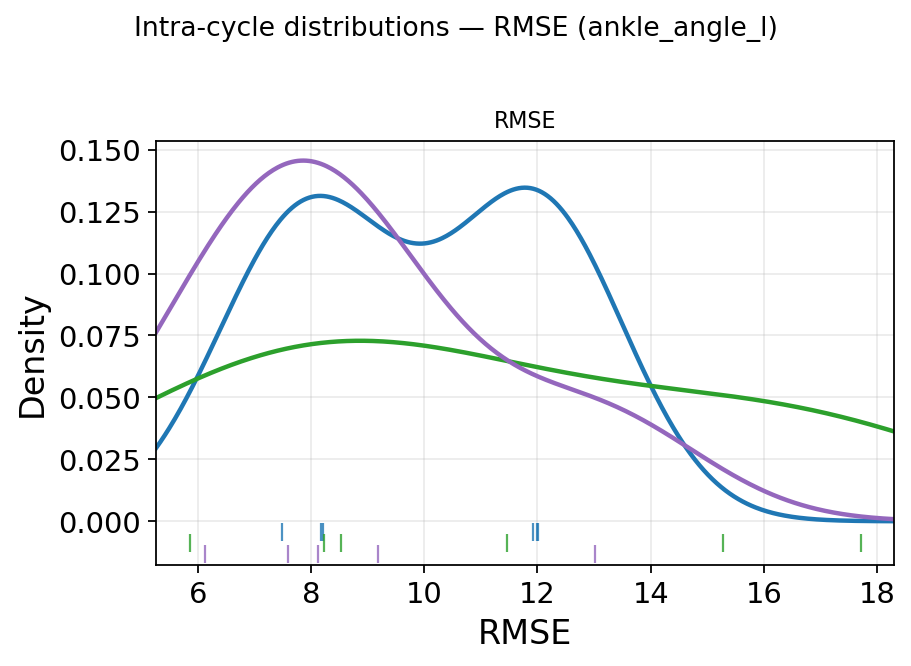

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_ROM_mean_ankle_angle_l.png


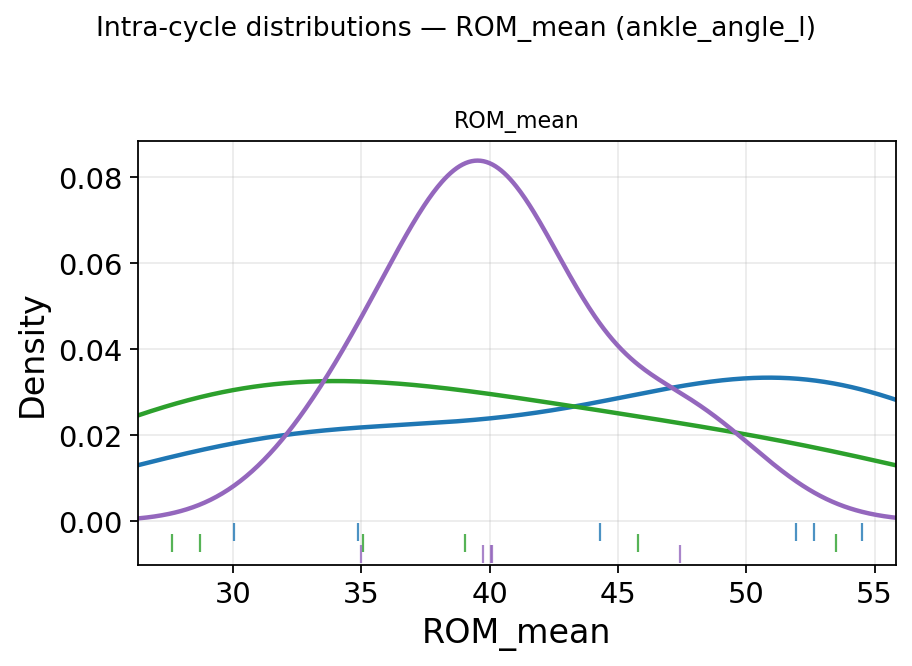

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_PeakFlex_mean_ankle_angle_l.png


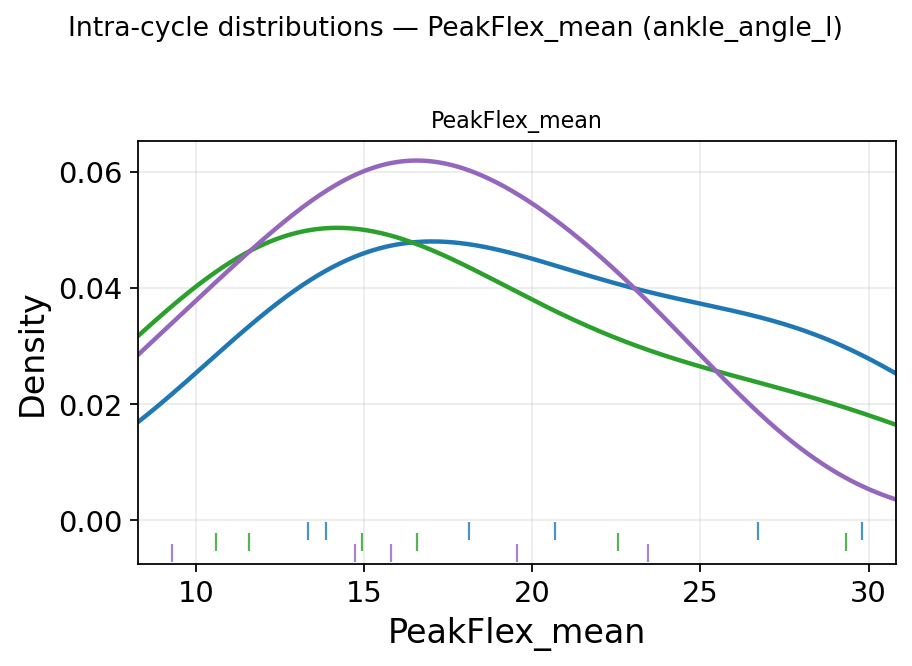

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_HS_angle_mean_ankle_angle_l.png


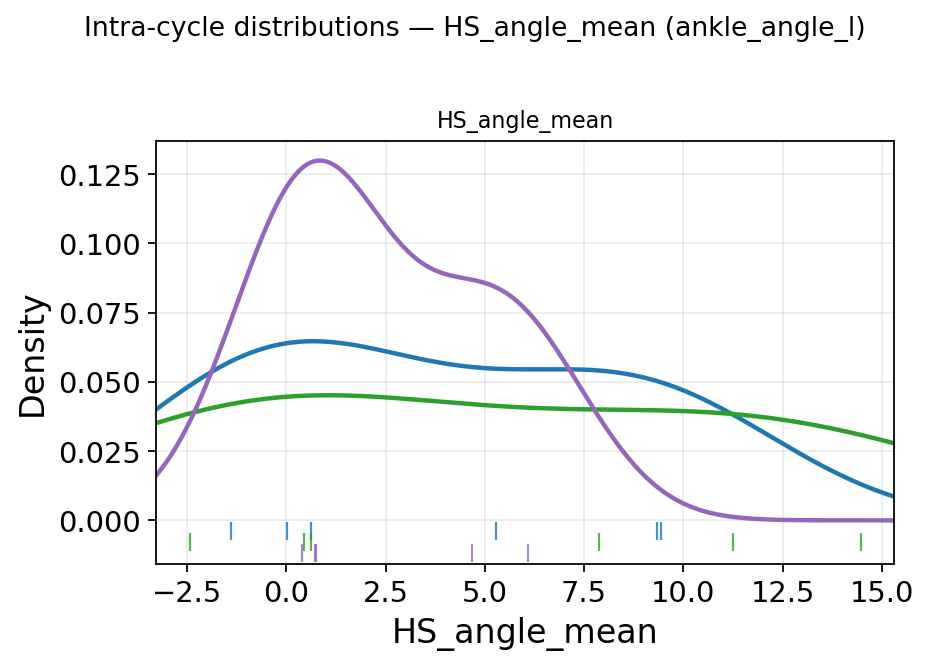

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_PeakTime_mean_pct_ankle_angle_l.png


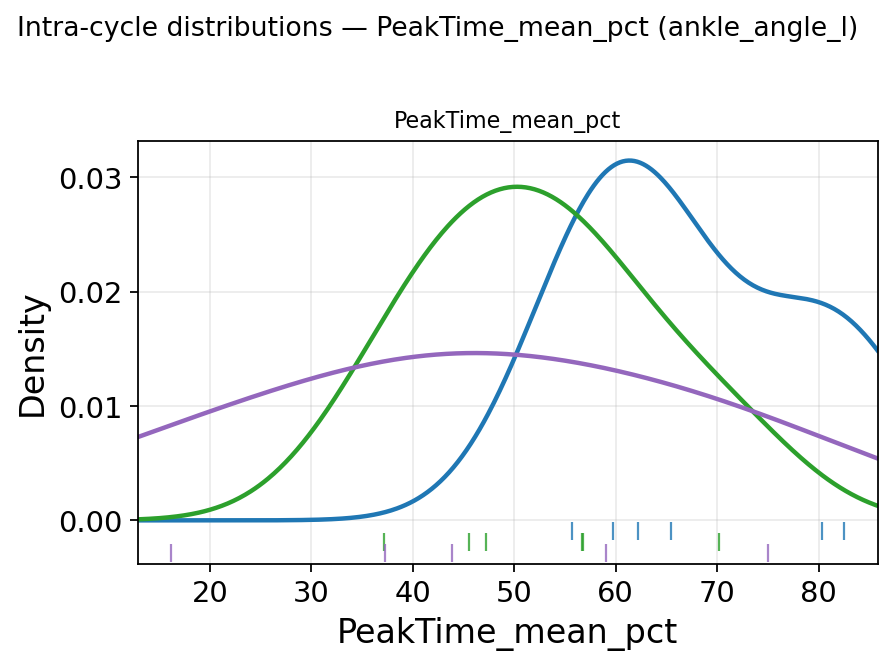

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_ShapeCorr_mean_ankle_angle_l.png


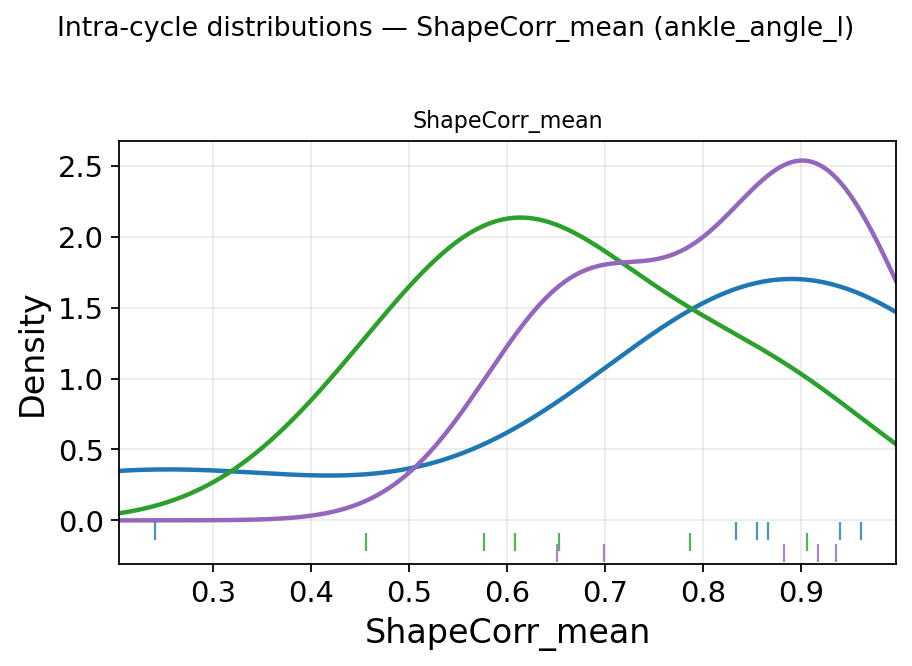

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_ShapeSD_mean_ankle_angle_l.png


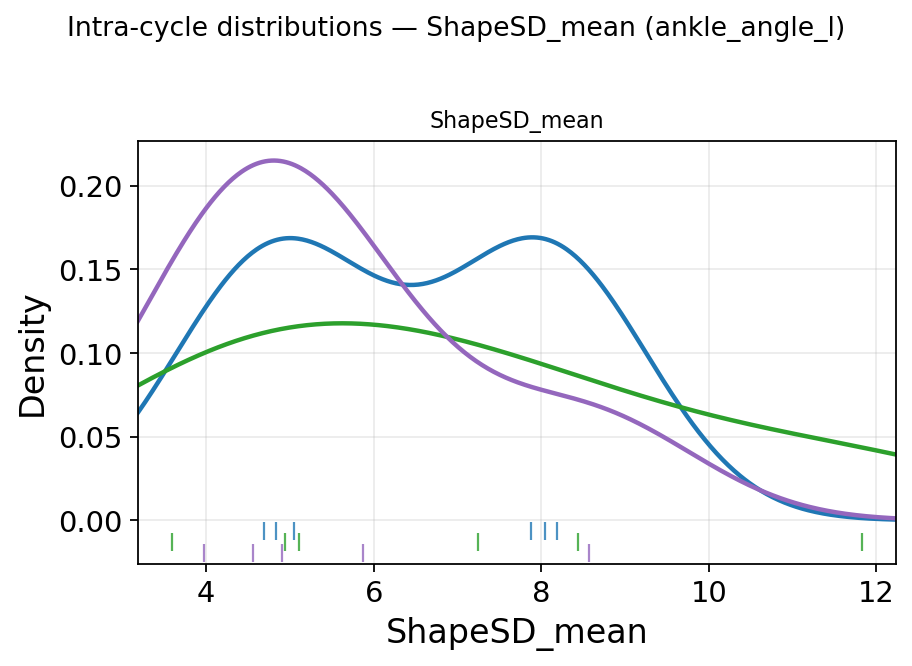

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_Smooth_JerkRMS_ankle_angle_l.png


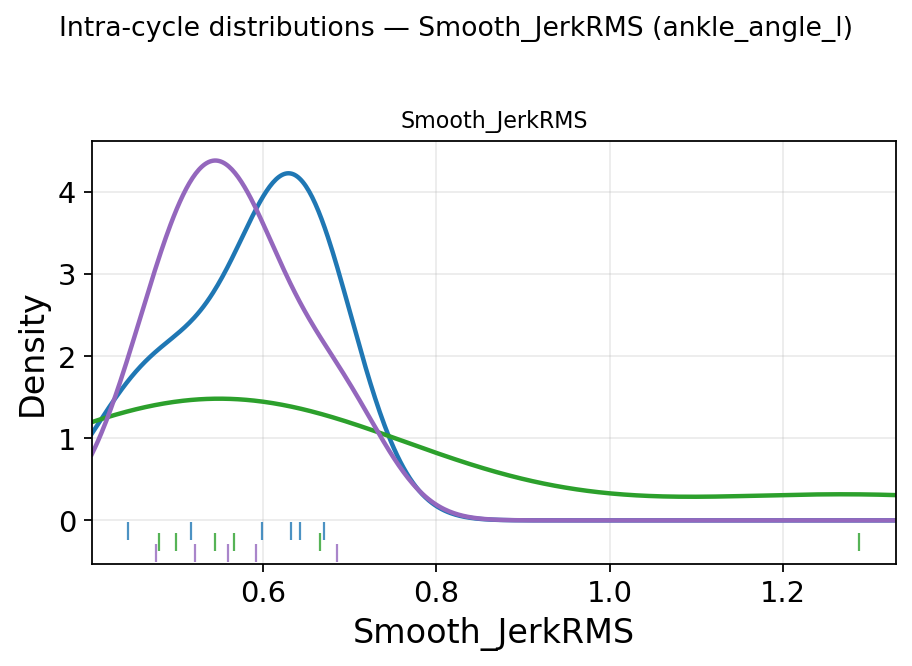

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_Smooth_SlopeVar_ankle_angle_l.png


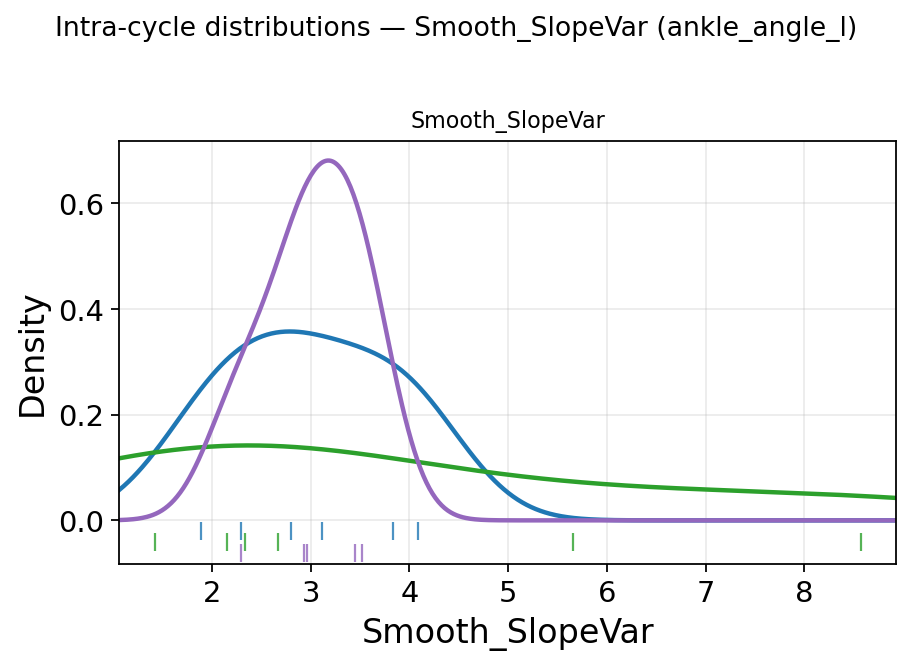

Saved: /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_HarmonicRatio_ankle_angle_l.png


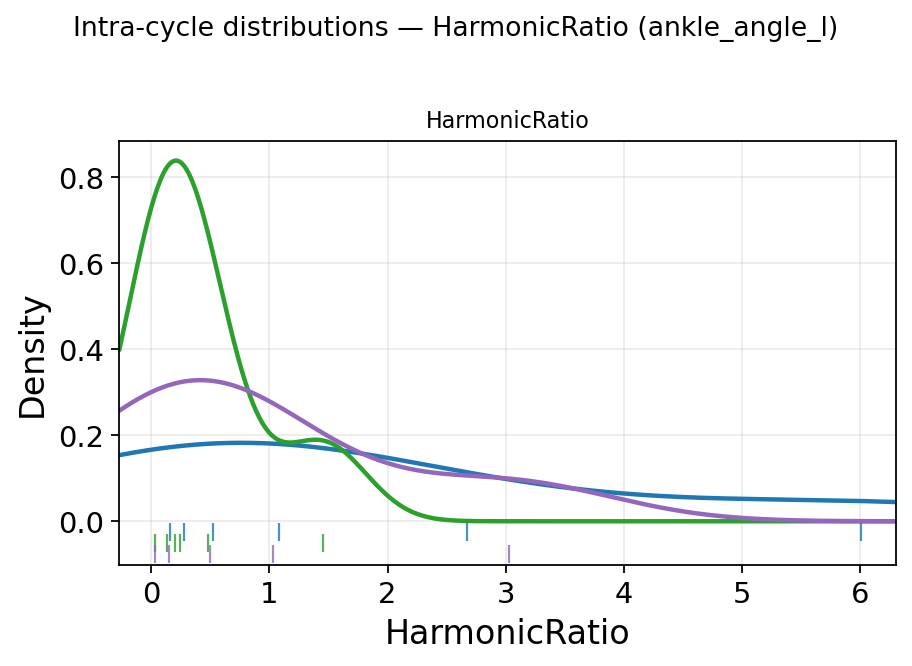

Saved group distributions → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/kde_grid_ankle_angle_l.png


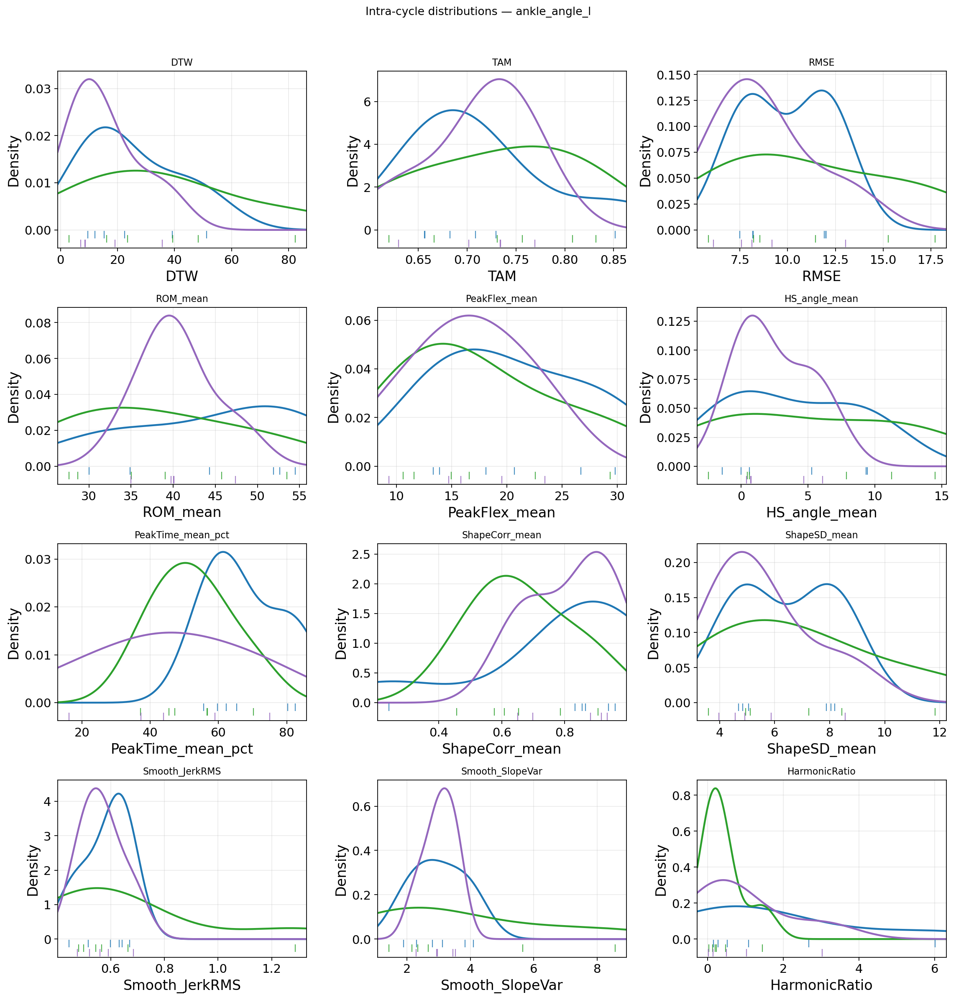

Saved ALL metrics grid → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/plots_intracycle/ALL_METRICS_kde_ankle_angle_l.png


In [110]:
# ==================== Intra-gait-cycle analysis (configurable plots) ====================
from pathlib import Path
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import json
import re
import math
from io import StringIO
from typing import List, Optional

# Metrics (phase-based)
from scipy.signal import hilbert
from scipy.stats import gaussian_kde

# ---------------------- Configuration ----------------------
INPUT_DIR   = Path("/Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections")

PLOT_ANGLE  = "ankle_angle_l"   # <-- the ONLY angle used for plotting (strict)
DETECT_CANDIDATES = ["knee_angle_r", "ankle_angle_r", "hip_flexion_r"]  # for HS detection only

HEALTHY_PICK      = ["H_S11.mot", "H_S12.mot", "H_S14.mot", "H_S15.mot", "H_S17.mot", "H_S18.mot"]
CONSERVATIVE_PICK = ["C_S20.mot", "C_S21.mot","C_S37.mot", "C_S31.mot", "C_S75.mot", "C_S76.mot"]
OPERATIVE_PICK = ["O_S1.mot", "O_S7.mot", "O_S12.mot", "O_S72.mot", "O_S70.mot", "O_S75.mot"]
# HS detection
SMOOTH_MED_SEC     = 0.15
SMOOTH_MEAN_SEC    = 0.10
NEIGHBORHOOD_SEC   = 0.30
MIN_STEP_SEC       = 0.80
MAX_STEP_SEC       = 2.00
BASE_PROM_DEG      = 4.0
MAD_K              = 3.5
MIN_CYCLES_KEEP    = 4

# Plot-cycle smoothing
PLOT_SMOOTH_MED_SEC  = 0.12
PLOT_SMOOTH_MEAN_SEC = 0.08

# Plot look
FIGSIZE  = (14, 20)
LINEWIDTH = 1.0
ALPHA     = 0.95

# Save overlay grid figure?
SAVE_FIG = False
FIG_PATH = INPUT_DIR / f"cycles_grid_{PLOT_ANGLE}.png"

# ===================== VALIDATION-STYLE DTW SETTINGS =====================
DTW_COST_MODE   = "swdtw"   # "euclidean" or "swdtw"
BAND_RATIO      = 0.10      # Sakoe–Chiba band width as a fraction of max(n, m)
SMOOTH_WIN      = 21        # odd window length for smoothing in "swdtw"
ALPHA_MIX       = 0.5       # 0..1 blend of amplitude vs derivative cost in "swdtw"
HV_PENALTY      = 0.10      # penalty for horizontal/vertical steps
TRY_DERIVATIVE  = True      # (only applied when DTW_COST_MODE == "euclidean")
TAM_HIGH_THRESH = 1.5       # retry with derivative if TAM > this (euclidean mode)
DTW_NORMALIZE   = "xlen"    # "xlen" (len(x)) or "path" (path length)
# ==========================================================================

# ===================== Group distribution plots (choose your style) =====================
PLOT_GROUP_DISTS = True
GROUP_DIST_KIND  = "kde"   # <-- choose: "violin" | "box" | "dot" | "kde"
GROUP_PLOTS_DIR  = INPUT_DIR / "plots_intracycle"
GROUP_PLOTS_ONE_PER_METRIC = False     # True = one PNG per metric; False = grid
SHOW_MEAN_AND_SD_LINES     = True      # overlays (for "dot" & "box" modes)
INTRACYCLE_METRICS_TO_PLOT = [
    # validation-style repeatability (per subject, pairwise across cycles)
    "DTW", "TAM", "RMSE",
    # intra-cycle features on normalized cycles
    "ROM_mean", "PeakFlex_mean", "HS_angle_mean",
    "PeakTime_mean_pct", "ShapeCorr_mean", "ShapeSD_mean",
    "Smooth_JerkRMS", "Smooth_SlopeVar", "HarmonicRatio",
]
# ---------------- Extra explicit saving controls (new) ----------------
SAVE_EACH_METRIC_PNG = True   # saves one PNG per metric (overlaid distributions)
SAVE_METRIC_GRID_PNG = True   # saves a single PNG with all metrics in a grid
METRIC_GRID_PATH     = GROUP_PLOTS_DIR / f"ALL_METRICS_{GROUP_DIST_KIND}_{PLOT_ANGLE}.png"
METRIC_GRID_COLS     = 3
# ============================================================================


# --------------------- Utilities ---------------------
def read_mot(path: Path):
    with path.open("r", encoding="utf-8", errors="ignore") as f:
        lines = f.readlines()
    end = None
    for i, ln in enumerate(lines[:300]):
        if ln.strip().lower() == "endheader":
            end = i
            break
    if end is None:
        raise ValueError(f"'endheader' not found in {path.name}")
    body = "".join(lines[end+1:])
    df = pd.read_csv(StringIO(body), delim_whitespace=True, comment="#")
    time_col = next((c for c in ["time","Time","TIME"] if c in df.columns), df.columns[0])
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="ignore")
    return df, time_col

def find_column(df: pd.DataFrame, names):
    """Soft finder used only for HS detection candidates."""
    lower = {c.lower(): c for c in df.columns}
    if isinstance(names, str):
        names = [names]
    for n in names:
        if n.lower() in lower:
            return lower[n.lower()]
    for c in df.columns:
        if re.search(r"knee.*angle.*_r", c, re.I):
            return c
    return None

def require_column(df: pd.DataFrame, desired_name: str) -> str:
    """Strict column match for plotting: must exist (case-insensitive)."""
    lower = {c.lower(): c for c in df.columns}
    key = desired_name.lower()
    if key in lower:
        return lower[key]
    cols = ", ".join(df.columns)
    raise ValueError(
        f"Requested plot angle '{desired_name}' not found in file.\n"
        f"Available columns: {cols}"
    )

def smooth_signal(y, t, med_sec=0.15, mean_sec=0.10):
    y = pd.Series(pd.to_numeric(y, errors="coerce"))
    t = np.asarray(t)
    if len(t) < 3:
        return y.to_numpy()
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0:
        return y.to_numpy()
    w_med  = max(3, int(round(med_sec / dt)))
    w_mean = max(3, int(round(mean_sec / dt)))
    y_med  = y.rolling(w_med, center=True, min_periods=1).median()
    y_s    = y_med.rolling(w_mean, center=True, min_periods=1).mean()
    return y_s.to_numpy()

def estimate_step_time(t, y, min_s=MIN_STEP_SEC, max_s=MAX_STEP_SEC):
    t = np.asarray(t); y = np.asarray(y)
    if len(t) < 5: return None
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0: return None
    w = max(3, int(round(0.5 / dt)))
    yhp = y - pd.Series(y).rolling(w, center=True, min_periods=1).mean().to_numpy()
    yhp = yhp - np.nanmean(yhp)
    ac = np.correlate(np.nan_to_num(yhp), np.nan_to_num(yhp), mode="full")
    ac = ac[ac.size//2:]
    lag_min = max(1, int(np.floor(min_s / dt)))
    lag_max = min(len(ac)-1, int(np.ceil(max_s / dt)))
    if lag_max <= lag_min: return None
    lag = lag_min + np.argmax(ac[lag_min:lag_max+1])
    return lag * dt

def robust_minima_indices(t, y, neighborhood_sec=0.30, base_prom=3.0, exp_step=None):
    t = np.asarray(t); y = np.asarray(y)
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0 or len(y) < 3:
        return []
    dy = np.diff(y, prepend=y[0]); sign = np.sign(dy)
    zero_cross = np.diff(sign, prepend=sign[0])
    cand = np.where(zero_cross > 0)[0]
    half = max(1, int(round(neighborhood_sec / dt)))
    iqr = np.nanpercentile(y, 75) - np.nanpercentile(y, 25)
    min_prom = max(BASE_PROM_DEG, 0.20 * iqr)
    good = []
    for i in cand:
        i0 = max(0, i - half); i1 = min(len(y)-1, i + half)
        left_max  = np.nanmax(y[i0:i+1]) if i0 < i else y[i]
        right_max = np.nanmax(y[i:i1+1]) if i < i1 else y[i]
        prom = min(left_max - y[i], right_max - y[i])
        if np.isfinite(prom) and prom >= min_prom:
            good.append(i)
    if not good:
        return []
    if exp_step is None:
        exp_step = estimate_step_time(t, y, MIN_STEP_SEC, MAX_STEP_SEC) or MIN_STEP_SEC
    min_dist = int(max(1, round(0.5 * exp_step / dt)))
    good = sorted(good)
    kept = []
    for i in good:
        if not kept:
            kept.append(i); continue
        if i - kept[-1] < min_dist:
            if y[i] < y[kept[-1]]:
                kept[-1] = i
        else:
            kept.append(i)
    return kept

def prune_intervals_by_mad(t, idxs, k=MAD_K):
    if len(idxs) < 3: return idxs
    times = t[np.asarray(idxs)]
    dt = np.diff(times)
    med = np.median(dt)
    mad = np.median(np.abs(dt - med)) or 1e-6
    keep = [idxs[0]]
    for i in range(1, len(idxs)):
        if abs(dt[i-1] - med) <= k * mad:
            keep.append(idxs[i])
    return keep

def detect_heel_strikes(t, y):
    exp_step = estimate_step_time(t, y, MIN_STEP_SEC, MAX_STEP_SEC) or ((MIN_STEP_SEC+MAX_STEP_SEC)/2)
    idxs = robust_minima_indices(t, y, NEIGHBORHOOD_SEC, BASE_PROM_DEG, exp_step)
    if len(idxs) >= 3:
        idxs = prune_intervals_by_mad(t, idxs, MAD_K)
    hs = []
    for i in idxs:
        if not hs:
            hs.append(i)
        else:
            dti = t[i] - t[hs[-1]]
            if MIN_STEP_SEC <= dti <= MAX_STEP_SEC:
                hs.append(i)
            elif dti < MIN_STEP_SEC:
                if y[i] < y[hs[-1]]:
                    hs[-1] = i
            else:
                hs.append(i)
    return hs

def normalize_cycle(t_seg, y_seg, n_points=101):
    t0, t1 = float(t_seg[0]), float(t_seg[-1])
    if not np.isfinite(t0) or not np.isfinite(t1) or t1 <= t0:
        gc = np.linspace(0, 100, n_points)
        return gc, np.full(n_points, np.nan)
    xq = np.linspace(t0, t1, n_points)
    yq = np.interp(xq, t_seg, y_seg)
    gc = np.linspace(0, 100, n_points)
    return gc, yq

def try_detection_channels(df, t, candidates):
    results = []
    for nm in candidates:
        col = find_column(df, nm)
        if (col is None) or (col not in df.columns):
            continue
        y_det = smooth_signal(df[col].to_numpy(), t, SMOOTH_MED_SEC, SMOOTH_MEAN_SEC)
        hs = detect_heel_strikes(t, y_det)
        if len(hs) < MIN_CYCLES_KEEP + 1:
            continue
        st = np.diff(t[np.asarray(hs)])
        cv = np.std(st) / (np.mean(st) + 1e-9)
        results.append((col, hs, cv))
    if not results:
        return None, []
    results.sort(key=lambda x: x[2])
    best_col, best_hs, _ = results[0]
    return best_col, best_hs


# ===================== VALIDATION-STYLE DTW CORE =====================
def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    x = np.asarray(x, float)
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')

def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    """
    Local cost matrix D (n x m).
      - mode="euclidean":
          use_derivative=False -> |x_i - y_j|
          use_derivative=True  -> |dx_i - dy_j|
      - mode="swdtw":
          alpha*|xs-ys|^2 + (1-alpha)*|dxs-dys|^2  (xs, ys are smoothed)
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0])
            ys = np.diff(y, prepend=y[0])
            return np.abs(xs[:, None] - ys[None, :])
        return np.abs(x[:, None] - y[None, :])

    # "swdtw"
    xs = _smooth1d(x, smooth_win)
    ys = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])
    A = (xs[:, None]  - ys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2
    return alpha*A + (1.0 - alpha)*B

def compute_dtw_windowed(x, y, band_ratio=0.10, cost_mode="swdtw",
                         smooth_win=21, alpha=0.5, hv_penalty=0.10,
                         use_derivative=False):
    """
    Exact DTW with Sakoe–Chiba band and HV penalties. Returns (acc_cost, path).
    """
    x = np.asarray(x, float); y = np.asarray(y, float)
    n, m = len(x), len(y)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win,
                           alpha=alpha, use_derivative=use_derivative)

    acc  = np.full((n, m), np.inf, dtype=float)
    back = np.full((n, m), -1, dtype=np.int8)  # 0:diag, 1:horiz (i-1,j), 2:vert (i,j-1)

    band = int(max(n, m) * band_ratio)

    for i in range(n):
        j_lo = max(0, i - band)
        j_hi = min(m - 1, i + band)
        if j_lo > j_hi:
            continue

        if i == 0 and j_lo == 0:
            acc[0, 0] = D[0, 0]
            back[0, 0] = -1
            for j in range(1, j_hi + 1):
                acc[0, j] = acc[0, j-1] + D[0, j] + hv_penalty
                back[0, j] = 2
            continue

        if i > 0 and j_lo == 0 and np.isfinite(acc[i-1, 0]):
            acc[i, 0] = acc[i-1, 0] + D[i, 0] + hv_penalty
            back[i, 0] = 1

        for j in range(max(j_lo, 1), j_hi + 1):
            c_diag = acc[i-1, j-1] + D[i, j]
            c_hor  = acc[i-1, j]   + D[i, j] + hv_penalty
            c_ver  = acc[i, j-1]   + D[i, j] + hv_penalty

            if c_diag <= c_hor and c_diag <= c_ver:
                acc[i, j] = c_diag; back[i, j] = 0
            elif c_hor <= c_ver:
                acc[i, j] = c_hor;  back[i, j] = 1
            else:
                acc[i, j] = c_ver;  back[i, j] = 2

    # Backtrack
    i, j = n-1, m-1
    if not np.isfinite(acc[i, j]):
        return acc, []
    path = [(i, j)]
    while not (i == 0 and j == 0):
        b = back[i, j]
        if b == 0:
            i, j = i-1, j-1
        elif b == 1:
            i, j = i-1, j
        elif b == 2:
            i, j = i, j-1
        else:
            break
        path.append((i, j))
    path.reverse()
    return acc, path

def tam_from_path(path, N, M):
    adv = delay = phase = 0
    for (i0, j0), (i1, j1) in zip(path[:-1], path[1:]):
        di = i1 - i0
        dj = j1 - j0
        if   di == 1 and dj == 0: adv   += 1   # horizontal step
        elif di == 0 and dj == 1: delay += 1   # vertical step
        elif di == 1 and dj == 1: phase += 1   # diagonal step

    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)

def _normalize_dtw_cost(total_cost, path, xlen):
    if DTW_NORMALIZE == "path" and path:
        return total_cost / max(1, len(path))
    return total_cost / max(1, xlen)
# ======================================================================


# --------------------- Metrics (pairwise over cycles) ---------------------
def pairwise_metrics(cycles):
    """
    cycles: list of (101,) arrays (normalized gait cycles).
    Uses validation-style DTW + path-based TAM; also RMSE, CRP_mean, CRP_sd, IPS.
    Returns averages over all cycle pairs, plus SD for DTW/TAM/RMSE.
    """
    n = len(cycles)
    if n < 2:
        return dict(DTW=np.nan, DTW_sd=np.nan,
                    TAM=np.nan, TAM_sd=np.nan,
                    RMSE=np.nan, RMSE_sd=np.nan,
                    CRP_mean=np.nan, CRP_sd=np.nan, IPS=np.nan)

    dtw_vals, tam_vals, rmse_vals, ips_vals, crp_diffs = [], [], [], [], []

    for i in range(n):
        for j in range(i+1, n):
            x = np.asarray(cycles[i], float)
            y = np.asarray(cycles[j], float)

            # Primary DTW (validation-style)
            acc, path = compute_dtw_windowed(
                x, y,
                band_ratio=BAND_RATIO,
                cost_mode=DTW_COST_MODE,
                smooth_win=SMOOTH_WIN,
                alpha=ALPHA_MIX,
                hv_penalty=HV_PENALTY,
                use_derivative=False
            )
            if not path:
                # Fallback: effectively unbanded
                acc, path = compute_dtw_windowed(
                    x, y,
                    band_ratio=max(len(x), len(y)),
                    cost_mode=DTW_COST_MODE,
                    smooth_win=SMOOTH_WIN,
                    alpha=ALPHA_MIX,
                    hv_penalty=HV_PENALTY,
                    use_derivative=False
                )

            tam0 = tam_from_path(path, len(x), len(y))
            dtw0 = _normalize_dtw_cost(acc[-1, -1], path, len(x))

            # Optional derivative retry (only meaningful for euclidean)
            if TRY_DERIVATIVE and DTW_COST_MODE == "euclidean" and tam0 > TAM_HIGH_THRESH:
                accd, pathd = compute_dtw_windowed(
                    x, y,
                    band_ratio=BAND_RATIO,
                    cost_mode="euclidean",
                    smooth_win=SMOOTH_WIN,
                    alpha=ALPHA_MIX,
                    hv_penalty=HV_PENALTY,
                    use_derivative=True
                )
                if pathd:
                    tamd = tam_from_path(pathd, len(x), len(y))
                    if tamd < tam0:
                        tam0 = tamd
                        dtw0 = _normalize_dtw_cost(accd[-1, -1], pathd, len(x))

            dtw_vals.append(dtw0)
            tam_vals.append(tam0)

            # Pointwise metrics on normalized timebase
            diff = x - y
            rmse_vals.append(float(np.sqrt(np.nanmean(diff**2))))

            # Phase-based metrics (CRP/IPS)
            hx, hy = hilbert(x), hilbert(y)
            dphi = np.unwrap(np.angle(hx) - np.angle(hy))
            crp_diffs.extend(dphi)
            ips_vals.append(float(np.nanmean(np.abs(np.cos(dphi)))))

    crp_diffs = np.asarray(crp_diffs)
    R = np.abs(np.nanmean(np.exp(1j * crp_diffs)))

    return dict(
        DTW=float(np.nanmean(dtw_vals)),
        DTW_sd=float(np.nanstd(dtw_vals)),
        TAM=float(np.nanmean(tam_vals)),
        TAM_sd=float(np.nanstd(tam_vals)),
        RMSE=float(np.nanmean(rmse_vals)),
        RMSE_sd=float(np.nanstd(rmse_vals)),
        CRP_mean=float(np.angle(np.nanmean(np.exp(1j * crp_diffs)))) if np.isfinite(R) else np.nan,
        CRP_sd=float(np.sqrt(-2 * np.log(R))) if (R > 0 and np.isfinite(R)) else np.nan,
        IPS=float(np.nanmean(ips_vals)),
    )

# --------------------- Intra-cycle feature metrics ---------------------
def _nan_corr(x, y):
    x = np.asarray(x, float); y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    if np.sum(m) < 3:
        return np.nan
    xz = (x[m] - np.mean(x[m])) / (np.std(x[m]) + 1e-12)
    yz = (y[m] - np.mean(y[m])) / (np.std(y[m]) + 1e-12)
    return float(np.mean(xz * yz))

def _harmonic_ratio_mean_cycle(mean_cycle):
    """
    Harmonic ratio on the subject's MEAN normalized cycle (0..100%, 101 samples):
      HR = power at fundamental (k=1) / sum of powers at harmonics k=2..6.
    """
    c = np.asarray(mean_cycle, float)
    if c.size < 4 or not np.any(np.isfinite(c)):
        return np.nan
    x = c - np.nanmean(c)
    X = np.fft.rfft(x)
    P = np.abs(X)**2
    p1 = P[1] if len(P) > 1 else np.nan
    denom = np.nansum(P[2:7]) if len(P) > 2 else np.nan
    if not np.isfinite(p1) or not np.isfinite(denom) or denom <= 0:
        return np.nan
    return float(p1 / denom)

def cycle_feature_metrics(cycles):
    """
    cycles: list of (101,) arrays normalized 0..100%.
    Returns per-subject summaries of the requested intra-cycle metrics.
    """
    if not cycles:
        return dict(
            ROM_mean=np.nan, ROM_sd=np.nan,
            PeakFlex_mean=np.nan, PeakFlex_sd=np.nan,
            HS_angle_mean=np.nan, HS_angle_sd=np.nan,
            PeakTime_mean_pct=np.nan, PeakTime_sd_pct=np.nan,
            ShapeCorr_mean=np.nan, ShapeCorr_sd=np.nan,
            ShapeSD_mean=np.nan,
            Smooth_JerkRMS=np.nan, Smooth_SlopeVar=np.nan,
            HarmonicRatio=np.nan
        )

    M = np.vstack(cycles)  # shape: (n_cycles, 101)
    # Basic per-cycle stats
    rom = np.nanmax(M, axis=1) - np.nanmin(M, axis=1)
    peak_vals = np.nanmax(M, axis=1)
    hs_vals = M[:, 0]
    # Timing of peak (index → %GC robustly)
    idx_peak = np.nanargmax(M, axis=1)
    peak_t_pct = idx_peak * (100.0 / (M.shape[1]-1))

    # Shape consistency: correlation of each cycle with the mean template
    mean_cycle = np.nanmean(M, axis=0)
    corrs = np.array([_nan_corr(c, mean_cycle) for c in M])

    # Variability across cycles: mean pointwise SD across %GC
    sd_profile = np.nanstd(M, axis=0)
    shape_sd_mean = float(np.nanmean(sd_profile))

    # Smoothness on normalized timebase (per-cycle), then average
    diffs1 = np.diff(M, n=1, axis=1)
    diffs2 = np.diff(M, n=2, axis=1)
    slope_var = float(np.nanmean(np.nanvar(diffs1, axis=1)))
    jerk_rms  = float(np.nanmean(np.sqrt(np.nanmean(diffs2**2, axis=1))))

    # Harmonic ratio on the mean cycle
    hr = _harmonic_ratio_mean_cycle(mean_cycle)

    return dict(
        ROM_mean=float(np.nanmean(rom)), ROM_sd=float(np.nanstd(rom)),
        PeakFlex_mean=float(np.nanmean(peak_vals)), PeakFlex_sd=float(np.nanstd(peak_vals)),
        HS_angle_mean=float(np.nanmean(hs_vals)), HS_angle_sd=float(np.nanstd(hs_vals)),
        PeakTime_mean_pct=float(np.nanmean(peak_t_pct)), PeakTime_sd_pct=float(np.nanstd(peak_t_pct)),
        ShapeCorr_mean=float(np.nanmean(corrs)), ShapeCorr_sd=float(np.nanstd(corrs)),
        ShapeSD_mean=shape_sd_mean,
        Smooth_JerkRMS=jerk_rms,
        Smooth_SlopeVar=slope_var,
        HarmonicRatio=hr
    )

# --------------------- Core helpers ---------------------
def build_cycles_for_file(fpath: Path, plot_angle: str):
    """Returns (cycles: list[np.ndarray], det_col_used: str or None)."""
    df, time_col = read_mot(fpath)
    t = pd.to_numeric(df[time_col], errors="coerce").to_numpy()
    det_col, hs = try_detection_channels(df, t, DETECT_CANDIDATES)
    plot_col = require_column(df, plot_angle)  # STRICT
    if (det_col is None) or (plot_col not in df.columns) or len(hs) < 2:
        return [], det_col
    y_raw = pd.to_numeric(df[plot_col], errors="coerce").to_numpy()
    y_s   = smooth_signal(y_raw, t, PLOT_SMOOTH_MED_SEC, PLOT_SMOOTH_MEAN_SEC)
    cycles = []
    for a, b in zip(hs[:-1], hs[1:]):
        i0, i1 = int(a), int(b)
        if i1 - i0 < 5:
            continue
        t_seg = t[i0:i1+1]; y_seg = y_s[i0:i1+1]
        _, yn = normalize_cycle(t_seg, y_seg, 101)
        if np.sum(np.isfinite(yn)) >= 50:
            cycles.append(yn)
    return cycles, det_col

def collect_cycles_by_subject():
    groups = {"Healthy": HEALTHY_PICK, "Conservative": CONSERVATIVE_PICK, "Operative": OPERATIVE_PICK}
    out = {}
    for grp, flist in groups.items():
        for fname in flist:
            fpath = INPUT_DIR / fname
            try:
                cycles, det_col = build_cycles_for_file(fpath, PLOT_ANGLE)
                out[fname] = {"group": grp, "cycles": cycles, "det_col": det_col}
            except Exception as e:
                print(f"Error {fname}: {e}")
                out[fname] = {"group": grp, "cycles": [], "det_col": None}
    return out

def compute_metrics_table(subject_info: dict) -> pd.DataFrame:
    rows = []
    for fname, info in subject_info.items():
        cyc = info["cycles"]
        met_pair = pairwise_metrics(cyc)       # DTW/TAM/RMSE (+ SDs) etc.
        met_feat = cycle_feature_metrics(cyc)  # ROM, PeakFlex, HS@0%, PeakTime, Shape, Smoothness, HR
        met = {}
        met.update(met_pair)
        met.update(met_feat)
        met["Group"]      = info["group"]
        met["n_cycles"]   = len(cyc)
        met["HS_channel"] = info["det_col"]
        rows.append(pd.Series(met, name=fname))

    cols = [
        "Group","n_cycles","HS_channel",
        # validation-style repeatability (with SDs)
        "DTW","DTW_sd","TAM","TAM_sd","RMSE","RMSE_sd","CRP_mean","CRP_sd","IPS",
        # intra-cycle features
        "ROM_mean","ROM_sd",
        "PeakFlex_mean","PeakFlex_sd",
        "HS_angle_mean","HS_angle_sd",
        "PeakTime_mean_pct","PeakTime_sd_pct",
        "ShapeCorr_mean","ShapeCorr_sd","ShapeSD_mean",
        "Smooth_JerkRMS","Smooth_SlopeVar","HarmonicRatio",
    ]
    df = pd.DataFrame(rows)
    for c in cols:
        if c not in df.columns:
            df[c] = np.nan
    df = df[cols]
    return df


# -------------------- Plot grid (6×2) --------------------
def plot_cycles_grid(subject_info: dict):
    fig, axes = plt.subplots(6, 2, figsize=FIGSIZE, sharex=True, sharey=False)
    fig.suptitle(f"Gait cycles overlaid — {PLOT_ANGLE}  (robust HS; best of {', '.join(DETECT_CANDIDATES)})", y=0.92)

    left_files  = HEALTHY_PICK
    right_files = CONSERVATIVE_PICK + OPERATIVE_PICK

    global_ymin, global_ymax = np.inf, -np.inf

    # Left col: Healthy
    for i in range(6):
        ax = axes[i, 0]
        if i >= len(left_files): ax.axis("off"); continue
        fname = left_files[i]; info = subject_info.get(fname, {"cycles": [], "det_col": None})
        x = np.linspace(0, 100, 101)
        for c in info["cycles"]:
            ax.plot(x, c, linewidth=LINEWIDTH, alpha=ALPHA)
            if np.isfinite(c).any():
                global_ymin = min(global_ymin, np.nanmin(c))
                global_ymax = max(global_ymax, np.nanmax(c))
        ax.set_title(f"Healthy — {fname} (n={len(info['cycles'])}) · HS on {info['det_col']} · plotted: {PLOT_ANGLE}",
                     loc="left", fontsize=10)
        ax.grid(True, alpha=0.35)
        if i == 5: ax.set_xlabel("Gait cycle (%)")
        if i == 0: ax.set_ylabel(f"{PLOT_ANGLE} (deg)")

    # Right col: Patients
    for i in range(6):
        ax = axes[i, 1]
        if i >= len(right_files): ax.axis("off"); continue
        fname = right_files[i]; info = subject_info.get(fname, {"cycles": [], "det_col": None})
        x = np.linspace(0, 100, 101)
        for c in info["cycles"]:
            ax.plot(x, c, linewidth=LINEWIDTH, alpha=ALPHA)
            if np.isfinite(c).any():
                global_ymin = min(global_ymin, np.nanmin(c))
                global_ymax = max(global_ymax, np.nanmax(c))
        grp_label = "Patient (Conservative)" if i < 3 else "Patient (Operative)"
        ax.set_title(f"{grp_label} — {fname} (n={len(info['cycles'])}) · HS on {info['det_col']} · plotted: {PLOT_ANGLE}",
                     loc="left", fontsize=10)
        ax.grid(True, alpha=0.35)
        if i == 5: ax.set_xlabel("Gait cycle (%)")

    if np.isfinite(global_ymin) and np.isfinite(global_ymax) and global_ymax > global_ymin:
        pad = 0.05 * (global_ymax - global_ymin)
        for r in range(6):
            for c in range(2):
                if axes[r, c].has_data():
                    axes[r, c].set_ylim(global_ymin - pad, global_ymax + pad)

    plt.tight_layout(rect=[0, 0, 1, 0.96])
    if SAVE_FIG:
        plt.savefig(FIG_PATH, dpi=300); print(f"Saved figure → {FIG_PATH}")
    plt.show()


# -------------------- Group distribution plotting (selectable) --------------------
def _scatter_subject_points(ax, x0, arr, jitter_sd=0.04, color="#1f77b4"):
    if len(arr) == 0: return
    jitter = np.random.normal(0, jitter_sd, size=len(arr))
    ax.scatter(np.full_like(arr, x0, dtype=float) + jitter, arr,
               s=18, alpha=0.9, color=color, edgecolors="none")

def _overlay_mean_sd(ax, x0, arr, width=0.28, color="k"):
    if len(arr) == 0: return
    m = float(np.nanmean(arr))
    s = float(np.nanstd(arr))
    ax.plot([x0 - width, x0 + width], [m, m], color=color, linewidth=1.4, alpha=0.8)  # mean line
    ax.plot([x0, x0], [m - s, m + s], color=color, linewidth=1.0, alpha=0.6)          # ±1 SD bar
    ax.scatter([x0], [m], color=color, s=24, zorder=3)

def _draw_violin(ax, data_by_group, x_ticks):
    parts = ax.violinplot(data_by_group, positions=x_ticks, widths=0.8,
                          showmeans=True, showextrema=False, showmedians=False)
    for pc in parts['bodies']:
        pc.set_facecolor("#a78bfa")  # violet
        pc.set_edgecolor("#6b21a8")
        pc.set_alpha(0.5)
    if 'cmeans' in parts:
        parts['cmeans'].set_color("#6b21a8")
        parts['cmeans'].set_linewidth(1.6)

def _draw_box(ax, data_by_group, x_ticks):
    bp = ax.boxplot(data_by_group, positions=x_ticks, widths=0.55, patch_artist=True,
                    showmeans=False, whis=1.5)
    for patch in bp['boxes']:
        patch.set_facecolor("#d8b4fe")
        patch.set_edgecolor("#6b21a8")
        patch.set_alpha(0.55)
    for element in ['whiskers', 'caps', 'medians']:
        for line in bp[element]:
            line.set_color("#6b21a8")
            line.set_linewidth(1.2)

def _draw_kde_overlay(ax, data_by_group, labels, colors):
    """
    Plot overlaid KDE curves for all groups on a shared X axis.
    Also adds a small rug per group along the baseline.
    """
    # collect all values to set a common x-grid
    vals = [a[np.isfinite(a)] for a in data_by_group]
    nonempty = [a for a in vals if a.size > 0]
    if not nonempty:
        return
    all_vals = np.concatenate(nonempty)
    x_min, x_max = float(np.nanmin(all_vals)), float(np.nanmax(all_vals))
    pad = 0.05 * (x_max - x_min + 1e-9)
    x = np.linspace(x_min - pad, x_max + pad, 512)

    max_d = 0.0
    densities = []
    for arr in vals:
        if arr.size >= 2 and np.nanstd(arr) > 0:
            kde = gaussian_kde(arr)
            d = kde(x)
        elif arr.size == 1:
            # degenerate: draw a very narrow bump
            mu = arr[0]
            sigma = 0.02 * (x_max - x_min + 1e-9)
            d = (1.0 / (sigma * np.sqrt(2*np.pi))) * np.exp(-0.5*((x-mu)/sigma)**2)
        else:
            d = np.zeros_like(x)
        densities.append(d)
        max_d = max(max_d, float(np.nanmax(d)) if d.size else 0.0)

    # plot lines
    for d, lab, col in zip(densities, labels, colors):
        if d.size:
            ax.plot(x, d, label=f"{lab} (n={len(vals[labels.index(lab)])})", linewidth=2.0, color=col)

    # rugs along baseline (slight vertical offsets to avoid overlap)
    if max_d > 0:
        for i, (arr, col) in enumerate(zip(vals, colors)):
            if arr.size == 0:
                continue
            y0 = -0.03 * max_d * (i + 1)   # staggered
            ax.plot(arr, np.full_like(arr, y0, dtype=float), "|", color=col, markersize=8, alpha=0.8)

    ax.set_xlim(x[0], x[-1])
    ax.set_ylim(bottom=-0.12 * max_d)  # leave room for rugs
    ax.set_ylabel("Density")


def plot_group_distributions(metrics_df: pd.DataFrame,
                             metrics: List[str],
                             kind: str = "violin",
                             title_prefix: str = "Intra-cycle distributions",
                             save_dir: Optional[Path] = None,
                             one_per_metric: bool = False):
    """
    Render group-wise distributions with selectable style:
      kind ∈ {"violin","box","dot","kde"}
    """
    group_order = ["Healthy", "Conservative", "Operative"]
    x_ticks = np.arange(len(group_order))

    def _panel(ax, metric: str):
        data_by_group = [
            metrics_df.loc[metrics_df["Group"] == g, metric].astype(float).dropna().values
            for g in group_order
        ]

        # Empty? still render axes/labels
        if all(len(v) == 0 for v in data_by_group):
            ax.set_title(f"{metric} (no data)")
            ax.set_xticks(x_ticks); ax.set_xticklabels(group_order, rotation=20)
            ax.grid(True, alpha=0.25)
            return

        if kind == "violin":
            _draw_violin(ax, data_by_group, x_ticks)
            for i, arr in enumerate(data_by_group):
                _scatter_subject_points(ax, x_ticks[i], arr)
        elif kind == "box":
            _draw_box(ax, data_by_group, x_ticks)
            for i, arr in enumerate(data_by_group):
                _scatter_subject_points(ax, x_ticks[i], arr)
                if SHOW_MEAN_AND_SD_LINES:
                    _overlay_mean_sd(ax, x_ticks[i], arr)
        elif kind == "dot":
            # Just subject dots + optional summary lines
            for i, arr in enumerate(data_by_group):
                _scatter_subject_points(ax, x_ticks[i], arr)
                if SHOW_MEAN_AND_SD_LINES:
                    _overlay_mean_sd(ax, x_ticks[i], arr)
        elif kind == "kde":
            _draw_kde_overlay(
                ax,
                data_by_group,
                labels=["Healthy", "Conservative", "Operative"],
                colors=["#1f77b4", "#2ca02c", "#9467bd"],  # blue, green, purple
            )
            ax.set_xlabel(metric)     # numeric axis label
            ax.grid(True, alpha=0.25)
            ax.set_title(metric, fontsize=10)
            return
        else:
            raise ValueError(f"Unknown kind='{kind}'. Use 'violin'|'box'|'dot'|'kde'.")

        ax.set_xticks(x_ticks); ax.set_xticklabels(group_order, rotation=20)
        ax.set_title(metric, fontsize=10)
        ax.grid(True, alpha=0.25)

    if one_per_metric:
        # One figure per metric
        if save_dir is not None: save_dir.mkdir(parents=True, exist_ok=True)
        for metric in metrics:
            fig, ax = plt.subplots(1, 1, figsize=(5.8, 4.2))
            _panel(ax, metric)
            fig.suptitle(f"{title_prefix} — {metric} ({PLOT_ANGLE})", y=0.98, fontsize=12)
            plt.tight_layout(rect=[0, 0, 1, 0.95])
            if save_dir is not None:
                out = save_dir / f"{kind}_{metric}_{PLOT_ANGLE}.png"
                fig.savefig(out, dpi=300)
                print(f"Saved: {out}")
            if PLOT_GROUP_DISTS:
                plt.show()
            else:
                plt.close(fig)
        return

    # Grid of metrics
    n = len(metrics)
    ncols = 3
    nrows = int(math.ceil(n / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), squeeze=False)
    axes_flat = axes.ravel()
    for ax in axes_flat[n:]:
        ax.axis("off")
    for k, metric in enumerate(metrics):
        _panel(axes_flat[k], metric)

    fig.suptitle(f"{title_prefix} — {PLOT_ANGLE}", y=0.98, fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    if save_dir is not None:
        save_dir.mkdir(parents=True, exist_ok=True)
        out = save_dir / f"{kind}_grid_{PLOT_ANGLE}.png"
        fig.savefig(out, dpi=300)
        print(f"Saved group distributions → {out}")
    if PLOT_GROUP_DISTS:
        plt.show()
    else:
        plt.close(fig)

def save_metric_grid_png(metrics_df: pd.DataFrame,
                         metrics: List[str],
                         kind: str,
                         out_path: Path,
                         ncols: int = 3,
                         title_prefix: str = "Intra-cycle distributions"):
    """
    NEW: Save a single PNG containing ALL metrics in a grid (explicit path).
    Uses the same panels as plot_group_distributions(kind).
    """
    out_path.parent.mkdir(parents=True, exist_ok=True)
    n = len(metrics)
    nrows = int(math.ceil(n / max(1, ncols)))
    fig, axes = plt.subplots(nrows, ncols, figsize=(4.8*ncols, 3.8*nrows), squeeze=False)
    axes_flat = axes.ravel()

    # local delegate: reuse panel logic
    def _panel(ax, metric: str):
        data_by_group = [
            metrics_df.loc[metrics_df["Group"] == g, metric].astype(float).dropna().values
            for g in ["Healthy", "Conservative", "Operative"]
        ]
        if all(len(v) == 0 for v in data_by_group):
            ax.set_title(f"{metric} (no data)")
            ax.grid(True, alpha=0.25)
            return
        if kind == "kde":
            _draw_kde_overlay(
                ax, data_by_group,
                labels=["Healthy", "Conservative", "Operative"],
                colors=["#1f77b4", "#2ca02c", "#9467bd"]
            )
            ax.set_xlabel(metric)
            ax.grid(True, alpha=0.25)
            ax.set_title(metric, fontsize=10)
        elif kind == "violin":
            x_ticks = np.arange(3)
            _draw_violin(ax, data_by_group, x_ticks)
            for i, arr in enumerate(data_by_group):
                _scatter_subject_points(ax, x_ticks[i], arr)
            ax.set_xticks(x_ticks); ax.set_xticklabels(["Healthy","Conservative","Operative"], rotation=20)
            ax.set_title(metric, fontsize=10); ax.grid(True, alpha=0.25)
        elif kind == "box":
            x_ticks = np.arange(3)
            _draw_box(ax, data_by_group, x_ticks)
            for i, arr in enumerate(data_by_group):
                _scatter_subject_points(ax, x_ticks[i], arr)
                if SHOW_MEAN_AND_SD_LINES:
                    _overlay_mean_sd(ax, x_ticks[i], arr)
            ax.set_xticks(x_ticks); ax.set_xticklabels(["Healthy","Conservative","Operative"], rotation=20)
            ax.set_title(metric, fontsize=10); ax.grid(True, alpha=0.25)
        elif kind == "dot":
            x_ticks = np.arange(3)
            for i, arr in enumerate(data_by_group):
                _scatter_subject_points(ax, x_ticks[i], arr)
                if SHOW_MEAN_AND_SD_LINES:
                    _overlay_mean_sd(ax, x_ticks[i], arr)
            ax.set_xticks(x_ticks); ax.set_xticklabels(["Healthy","Conservative","Operative"], rotation=20)
            ax.set_title(metric, fontsize=10); ax.grid(True, alpha=0.25)
        else:
            raise ValueError("kind must be one of: 'violin'|'box'|'dot'|'kde'")

    for ax in axes_flat:
        ax.set_visible(False)
    for i, metric in enumerate(metrics):
        axes_flat[i].set_visible(True)
        _panel(axes_flat[i], metric)

    fig.suptitle(f"{title_prefix} — {PLOT_ANGLE}", y=0.98, fontsize=12)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    fig.savefig(out_path, dpi=300)
    print(f"Saved ALL metrics grid → {out_path}")
    plt.close(fig)


# -------------------- Export helpers --------------------
def write_mot(file_path: Path, time_array: np.ndarray, data_columns: dict, name: str,
              in_degrees: bool = True):
    """
    Write an OpenSim-style .mot:
      - First column: 'time' (we keep this name though it's gait-cycle %)
      - Subsequent columns from data_columns (ordered by key)
    """
    file_path.parent.mkdir(parents=True, exist_ok=True)
    cols = list(data_columns.keys())
    n_rows = len(time_array)
    df = pd.DataFrame({"time": time_array})
    for k in cols:
        df[k] = np.asarray(data_columns[k], dtype=float)
    header = [
        f"name {name}",
        "datacolumns " + str(1 + len(cols)),
        "datarows " + str(n_rows),
        "range " + f"{np.nanmin(time_array):.6f} {np.nanmax(time_array):.6f}",
        f"inDegrees {'yes' if in_degrees else 'no'}",
        "endheader"
    ]
    with file_path.open("w", encoding="utf-8") as f:
        f.write("\n".join(header) + "\n")
        f.write("time " + " ".join(cols) + "\n")
        df.to_csv(f, sep=" ", header=False, index=False, float_format="%.9f")

def save_cycles_csv(subject_info: dict, out_dir: Path):
    out_dir.mkdir(parents=True, exist_ok=True)
    readme = out_dir / "README.txt"
    if not readme.exists():
        readme.write_text(
            "Exported gait cycles (normalized to 0..100%) for quick plotting.\n"
            "One CSV per subject; each row is a cycle with 101 samples.\n"
            "Columns: gc_0 ... gc_100. See the adjacent JSON for metadata.\n"
            f"Angle: {PLOT_ANGLE}\n"
        )
    for group in ["Healthy", "Conservative", "Operative"]:
        (out_dir / group).mkdir(exist_ok=True)
    for fname, info in subject_info.items():
        group = info["group"]; cycles = info["cycles"]; hs_ch  = info["det_col"]
        cols = [f"gc_{i}" for i in range(101)]
        csv_path  = out_dir / group / f"{Path(fname).stem}_cycles.csv"
        meta_path = out_dir / group / f"{Path(fname).stem}_cycles_meta.json"
        if not cycles:
            pd.DataFrame(columns=cols).to_csv(csv_path, index=False)
            meta = {"file": fname, "group": group, "n_cycles": 0,
                    "plot_angle": PLOT_ANGLE, "hs_channel": hs_ch}
            meta_path.write_text(json.dumps(meta, indent=2))
            continue
        M = np.vstack(cycles)
        pd.DataFrame(M, columns=cols).to_csv(csv_path, index=False)
        meta = {"file": fname, "group": group, "n_cycles": int(M.shape[0]),
                "plot_angle": PLOT_ANGLE, "hs_channel": hs_ch}
        meta_path.write_text(json.dumps(meta, indent=2))
    print(f"Exported CSV cycles → {out_dir}")

def save_cycles_mot(subject_info: dict, out_dir: Path):
    """
    For each subject, write <Subject>_cycles.mot with:
      - time: 0..100 (gait cycle %)
      - columns: cycle_01, cycle_02, ... (angle in degrees)
    """
    out_dir.mkdir(parents=True, exist_ok=True)
    for group in ["Healthy", "Conservative", "Operative"]:
        (out_dir / group).mkdir(exist_ok=True)
    time_gc = np.linspace(0, 100, 101)
    for fname, info in subject_info.items():
        group = info["group"]; cycles = info["cycles"]
        mot_path = out_dir / group / f"{Path(fname).stem}_cycles.mot"
        if not cycles:
            write_mot(mot_path, time_gc, {}, name=f"{Path(fname).stem}_cycles", in_degrees=True)
            continue
        data_cols = {}
        for i, cyc in enumerate(cycles, start=1):
            data_cols[f"cycle_{i:02d}"] = np.asarray(cyc, dtype=float)
        write_mot(mot_path, time_gc, data_cols,
                  name=f"{Path(fname).stem}_{PLOT_ANGLE}_cycles", in_degrees=True)
    print(f"Exported MOT cycles → {out_dir}")


# -------------------- Run --------------------
if __name__ == "__main__":
    subjects = collect_cycles_by_subject()

    # 1) Plot overlay grid
    plot_cycles_grid(subjects)

    # 2) Metrics per subject (validation-style + intra-cycle features)
    metrics_df = compute_metrics_table(subjects)
    print(metrics_df)
    out_csv = INPUT_DIR / f"intracycle_metrics_{PLOT_ANGLE}.csv"
    metrics_df.to_csv(out_csv, index_label="Subject")
    print(f"\nSaved metrics → {out_csv}")

    # 2b) Group distributions — pick your style in GROUP_DIST_KIND
    #     - If GROUP_PLOTS_ONE_PER_METRIC = False, a GRID PNG is saved to GROUP_PLOTS_DIR
    #     - If GROUP_PLOTS_ONE_PER_METRIC = True, one PNG per metric is saved to GROUP_PLOTS_DIR
    if PLOT_GROUP_DISTS or SAVE_EACH_METRIC_PNG or SAVE_METRIC_GRID_PNG:
        # (i) optional one-per-metric PNGs, always saved if flag is True
        if SAVE_EACH_METRIC_PNG:
            plot_group_distributions(
                metrics_df,
                INTRACYCLE_METRICS_TO_PLOT,
                kind=GROUP_DIST_KIND,
                title_prefix="Intra-cycle distributions",
                save_dir=GROUP_PLOTS_DIR,
                one_per_metric=True
            )
        # (ii) grid PNG saved to GROUP_PLOTS_DIR (standard behavior)
        plot_group_distributions(
            metrics_df,
            INTRACYCLE_METRICS_TO_PLOT,
            kind=GROUP_DIST_KIND,
            title_prefix="Intra-cycle distributions",
            save_dir=GROUP_PLOTS_DIR,
            one_per_metric=False
        )
        # (iii) explicit single-file grid to a fixed path (NEW & optional)
        if SAVE_METRIC_GRID_PNG:
            save_metric_grid_png(
                metrics_df,
                INTRACYCLE_METRICS_TO_PLOT,
                kind=GROUP_DIST_KIND,
                out_path=METRIC_GRID_PATH,
                ncols=METRIC_GRID_COLS,
                title_prefix="Intra-cycle distributions"
            )

    # 3) Export cycles (CSV + .mot) for external tools
    if False:  # flip to True if/when you need exports
        save_cycles_csv(subjects, INPUT_DIR / f"export_cycles_{PLOT_ANGLE}")
        save_cycles_mot(subjects, INPUT_DIR / f"export_mot_cycles_{PLOT_ANGLE}")


## Statistical process for group differentiation on Gait Cycles Analysis

In [157]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""
Intra-gait-cycle metrics + Kruskal–Wallis (Pingouin) + conditional pairwise post-hoc.

What it does
------------
1) Reads .mot files, detects heel strikes, builds normalized cycles (0..100%).
2) Computes per-subject intra-cycle metrics (DTW/TAM/RMSE repeatability + features).
3) Adds Group and group_id (Healthy=1, Conservative=2, Operative=3).
4) Runs pg.kruskal for every numeric metric and prints an inline table (H and p_unc).
5) For metrics with p_unc <= ALPHA, runs pg.pairwise_tests (Mann–Whitney) with
   p-value correction set by PADJUST_METHOD ('none' or 'holm'), and prints inline.

Outputs
-------
- CSV with per-subject metrics
- CSV with Kruskal–Wallis results
- CSV with pairwise post-hoc results (only for significant metrics)

Requires: numpy, pandas, scipy, pingouin
"""

from dataclasses import dataclass
from pathlib import Path
from typing import List, Optional, Tuple, Set
import io
import re
import json
import math
import numpy as np
import pandas as pd
from scipy.signal import hilbert

# ---------------------- Configuration ----------------------
INPUT_DIR   = Path("/Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections")

PLOT_ANGLE  = "knee_angle_r"   # angle used for cycle extraction/metrics
DETECT_CANDIDATES = ["knee_angle_r", "ankle_angle_r", "hip_flexion_r"]  # for HS detection only

HEALTHY_PICK      = ["H_S11.mot", "H_S12.mot", "H_S14.mot", "H_S15.mot", "H_S17.mot", "H_S18.mot"]
CONSERVATIVE_PICK = ["C_S20.mot", "C_S21.mot","C_S37.mot", "C_S31.mot", "C_S75.mot", "C_S76.mot"]
OPERATIVE_PICK    = ["O_S1.mot", "O_S7.mot", "O_S12.mot", "O_S72.mot", "O_S70.mot", "O_S75.mot"]

# HS detection
SMOOTH_MED_SEC     = 0.15
SMOOTH_MEAN_SEC    = 0.10
NEIGHBORHOOD_SEC   = 0.30
MIN_STEP_SEC       = 0.80
MAX_STEP_SEC       = 2.00
BASE_PROM_DEG      = 4.0
MAD_K              = 3.5
MIN_CYCLES_KEEP    = 4

# Validation-style DTW
DTW_COST_MODE   = "swdtw"   # "euclidean" or "swdtw"
BAND_RATIO      = 0.10
SMOOTH_WIN      = 21
ALPHA_MIX       = 0.5
HV_PENALTY      = 0.10
TRY_DERIVATIVE  = True      # used only if DTW_COST_MODE == "euclidean"
TAM_HIGH_THRESH = 1.5
DTW_NORMALIZE   = "xlen"    # "xlen" or "path"

# ---------- Statistics ------------
ALPHA = 0.05
PADJUST_METHOD = "none"     # <-- choose "holm" or "none"

# Files
OUT_METRICS_CSV  = INPUT_DIR / f"intracycle_metrics_{PLOT_ANGLE}.csv"
OUT_KW_RESULTS   = INPUT_DIR / f"intracycle_kruskal_{PLOT_ANGLE}.csv"
OUT_PAIRWISE_CSV = INPUT_DIR / f"intracycle_pairwise_{PADJUST_METHOD}_{PLOT_ANGLE}.csv"

# Exclude these from omnibus stats
EXCLUDE_METRICS: Set[str] = {"Group", "group_id", "n_cycles", "HS_channel"}

# ----------------------------------------------------------
try:
    import pingouin as pg
except Exception as e:
    raise SystemExit(
        "This script needs 'pingouin'. Install with:\n  pip install pingouin\n"
        f"Import error: {e}"
    )

# --------------------- Utilities ---------------------
def read_mot(path: Path):
    with path.open("r", encoding="utf-8", errors="ignore") as f:
        lines = f.readlines()
    end = None
    for i, ln in enumerate(lines[:300]):
        if ln.strip().lower() == "endheader":
            end = i
            break
    if end is None:
        raise ValueError(f"'endheader' not found in {path.name}")
    body = "".join(lines[end+1:])
    df = pd.read_csv(io.StringIO(body), delim_whitespace=True, comment="#")
    time_col = next((c for c in ["time","Time","TIME"] if c in df.columns), df.columns[0])
    for c in df.columns:
        df[c] = pd.to_numeric(df[c], errors="ignore")
    return df, time_col

def find_column(df: pd.DataFrame, names):
    lower = {c.lower(): c for c in df.columns}
    if isinstance(names, str):
        names = [names]
    for n in names:
        if n.lower() in lower:
            return lower[n.lower()]
    for c in df.columns:
        if re.search(r"knee.*angle.*_r", c, re.I):
            return c
    return None

def require_column(df: pd.DataFrame, desired_name: str) -> str:
    lower = {c.lower(): c for c in df.columns}
    key = desired_name.lower()
    if key in lower:
        return lower[key]
    cols = ", ".join(df.columns)
    raise ValueError(
        f"Requested angle '{desired_name}' not found.\n"
        f"Available columns: {cols}"
    )

def smooth_signal(y, t, med_sec=0.15, mean_sec=0.10):
    y = pd.Series(pd.to_numeric(y, errors="coerce"))
    t = np.asarray(t)
    if len(t) < 3:
        return y.to_numpy()
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0:
        return y.to_numpy()
    w_med  = max(3, int(round(med_sec / dt)))
    w_mean = max(3, int(round(mean_sec / dt)))
    y_med  = y.rolling(w_med, center=True, min_periods=1).median()
    y_s    = y_med.rolling(w_mean, center=True, min_periods=1).mean()
    return y_s.to_numpy()

def estimate_step_time(t, y, min_s=MIN_STEP_SEC, max_s=MAX_STEP_SEC):
    t = np.asarray(t); y = np.asarray(y)
    if len(t) < 5: return None
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0: return None
    w = max(3, int(round(0.5 / dt)))
    yhp = y - pd.Series(y).rolling(w, center=True, min_periods=1).mean().to_numpy()
    yhp = yhp - np.nanmean(yhp)
    ac = np.correlate(np.nan_to_num(yhp), np.nan_to_num(yhp), mode="full")
    ac = ac[ac.size//2:]
    lag_min = max(1, int(np.floor(min_s / dt)))
    lag_max = min(len(ac)-1, int(np.ceil(max_s / dt)))
    if lag_max <= lag_min: return None
    lag = lag_min + np.argmax(ac[lag_min:lag_max+1])
    return lag * dt

def robust_minima_indices(t, y, neighborhood_sec=0.30, base_prom=3.0, exp_step=None):
    t = np.asarray(t); y = np.asarray(y)
    dt = float(np.nanmedian(np.diff(t)))
    if not np.isfinite(dt) or dt <= 0 or len(y) < 3:
        return []
    dy = np.diff(y, prepend=y[0]); sign = np.sign(dy)
    zero_cross = np.diff(sign, prepend=sign[0])
    cand = np.where(zero_cross > 0)[0]
    half = max(1, int(round(neighborhood_sec / dt)))
    iqr = np.nanpercentile(y, 75) - np.nanpercentile(y, 25)
    min_prom = max(BASE_PROM_DEG, 0.20 * iqr)
    good = []
    for i in cand:
        i0 = max(0, i - half); i1 = min(len(y)-1, i + half)
        left_max  = np.nanmax(y[i0:i+1]) if i0 < i else y[i]
        right_max = np.nanmax(y[i:i1+1]) if i < i1 else y[i]
        prom = min(left_max - y[i], right_max - y[i])
        if np.isfinite(prom) and prom >= min_prom:
            good.append(i)
    if not good:
        return []
    if exp_step is None:
        exp_step = estimate_step_time(t, y, MIN_STEP_SEC, MAX_STEP_SEC) or MIN_STEP_SEC
    min_dist = int(max(1, round(0.5 * exp_step / dt)))
    good = sorted(good)
    kept = []
    for i in good:
        if not kept:
            kept.append(i); continue
        if i - kept[-1] < min_dist:
            if y[i] < y[kept[-1]]:
                kept[-1] = i
        else:
            kept.append(i)
    return kept

def prune_intervals_by_mad(t, idxs, k=MAD_K):
    if len(idxs) < 3: return idxs
    times = t[np.asarray(idxs)]
    dt = np.diff(times)
    med = np.median(dt)
    mad = np.median(np.abs(dt - med)) or 1e-6
    keep = [idxs[0]]
    for i in range(1, len(idxs)):
        if abs(dt[i-1] - med) <= k * mad:
            keep.append(idxs[i])
    return keep

def detect_heel_strikes(t, y):
    exp_step = estimate_step_time(t, y, MIN_STEP_SEC, MAX_STEP_SEC) or ((MIN_STEP_SEC+MAX_STEP_SEC)/2)
    idxs = robust_minima_indices(t, y, NEIGHBORHOOD_SEC, BASE_PROM_DEG, exp_step)
    if len(idxs) >= 3:
        idxs = prune_intervals_by_mad(t, idxs, MAD_K)
    hs = []
    for i in idxs:
        if not hs:
            hs.append(i)
        else:
            dti = t[i] - t[hs[-1]]
            if MIN_STEP_SEC <= dti <= MAX_STEP_SEC:
                hs.append(i)
            elif dti < MIN_STEP_SEC:
                if y[i] < y[hs[-1]]:
                    hs[-1] = i
            else:
                hs.append(i)
    return hs

def normalize_cycle(t_seg, y_seg, n_points=101):
    t0, t1 = float(t_seg[0]), float(t_seg[-1])
    if not np.isfinite(t0) or not np.isfinite(t1) or t1 <= t0:
        gc = np.linspace(0, 100, n_points)
        return gc, np.full(n_points, np.nan)
    xq = np.linspace(t0, t1, n_points)
    yq = np.interp(xq, t_seg, y_seg)
    gc = np.linspace(0, 100, n_points)
    return gc, yq

def try_detection_channels(df, t, candidates):
    results = []
    for nm in candidates:
        col = find_column(df, nm)
        if (col is None) or (col not in df.columns):
            continue
        y_det = smooth_signal(df[col].to_numpy(), t, SMOOTH_MED_SEC, SMOOTH_MEAN_SEC)
        hs = detect_heel_strikes(t, y_det)
        if len(hs) < MIN_CYCLES_KEEP + 1:
            continue
        st = np.diff(t[np.asarray(hs)])
        cv = np.std(st) / (np.mean(st) + 1e-9)
        results.append((col, hs, cv))
    if not results:
        return None, []
    results.sort(key=lambda x: x[2])
    best_col, best_hs, _ = results[0]
    return best_col, best_hs

# ===================== VALIDATION-STYLE DTW CORE =====================
def _hann(n):
    n = int(max(1, n))
    if n % 2 == 0: n += 1
    return np.hanning(n)

def _smooth1d(x, win):
    x = np.asarray(x, float)
    if win <= 1:
        return x.copy()
    w = _hann(win); w /= w.sum()
    pad = win // 2
    xpad = np.pad(x, (pad, pad), mode='reflect')
    return np.convolve(xpad, w, mode='valid')

def _build_cost_matrix(x, y, mode="euclidean", smooth_win=21, alpha=0.5, use_derivative=False):
    x = np.asarray(x, float); y = np.asarray(y, float)
    if mode == "euclidean":
        if use_derivative:
            xs = np.diff(x, prepend=x[0])
            ys = np.diff(y, prepend=y[0])
            return np.abs(xs[:, None] - ys[None, :])
        return np.abs(x[:, None] - y[None, :])
    # "swdtw"
    xs = _smooth1d(x, smooth_win)
    ys = _smooth1d(y, smooth_win)
    dxs = np.diff(xs, prepend=xs[0])
    dys = np.diff(ys, prepend=ys[0])
    A = (xs[:, None]  - ys[None, :])**2
    B = (dxs[:, None] - dys[None, :])**2
    return alpha*A + (1.0 - alpha)*B

def compute_dtw_windowed(x, y, band_ratio=0.10, cost_mode="swdtw",
                         smooth_win=21, alpha=0.5, hv_penalty=0.10,
                         use_derivative=False):
    x = np.asarray(x, float); y = np.asarray(y, float)
    n, m = len(x), len(y)
    D = _build_cost_matrix(x, y, mode=cost_mode, smooth_win=smooth_win,
                           alpha=alpha, use_derivative=use_derivative)
    acc  = np.full((n, m), np.inf, dtype=float)
    back = np.full((n, m), -1, dtype=np.int8)
    band = int(max(n, m) * band_ratio)

    for i in range(n):
        j_lo = max(0, i - band)
        j_hi = min(m - 1, i + band)
        if j_lo > j_hi:
            continue
        if i == 0 and j_lo == 0:
            acc[0, 0] = D[0, 0]
            back[0, 0] = -1
            for j in range(1, j_hi + 1):
                acc[0, j] = acc[0, j-1] + D[0, j] + hv_penalty
                back[0, j] = 2
            continue
        if i > 0 and j_lo == 0 and np.isfinite(acc[i-1, 0]):
            acc[i, 0] = acc[i-1, 0] + D[i, 0] + hv_penalty
            back[i, 0] = 1
        for j in range(max(j_lo, 1), j_hi + 1):
            c_diag = acc[i-1, j-1] + D[i, j]
            c_hor  = acc[i-1, j]   + D[i, j] + hv_penalty
            c_ver  = acc[i, j-1]   + D[i, j] + hv_penalty
            if c_diag <= c_hor and c_diag <= c_ver:
                acc[i, j] = c_diag; back[i, j] = 0
            elif c_hor <= c_ver:
                acc[i, j] = c_hor;  back[i, j] = 1
            else:
                acc[i, j] = c_ver;  back[i, j] = 2

    i, j = n-1, m-1
    if not np.isfinite(acc[i, j]):
        return acc, []
    path = [(i, j)]
    while not (i == 0 and j == 0):
        b = back[i, j]
        if b == 0:
            i, j = i-1, j-1
        elif b == 1:
            i, j = i-1, j
        elif b == 2:
            i, j = i, j-1
        else:
            break
        path.append((i, j))
    path.reverse()
    return acc, path

def tam_from_path(path, N, M):
    adv = delay = phase = 0
    for (i0, j0), (i1, j1) in zip(path[:-1], path[1:]):
        di = i1 - i0
        dj = j1 - j0
        if   di == 1 and dj == 0: adv   += 1
        elif di == 0 and dj == 1: delay += 1
        elif di == 1 and dj == 1: phase += 1
    phase_eff = phase + 1
    Lx = max(1, N); Ly = max(1, M); Lm = max(1, min(Lx, Ly))
    return (adv / Lx) + (delay / Ly) + (1.0 - phase_eff / Lm)

def _normalize_dtw_cost(total_cost, path, xlen):
    if DTW_NORMALIZE == "path" and path:
        return total_cost / max(1, len(path))
    return total_cost / max(1, xlen)

# --------------------- Metrics (pairwise over cycles) ---------------------
def pairwise_metrics(cycles):
    n = len(cycles)
    if n < 2:
        return dict(DTW=np.nan, DTW_sd=np.nan,
                    TAM=np.nan, TAM_sd=np.nan,
                    RMSE=np.nan, RMSE_sd=np.nan,
                    CRP_mean=np.nan, CRP_sd=np.nan, IPS=np.nan)

    dtw_vals, tam_vals, rmse_vals, ips_vals, crp_diffs = [], [], [], [], []

    for i in range(n):
        for j in range(i+1, n):
            x = np.asarray(cycles[i], float)
            y = np.asarray(cycles[j], float)

            acc, path = compute_dtw_windowed(
                x, y,
                band_ratio=BAND_RATIO,
                cost_mode=DTW_COST_MODE,
                smooth_win=SMOOTH_WIN,
                alpha=ALPHA_MIX,
                hv_penalty=HV_PENALTY,
                use_derivative=False
            )
            if not path:
                acc, path = compute_dtw_windowed(
                    x, y,
                    band_ratio=max(len(x), len(y)),
                    cost_mode=DTW_COST_MODE,
                    smooth_win=SMOOTH_WIN,
                    alpha=ALPHA_MIX,
                    hv_penalty=HV_PENALTY,
                    use_derivative=False
                )

            tam0 = tam_from_path(path, len(x), len(y))
            dtw0 = _normalize_dtw_cost(acc[-1, -1], path, len(x))

            if TRY_DERIVATIVE and DTW_COST_MODE == "euclidean" and tam0 > TAM_HIGH_THRESH:
                accd, pathd = compute_dtw_windowed(
                    x, y,
                    band_ratio=BAND_RATIO,
                    cost_mode="euclidean",
                    smooth_win=SMOOTH_WIN,
                    alpha=ALPHA_MIX,
                    hv_penalty=HV_PENALTY,
                    use_derivative=True
                )
                if pathd:
                    tamd = tam_from_path(pathd, len(x), len(y))
                    if tamd < tam0:
                        tam0 = tamd
                        dtw0 = _normalize_dtw_cost(accd[-1, -1], pathd, len(x))

            dtw_vals.append(dtw0)
            tam_vals.append(tam0)

            diff = x - y
            rmse_vals.append(float(np.sqrt(np.nanmean(diff**2))))

            hx, hy = hilbert(x), hilbert(y)
            dphi = np.unwrap(np.angle(hx) - np.angle(hy))
            crp_diffs.extend(dphi)
            ips_vals.append(float(np.nanmean(np.abs(np.cos(dphi)))))

    crp_diffs = np.asarray(crp_diffs)
    R = np.abs(np.nanmean(np.exp(1j * crp_diffs)))
    return dict(
        DTW=float(np.nanmean(dtw_vals)),
        DTW_sd=float(np.nanstd(dtw_vals)),
        TAM=float(np.nanmean(tam_vals)),
        TAM_sd=float(np.nanstd(tam_vals)),
        RMSE=float(np.nanmean(rmse_vals)),
        RMSE_sd=float(np.nanstd(rmse_vals)),
        CRP_mean=float(np.angle(np.nanmean(np.exp(1j * crp_diffs)))) if np.isfinite(R) else np.nan,
        CRP_sd=float(np.sqrt(-2 * np.log(R))) if (R > 0 and np.isfinite(R)) else np.nan,
        IPS=float(np.nanmean(ips_vals)),
    )

# --------------------- Intra-cycle feature metrics ---------------------
def _nan_corr(x, y):
    x = np.asarray(x, float); y = np.asarray(y, float)
    m = np.isfinite(x) & np.isfinite(y)
    if np.sum(m) < 3:
        return np.nan
    xz = (x[m] - np.mean(x[m])) / (np.std(x[m]) + 1e-12)
    yz = (y[m] - np.mean(y[m])) / (np.std(y[m]) + 1e-12)
    return float(np.mean(xz * yz))

def _harmonic_ratio_mean_cycle(mean_cycle):
    c = np.asarray(mean_cycle, float)
    if c.size < 4 or not np.any(np.isfinite(c)):
        return np.nan
    x = c - np.nanmean(c)
    X = np.fft.rfft(x)
    P = np.abs(X)**2
    p1 = P[1] if len(P) > 1 else np.nan
    denom = np.nansum(P[2:7]) if len(P) > 2 else np.nan
    if not np.isfinite(p1) or not np.isfinite(denom) or denom <= 0:
        return np.nan
    return float(p1 / denom)

def cycle_feature_metrics(cycles):
    if not cycles:
        return dict(
            ROM_mean=np.nan, ROM_sd=np.nan,
            PeakFlex_mean=np.nan, PeakFlex_sd=np.nan,
            HS_angle_mean=np.nan, HS_angle_sd=np.nan,
            PeakTime_mean_pct=np.nan, PeakTime_sd_pct=np.nan,
            ShapeCorr_mean=np.nan, ShapeCorr_sd=np.nan,
            ShapeSD_mean=np.nan,
            Smooth_JerkRMS=np.nan, Smooth_SlopeVar=np.nan,
            HarmonicRatio=np.nan
        )
    M = np.vstack(cycles)
    rom = np.nanmax(M, axis=1) - np.nanmin(M, axis=1)
    peak_vals = np.nanmax(M, axis=1)
    hs_vals = M[:, 0]
    idx_peak = np.nanargmax(M, axis=1)
    peak_t_pct = idx_peak * (100.0 / (M.shape[1]-1))
    mean_cycle = np.nanmean(M, axis=0)
    corrs = np.array([_nan_corr(c, mean_cycle) for c in M])
    sd_profile = np.nanstd(M, axis=0)
    shape_sd_mean = float(np.nanmean(sd_profile))
    diffs1 = np.diff(M, n=1, axis=1)
    diffs2 = np.diff(M, n=2, axis=1)
    slope_var = float(np.nanmean(np.nanvar(diffs1, axis=1)))
    jerk_rms  = float(np.nanmean(np.sqrt(np.nanmean(diffs2**2, axis=1))))
    hr = _harmonic_ratio_mean_cycle(mean_cycle)

    return dict(
        ROM_mean=float(np.nanmean(rom)), ROM_sd=float(np.nanstd(rom)),
        PeakFlex_mean=float(np.nanmean(peak_vals)), PeakFlex_sd=float(np.nanstd(peak_vals)),
        HS_angle_mean=float(np.nanmean(hs_vals)), HS_angle_sd=float(np.nanstd(hs_vals)),
        PeakTime_mean_pct=float(np.nanmean(peak_t_pct)), PeakTime_sd_pct=float(np.nanstd(peak_t_pct)),
        ShapeCorr_mean=float(np.nanmean(corrs)), ShapeCorr_sd=float(np.nanstd(corrs)),
        ShapeSD_mean=shape_sd_mean,
        Smooth_JerkRMS=jerk_rms,
        Smooth_SlopeVar=slope_var,
        HarmonicRatio=hr
    )

# --------------------- Core helpers ---------------------
def build_cycles_for_file(fpath: Path, plot_angle: str):
    df, time_col = read_mot(fpath)
    t = pd.to_numeric(df[time_col], errors="coerce").to_numpy()
    det_col, hs = try_detection_channels(df, t, DETECT_CANDIDATES)
    plot_col = require_column(df, plot_angle)  # STRICT
    if (det_col is None) or (plot_col not in df.columns) or len(hs) < 2:
        return [], det_col
    y_raw = pd.to_numeric(df[plot_col], errors="coerce").to_numpy()
    y_s   = smooth_signal(y_raw, t, SMOOTH_MED_SEC, SMOOTH_MEAN_SEC)
    cycles = []
    for a, b in zip(hs[:-1], hs[1:]):
        i0, i1 = int(a), int(b)
        if i1 - i0 < 5:
            continue
        t_seg = t[i0:i1+1]; y_seg = y_s[i0:i1+1]
        _, yn = normalize_cycle(t_seg, y_seg, 101)
        if np.sum(np.isfinite(yn)) >= 50:
            cycles.append(yn)
    return cycles, det_col

def collect_cycles_by_subject():
    groups = {"Healthy": HEALTHY_PICK, "Conservative": CONSERVATIVE_PICK, "Operative": OPERATIVE_PICK}
    out = {}
    for grp, flist in groups.items():
        for fname in flist:
            fpath = INPUT_DIR / fname
            try:
                cycles, det_col = build_cycles_for_file(fpath, PLOT_ANGLE)
                out[fname] = {"group": grp, "cycles": cycles, "det_col": det_col}
            except Exception as e:
                print(f"Error {fname}: {e}")
                out[fname] = {"group": grp, "cycles": [], "det_col": None}
    return out

def compute_metrics_table(subject_info: dict) -> pd.DataFrame:
    rows = []
    for fname, info in subject_info.items():
        cyc = info["cycles"]
        met_pair = pairwise_metrics(cyc)
        met_feat = cycle_feature_metrics(cyc)
        met = {}
        met.update(met_pair)
        met.update(met_feat)
        met["Group"]      = info["group"]
        met["n_cycles"]   = len(cyc)
        met["HS_channel"] = info["det_col"]
        rows.append(pd.Series(met, name=fname))
    df = pd.DataFrame(rows)
    # Ensure consistent column order (optional)
    pref = [
        "Group","n_cycles","HS_channel",
        "DTW","DTW_sd","TAM","TAM_sd","RMSE","RMSE_sd","CRP_mean","CRP_sd","IPS",
        "ROM_mean","ROM_sd","PeakFlex_mean","PeakFlex_sd","HS_angle_mean","HS_angle_sd",
        "PeakTime_mean_pct","PeakTime_sd_pct","ShapeCorr_mean","ShapeCorr_sd","ShapeSD_mean",
        "Smooth_JerkRMS","Smooth_SlopeVar","HarmonicRatio",
    ]
    for c in pref:
        if c not in df.columns:
            df[c] = np.nan
    df = df[pref]
    return df

# ---------------- Group helpers ----------------
def group_numeric_code(group: str) -> int:
    mapping = {"Healthy": 1, "Conservative": 2, "Operative": 3}
    return mapping.get(group, 0)

# ---------------- Kruskal + conditional pairwise ----------------
def kruskal_all_metrics(metrics_df: pd.DataFrame,
                        exclude: Optional[Set[str]] = None) -> pd.DataFrame:
    if exclude is None:
        exclude = set()
    exclude = set(exclude)
    numeric_cols = [c for c in metrics_df.columns
                    if c not in exclude and pd.api.types.is_numeric_dtype(metrics_df[c])]
    results = []
    for metric in numeric_cols:
        sub = metrics_df[["Group", metric]].dropna()
        if sub["Group"].nunique() < 2:
            continue
        kw = pg.kruskal(data=sub, dv=metric, between="Group", detailed=True)
        if kw.empty:
            results.append({"metric": metric, "error": "pingouin.kruskal returned empty"})
            continue
        row0 = kw.iloc[0]
        results.append({
            "metric": metric,
            "n_total": int(len(sub)),
            "groups_with_data": int(sub["Group"].nunique()),
            "H": float(row0.get("H", np.nan)),
            "p_unc": float(row0.get("p-unc", np.nan)),
            "df": float(row0.get("ddof1", np.nan)),
            "epsilon_sq": float(row0.get("eps", np.nan)),
            "error": 0
        })
    res_df = pd.DataFrame(results)
    if not res_df.empty and "p_unc" in res_df.columns:
        res_df = res_df.sort_values("p_unc", ascending=True).reset_index(drop=True)
    return res_df

def _extract_effect_size(row: pd.Series) -> tuple:
    for col, label in [
        ("RBC", "RBC"),
        ("R", "r"),
        ("cohen-d", "cohen-d"),
        ("hedges", "hedges"),
        ("AUC", "AUC"),
        ("efsize", "efsize"),
    ]:
        if col in row and pd.notna(row[col]):
            return float(row[col]), label
    return (np.nan, "")

def pairwise_for_significant(metrics_df: pd.DataFrame,
                             significant_metrics: List[str],
                             padjust: str = "holm") -> pd.DataFrame:
    padjust = padjust.lower()
    if padjust not in {"holm", "none"}:
        raise ValueError("padjust must be 'holm' or 'none'.")
    rows = []
    for metric in significant_metrics:
        sub = metrics_df[["Group", metric]].dropna()
        if sub["Group"].nunique() < 2:
            continue
        pw = pg.pairwise_tests(
            data=sub, dv=metric, between="Group",
            parametric=False, effsize="hedges", padjust=padjust
        )
        for _, r in pw.iterrows():
            eff_val, eff_label = _extract_effect_size(r)
            p_corr = r.get("p-corr", np.nan)
            if (not pd.notna(p_corr)) and padjust == "none":
                p_corr = r.get("p-unc", np.nan)
            rows.append({
                "metric": metric,
                "A": r.get("A", ""),
                "B": r.get("B", ""),
                "test": r.get("Test", ""),
                "U": r.get("U-val", np.nan),
                "T": r.get("T", np.nan),
                "effect": eff_val,
                "effect_label": eff_label if eff_label else "hedges",
                "p_unc": r.get("p-unc", np.nan),
                "p_corr": p_corr,
                "p_adjust": r.get("p-adjust", padjust),
                "n_A": r.get("n1", np.nan),
                "n_B": r.get("n2", np.nan),
            })
    return pd.DataFrame(rows)

# ---------------- Inline printers ----------------
def print_kw_table(kw_df: pd.DataFrame, alpha: float = 0.05, top_n: Optional[int] = None):
    if kw_df is None or kw_df.empty:
        print("\n[KW table] No Kruskal results to display.")
        return
    df = kw_df.copy().sort_values("p_unc", ascending=True).reset_index(drop=True)
    if isinstance(top_n, int) and top_n > 0:
        df = df.head(top_n)
    disp = df[["metric", "p_unc", "H", "df", "n_total", "groups_with_data"]].copy()
    disp["sig"] = np.where(disp["p_unc"] <= alpha, "✔", "")
    disp["p_unc"] = disp["p_unc"].astype(float).map(lambda x: f"{x:.6g}")
    disp["H"] = disp["H"].astype(float).round(4)
    disp["df"] = disp["df"].astype(float).round(2)
    print("\n=== Kruskal–Wallis across groups (sorted by p_unc) ===")
    print(disp.to_string(index=False))

def print_pairwise_inline(pw_df: pd.DataFrame,
                          metrics_order: List[str],
                          padjust: str,
                          alpha: float):
    if pw_df is None or pw_df.empty:
        print("\n[Pairwise] No pairwise results to display.")
        return
    best_rows = []
    for m in metrics_order:
        g = pw_df[pw_df["metric"] == m].copy()
        if g.empty: 
            continue
        g = g.sort_values(["p_corr", "p_unc"], na_position="last")
        best = g.iloc[0]
        best_rows.append({
            "metric": m,
            "A": best["A"], "B": best["B"],
            "best_p_corr": float(best["p_corr"]),
            "effect": float(best["effect"]), "effect_label": best["effect_label"]
        })
    if best_rows:
        best_df = pd.DataFrame(best_rows).sort_values("best_p_corr")
        best_df["best_p_corr"] = best_df["best_p_corr"].round(6)
        best_df["effect"] = best_df["effect"].round(3)
        print("\n=== Best pair per significant metric (sorted by p_corr) ===")
        print(best_df.to_string(index=False))

    print("\n=== Detailed pairwise results per significant metric ===")
    keep = ["A","B","p_unc","p_corr","effect","effect_label"]
    for m in metrics_order:
        g = pw_df[pw_df["metric"] == m].copy()
        if g.empty:
            continue
        g = g.sort_values(["p_corr", "p_unc"], na_position="last")
        g["p_unc"]  = g["p_unc"].astype(float).round(6)
        g["p_corr"] = g["p_corr"].astype(float).round(6)
        g["effect"] = g["effect"].astype(float).round(3)
        print(f"\n{m} (padjust={padjust}, alpha={alpha})")
        print(g[keep].to_string(index=False))
        sig = g[g["p_corr"] <= alpha]
        if len(sig):
            print("-> Significant pair(s):",
                  ", ".join([f"{row.A}–{row.B} (p_corr={row.p_corr:.6f})" for _, row in sig.iterrows()]))
        else:
            print("-> No pairwise comparison significant after correction.")

# -------------------- Run --------------------
def main():
    if PADJUST_METHOD.lower() not in {"holm", "none"}:
        raise ValueError("PADJUST_METHOD must be 'holm' or 'none'.")

    # 1) Build cycles and per-subject metrics
    subjects = collect_cycles_by_subject()
    metrics_df = compute_metrics_table(subjects)
    metrics_df.to_csv(OUT_METRICS_CSV, index_label="Subject")
    print(f"Saved per-subject intra-cycle metrics → {OUT_METRICS_CSV}")

    # 2) Add group code
    metrics_df["group_id"] = metrics_df["Group"].map(group_numeric_code).astype(int)

    # 3) Kruskal–Wallis per metric
    kw_df = kruskal_all_metrics(metrics_df, exclude=EXCLUDE_METRICS)
    kw_df.to_csv(OUT_KW_RESULTS, index=False)
    print(f"Saved Kruskal–Wallis results → {OUT_KW_RESULTS}")

    # 4) Inline KW table
    print_kw_table(kw_df, alpha=ALPHA, top_n=None)

    # 5) Pairwise post-hoc only for significant metrics
    sig_metrics = kw_df.loc[kw_df["p_unc"] <= ALPHA, "metric"].tolist() if not kw_df.empty else []
    if sig_metrics:
        pw_df = pairwise_for_significant(metrics_df, sig_metrics, padjust=PADJUST_METHOD)
        if PADJUST_METHOD.lower() == "none" and "p_corr" in pw_df.columns:
            pw_df["p_corr"] = pw_df["p_corr"].fillna(pw_df["p_unc"])
        pw_df = pw_df.sort_values(["metric", "p_corr", "p_unc"], na_position="last").reset_index(drop=True)
        pw_df.to_csv(OUT_PAIRWISE_CSV, index=False)
        print(f"Saved pairwise post-hoc ({PADJUST_METHOD}) → {OUT_PAIRWISE_CSV}")

        summary = (pw_df.groupby("metric", as_index=False)
                        .agg(min_p_corr=("p_corr", "min")))
        summary["min_p_corr"] = summary["min_p_corr"].astype(float).round(6)
        print("\n=== Significant metrics (omnibus) and smallest pairwise p_corr ===")
        print(summary.sort_values("min_p_corr").to_string(index=False))

        print_pairwise_inline(pw_df, metrics_order=sig_metrics, padjust=PADJUST_METHOD, alpha=ALPHA)
    else:
        print("No metrics passed the omnibus threshold (p <= ALPHA). No pairwise tests run.")

if __name__ == "__main__":
    main()


Saved per-subject intra-cycle metrics → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/intracycle_metrics_knee_angle_r.csv
Saved Kruskal–Wallis results → /Users/afonsoamaral/Desktop/StatisticInputs/ManualSelections/intracycle_kruskal_knee_angle_r.csv

=== Kruskal–Wallis across groups (sorted by p_unc) ===
           metric    p_unc      H  df  n_total  groups_with_data sig
      HS_angle_sd 0.132621 4.0405 2.0       17                 3    
          RMSE_sd 0.138376 3.9556 2.0       17                 3    
         CRP_mean 0.232206 2.9203 2.0       17                 3    
              DTW 0.251644 2.7595 2.0       17                 3    
           DTW_sd 0.254124 2.7399 2.0       17                 3    
           ROM_sd 0.254124 2.7399 2.0       17                 3    
     ShapeSD_mean 0.277747 2.5621 2.0       17                 3    
             RMSE  0.30218 2.3935 2.0       17                 3    
    HS_angle_mean 0.443494 1.6261 2.0       17            